In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



In [6]:
file_path = r'C:\Users\Dell\Documents\URL_Phishing_Detection\data\dataset_phishing.csv'

# Load the CSV file into a DataFrame
df = pd.read_csv(file_path)

# Display the first few rows of the DataFrame
print(df.head())

                                                 url  length_url  \
0              http://www.crestonwood.com/router.php          37   
1  http://shadetreetechnology.com/V4/validation/a...          77   
2  https://support-appleld.com.secureupdate.duila...         126   
3                                 http://rgipt.ac.in          18   
4  http://www.iracing.com/tracks/gateway-motorspo...          55   

   length_hostname  ip  nb_dots  nb_hyphens  nb_at  nb_qm  nb_and  nb_or  ...  \
0               19   0        3           0      0      0       0      0  ...   
1               23   1        1           0      0      0       0      0  ...   
2               50   1        4           1      0      1       2      0  ...   
3               11   0        2           0      0      0       0      0  ...   
4               15   0        2           2      0      0       0      0  ...   

   domain_in_title  domain_with_copyright  whois_registered_domain  \
0                0                

In [7]:
column_names=df.columns
column_names

Index(['url', 'length_url', 'length_hostname', 'ip', 'nb_dots', 'nb_hyphens',
       'nb_at', 'nb_qm', 'nb_and', 'nb_or', 'nb_eq', 'nb_underscore',
       'nb_tilde', 'nb_percent', 'nb_slash', 'nb_star', 'nb_colon', 'nb_comma',
       'nb_semicolumn', 'nb_dollar', 'nb_space', 'nb_www', 'nb_com',
       'nb_dslash', 'http_in_path', 'https_token', 'ratio_digits_url',
       'ratio_digits_host', 'punycode', 'port', 'tld_in_path',
       'tld_in_subdomain', 'abnormal_subdomain', 'nb_subdomains',
       'prefix_suffix', 'random_domain', 'shortening_service',
       'path_extension', 'nb_redirection', 'nb_external_redirection',
       'length_words_raw', 'char_repeat', 'shortest_words_raw',
       'shortest_word_host', 'shortest_word_path', 'longest_words_raw',
       'longest_word_host', 'longest_word_path', 'avg_words_raw',
       'avg_word_host', 'avg_word_path', 'phish_hints', 'domain_in_brand',
       'brand_in_subdomain', 'brand_in_path', 'suspecious_tld',
       'statistical_report', 

In [8]:
df['status'] = df['status'].replace({'legitimate': '1', 'phishing': '0'})


In [9]:
binary_columns = [
    'ip', 'punycode', 'http_in_path', 'https_token', 'tld_in_path',
    'tld_in_subdomain', 'abnormal_subdomain', 'prefix_suffix',
    'random_domain', 'shortening_service', 'login_form',
    'external_favicon', 'sfh', 'right_clic', 'domain_in_title',
    'domain_with_copyright', 'whois_registered_domain',
    'dns_record', 'google_index'
]

for column in binary_columns:
    df[column] = df[column].astype(str)  # Convert to string type

# Display the updated DataFrame
print(df['google_index'].dtype)


object


In [10]:
df = df.drop(columns=['url'])

In [11]:
columns_to_plot = df.columns.difference(['url', 'status'])
plt.figure(figsize=(150, 70))

# Create box plots for each column against 'status'
for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(10, 9, i)  # Adjust the number of rows and columns as needed
    sns.boxplot(x='status', y=column, data=df)
    plt.title(f'Box Plot of {column} by Status')
    plt.xlabel('Status (1 = Legitimate, 0 = Phishing)')
    plt.ylabel(column)

plt.tight_layout()
plt.show()


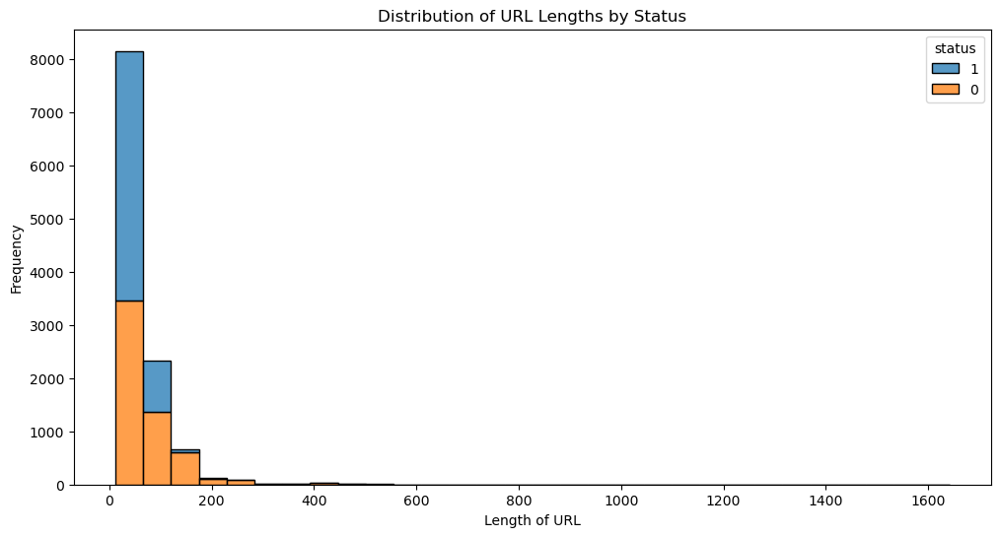

In [12]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df, x='length_url', hue='status', multiple='stack', bins=30)
plt.title('Distribution of URL Lengths by Status')
plt.xlabel('Length of URL')
plt.ylabel('Frequency')
plt.show()

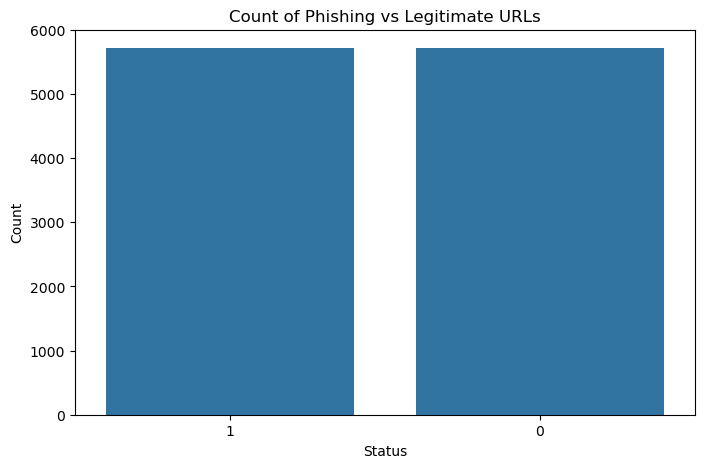

In [13]:
status_counts = df['status'].value_counts()

# Plot the counts
plt.figure(figsize=(8, 5))
sns.barplot(x=status_counts.index, y=status_counts.values)
plt.title('Count of Phishing vs Legitimate URLs')
plt.xlabel('Status')
plt.ylabel('Count')
plt.show()

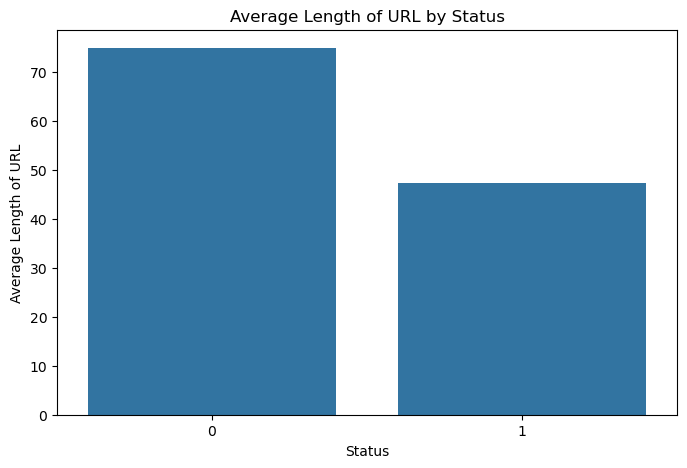

In [14]:
avg_length = df.groupby('status')['length_url'].mean().reset_index()


plt.figure(figsize=(8, 5))
sns.barplot(x='status', y='length_url', data=avg_length)
plt.title('Average Length of URL by Status')
plt.xlabel('Status')
plt.ylabel('Average Length of URL')
plt.show()

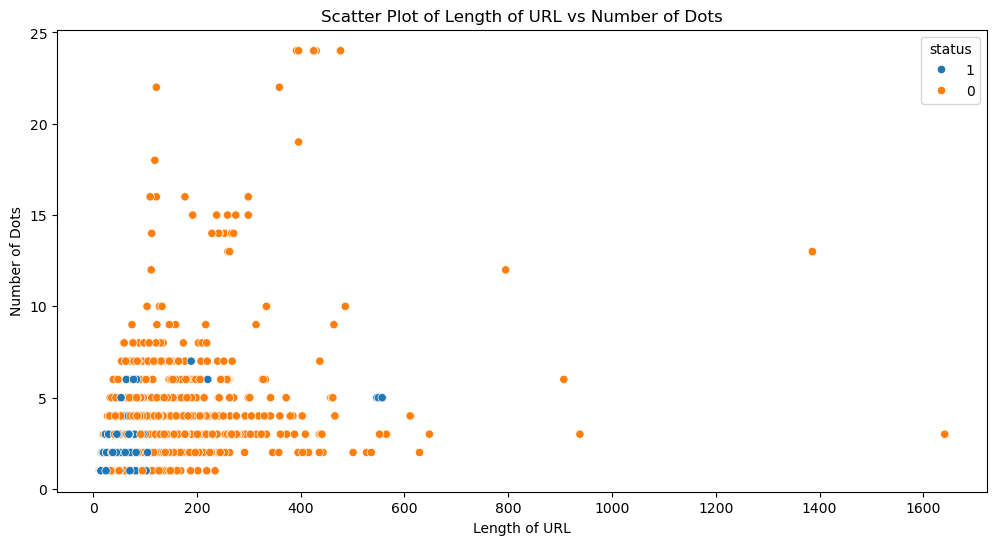

In [15]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='length_url', y='nb_dots', hue='status', data=df)
plt.title('Scatter Plot of Length of URL vs Number of Dots')
plt.xlabel('Length of URL')
plt.ylabel('Number of Dots')
plt.show()

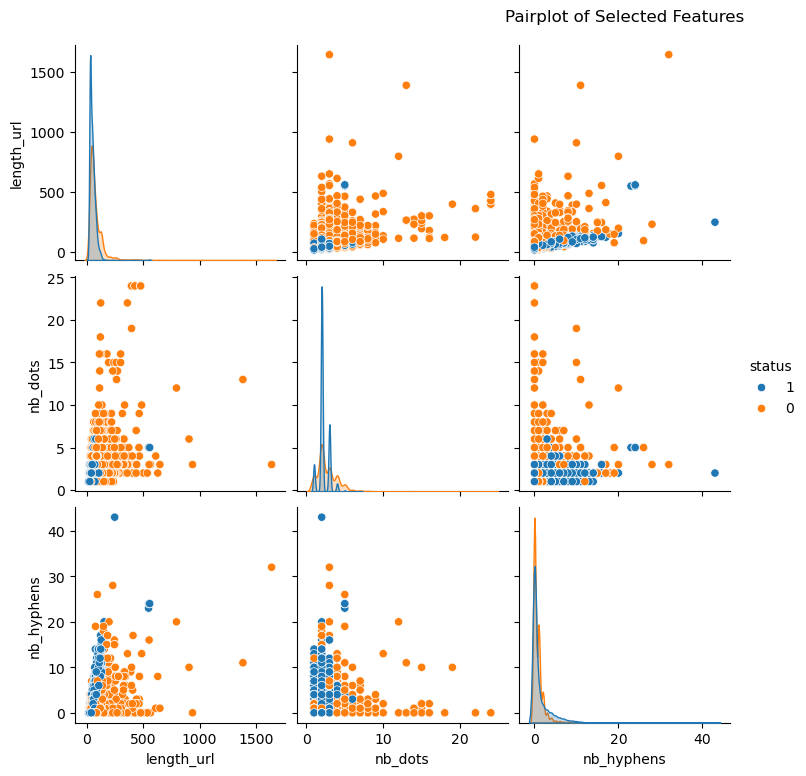

In [16]:
selected_features = df[['length_url', 'nb_dots', 'nb_hyphens', 'status']]

# Pairplot
sns.pairplot(selected_features, hue='status')
plt.title('Pairplot of Selected Features',pad=350)
plt.show()

In [17]:
df.columns

Index(['length_url', 'length_hostname', 'ip', 'nb_dots', 'nb_hyphens', 'nb_at',
       'nb_qm', 'nb_and', 'nb_or', 'nb_eq', 'nb_underscore', 'nb_tilde',
       'nb_percent', 'nb_slash', 'nb_star', 'nb_colon', 'nb_comma',
       'nb_semicolumn', 'nb_dollar', 'nb_space', 'nb_www', 'nb_com',
       'nb_dslash', 'http_in_path', 'https_token', 'ratio_digits_url',
       'ratio_digits_host', 'punycode', 'port', 'tld_in_path',
       'tld_in_subdomain', 'abnormal_subdomain', 'nb_subdomains',
       'prefix_suffix', 'random_domain', 'shortening_service',
       'path_extension', 'nb_redirection', 'nb_external_redirection',
       'length_words_raw', 'char_repeat', 'shortest_words_raw',
       'shortest_word_host', 'shortest_word_path', 'longest_words_raw',
       'longest_word_host', 'longest_word_path', 'avg_words_raw',
       'avg_word_host', 'avg_word_path', 'phish_hints', 'domain_in_brand',
       'brand_in_subdomain', 'brand_in_path', 'suspecious_tld',
       'statistical_report', 'nb_hyp

In [18]:
columns_to_plot = df.columns.difference(['url', 'status'])
plt.figure(figsize=(150, 70))

# Create box plots for each column against 'status'
for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(10, 9, i)  # Adjust the number of rows and columns as needed
    sns.violinplot(x='status', y=column, data=df)
    plt.title(f'Box Plot of {column} by Status')
    plt.xlabel('Status (1 = Legitimate, 0 = Phishing)')
    plt.ylabel(column)

plt.tight_layout()
plt.show()


In [19]:
df["status"]=df["status"].astype('category')
df["status"].dtype


CategoricalDtype(categories=['0', '1'], ordered=False, categories_dtype=object)


Analyzing column: length_url


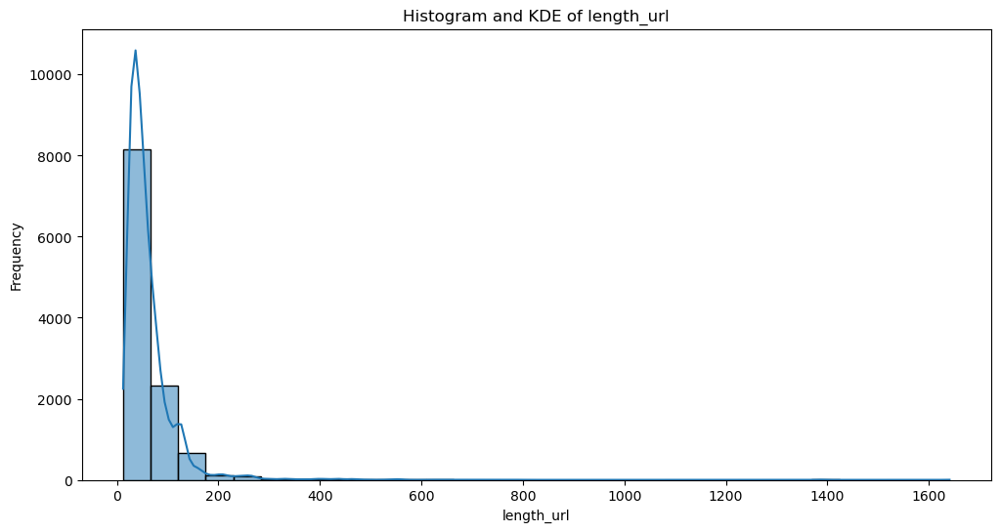

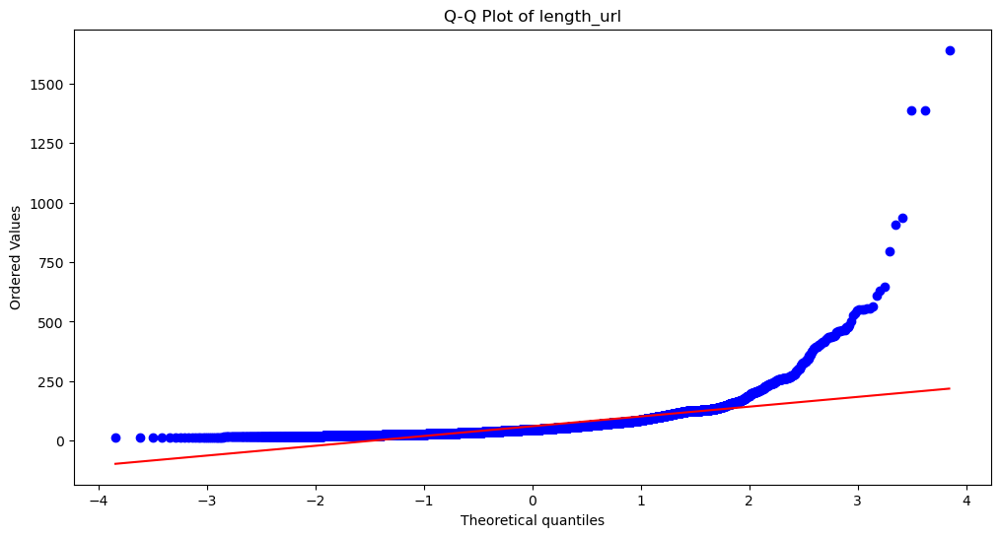

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.552, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: length_hostname


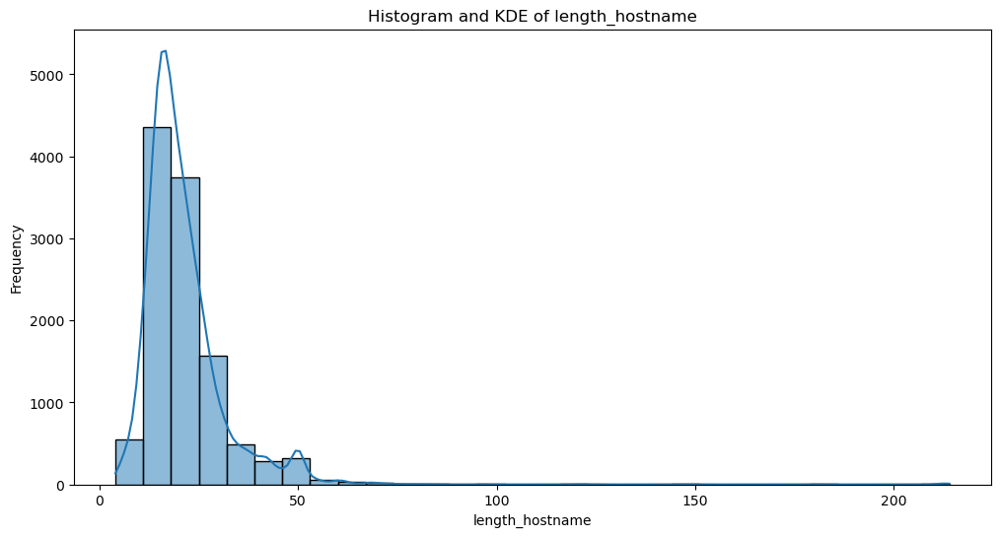

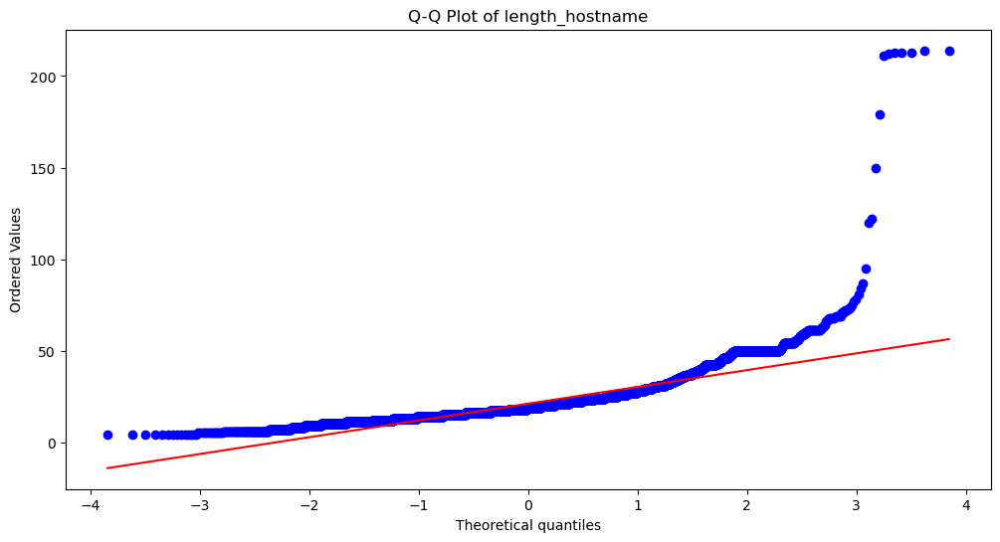

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.723, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_dots


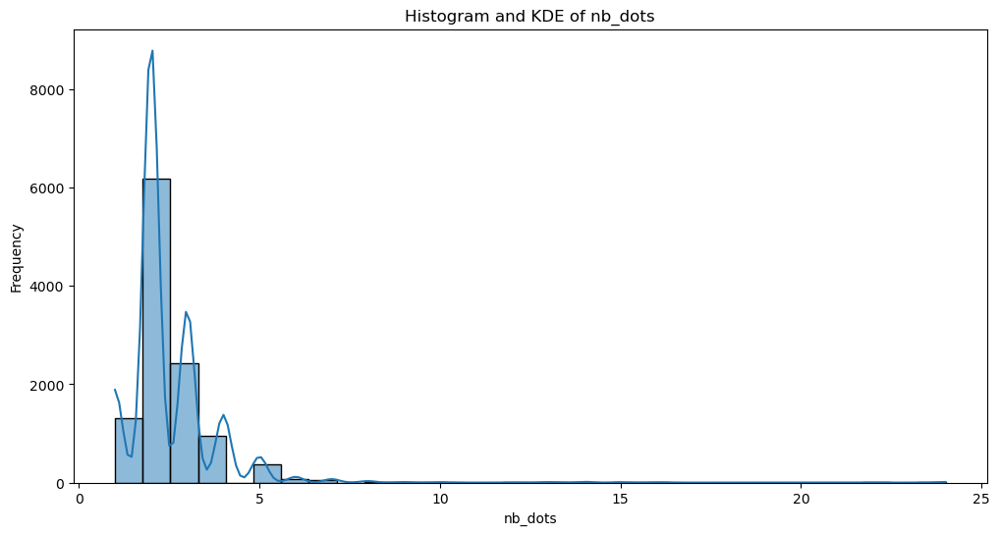

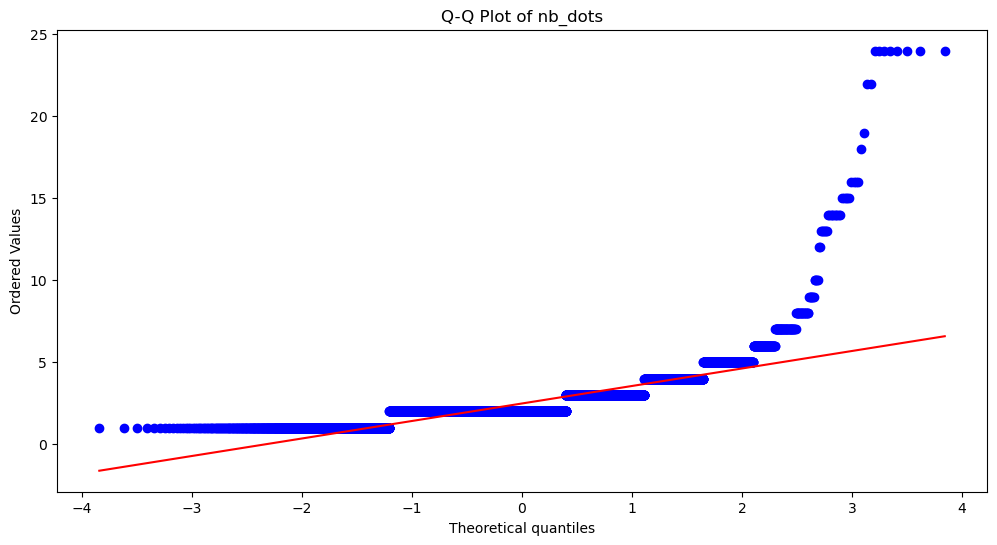

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.607, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_hyphens


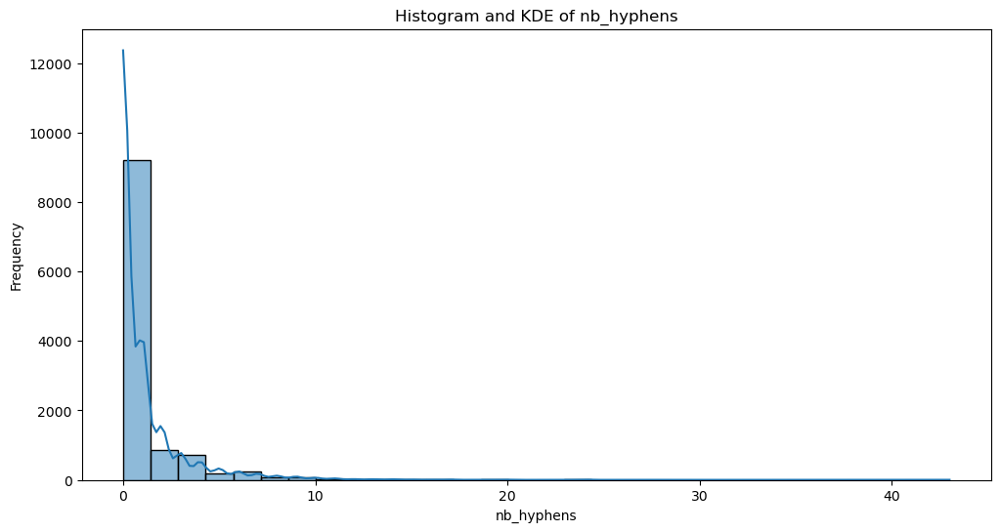

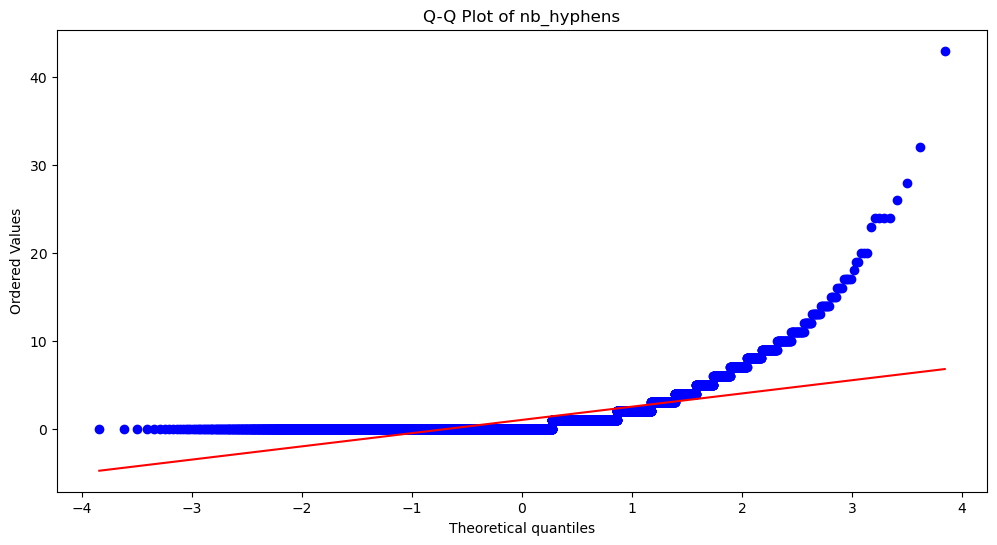

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.520, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_at


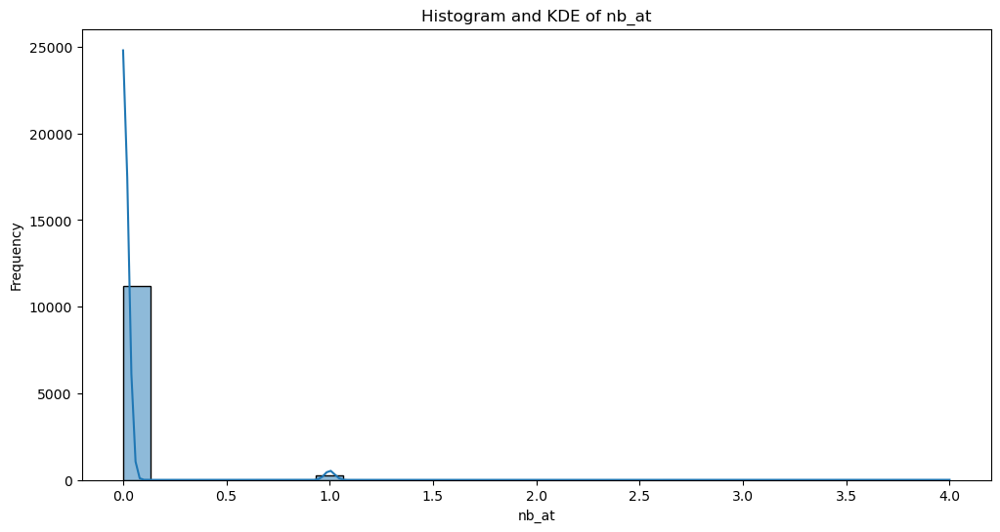

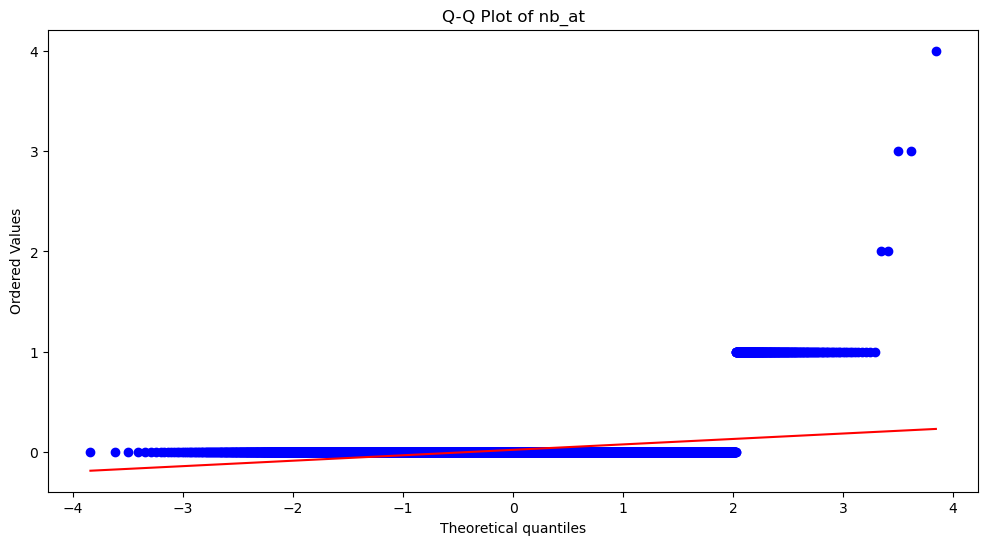

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.122, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_qm


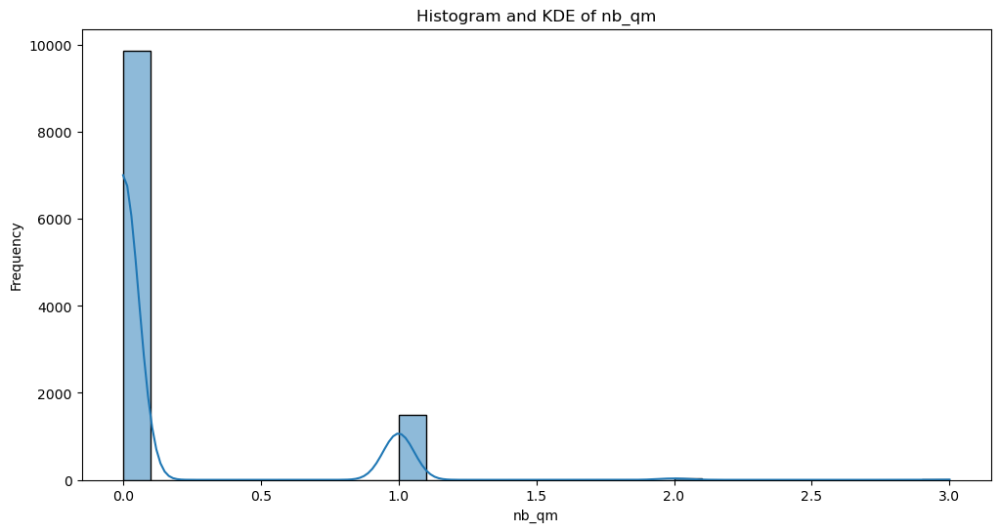

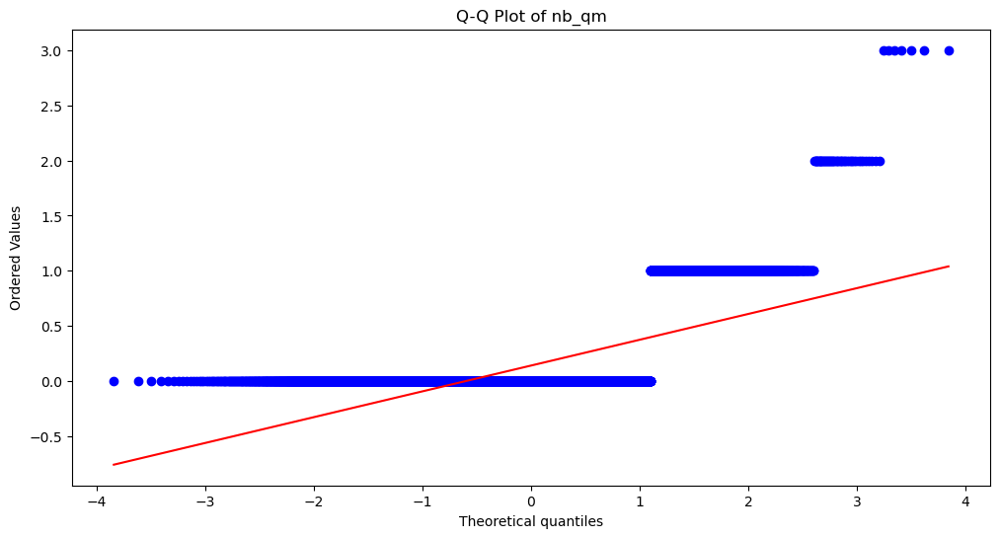

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.411, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_and


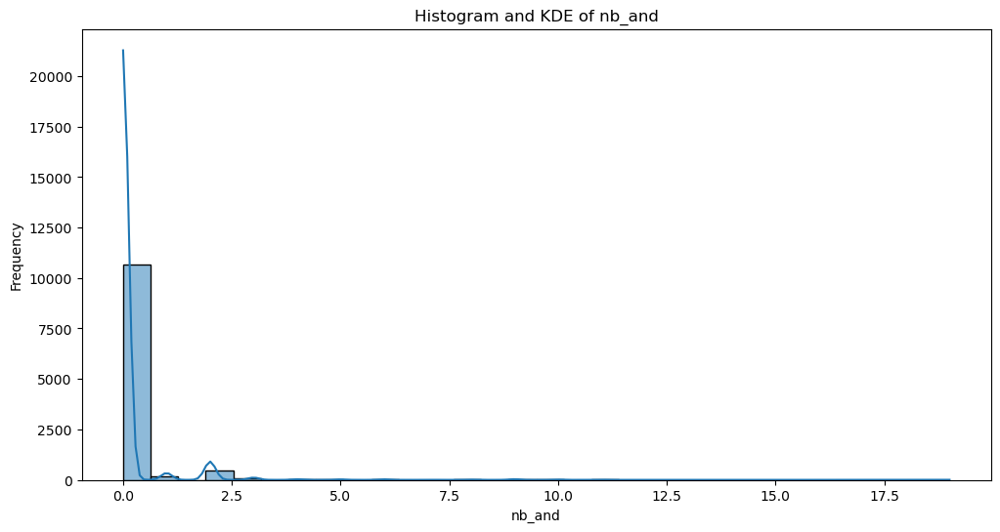

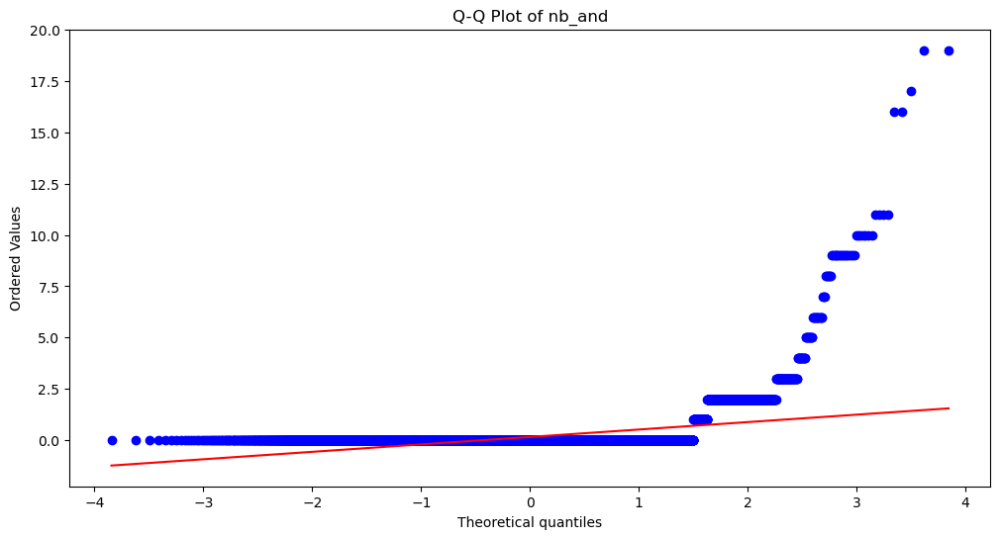

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.195, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_or


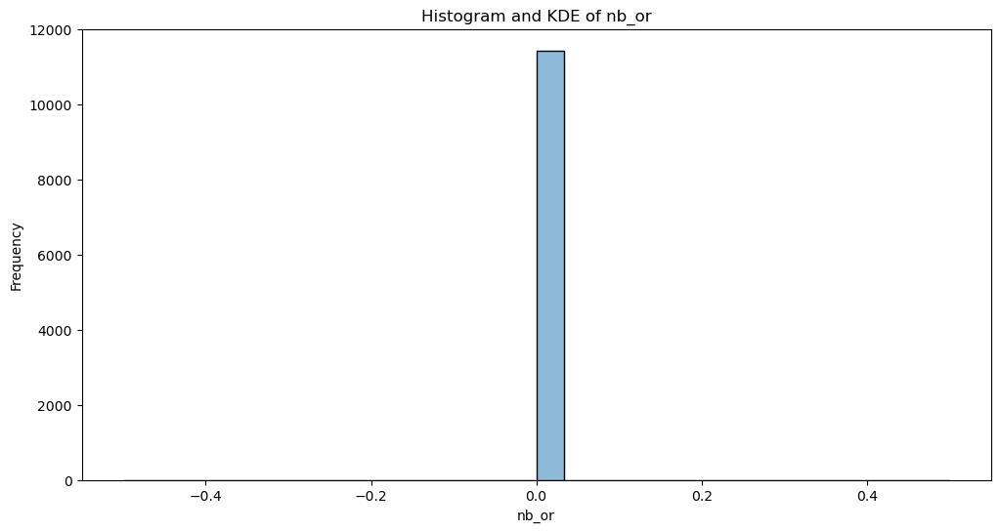

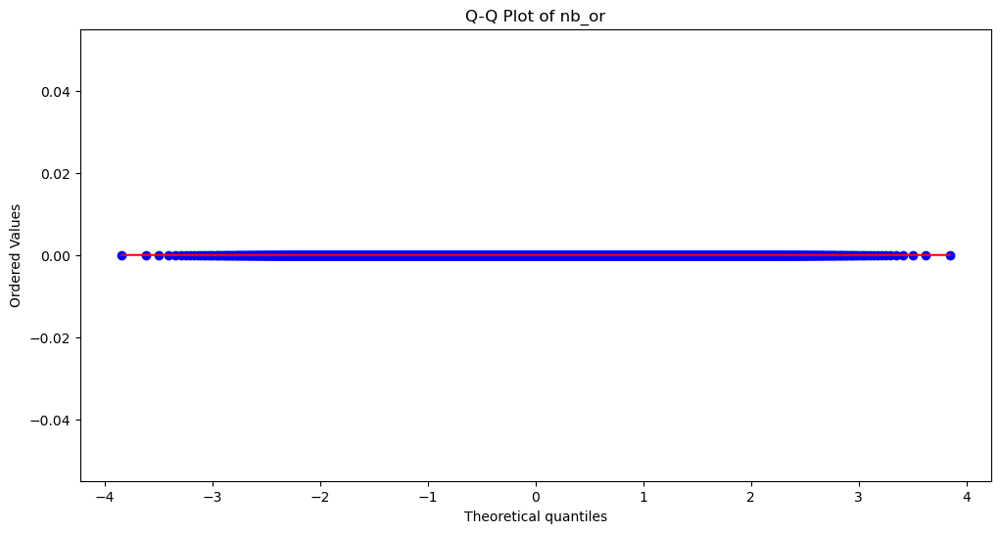

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=1.000, p-value=1.000
Sample looks Gaussian (fail to reject H0)

Analyzing column: nb_eq


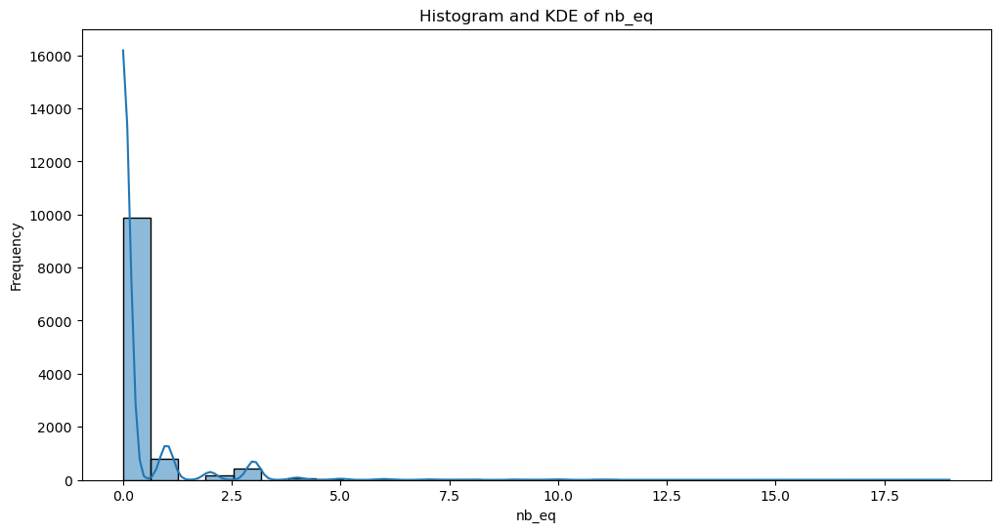

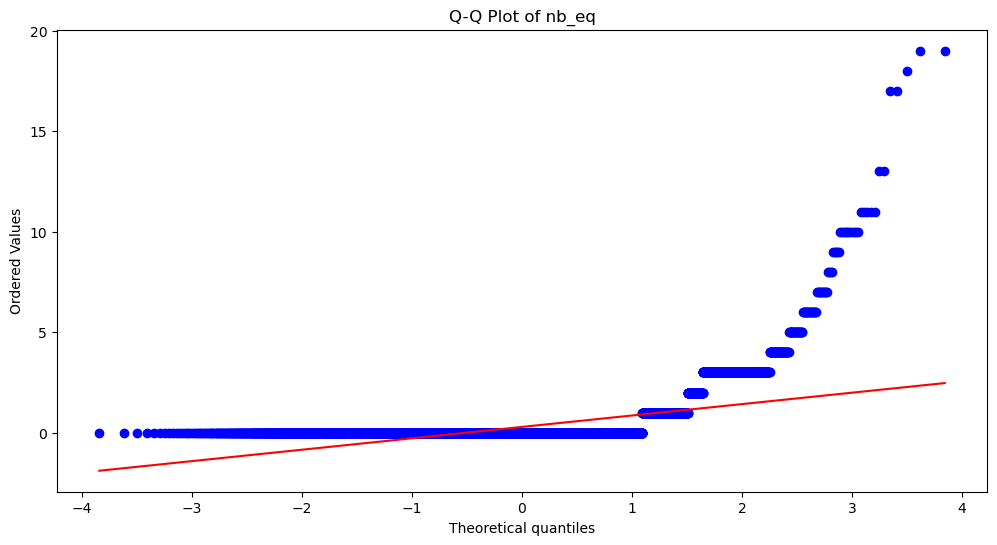

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.323, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_underscore


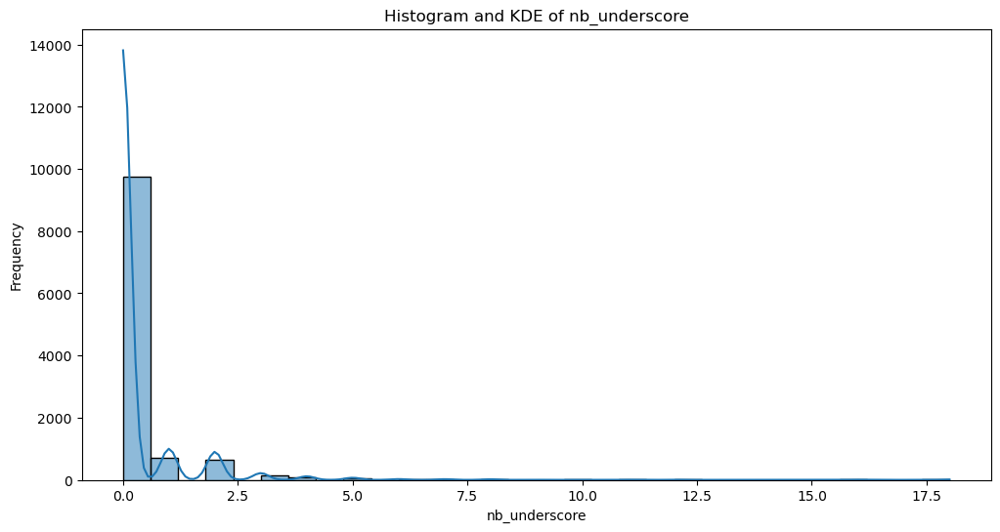

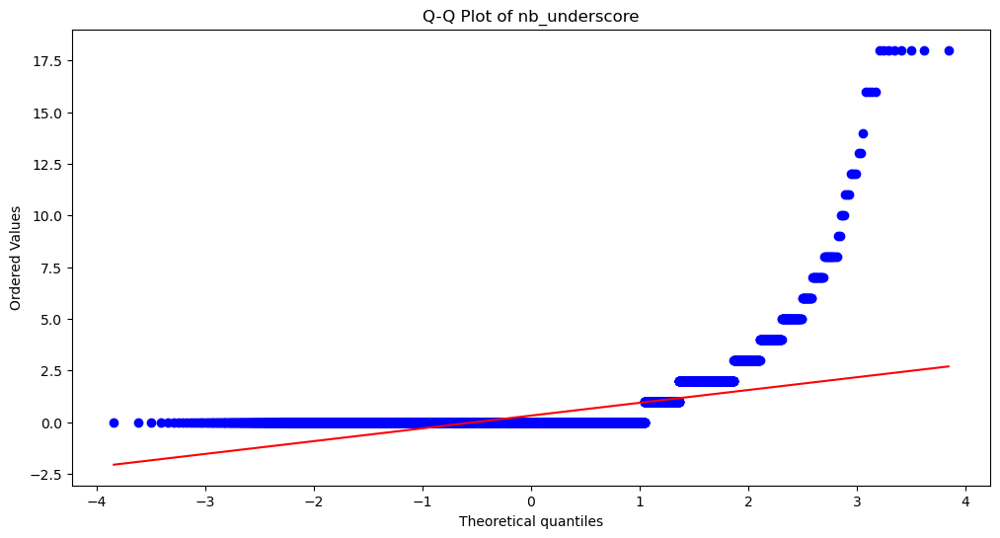

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.320, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_tilde


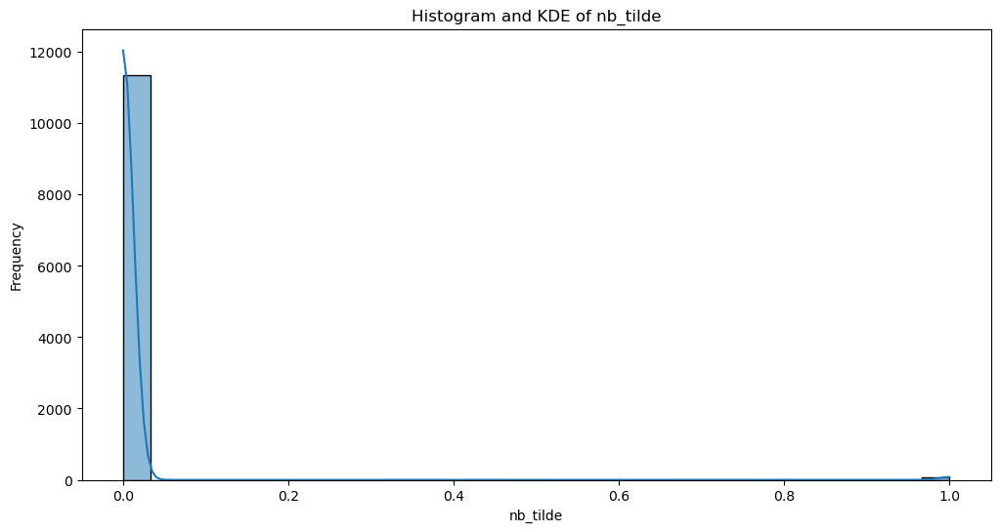

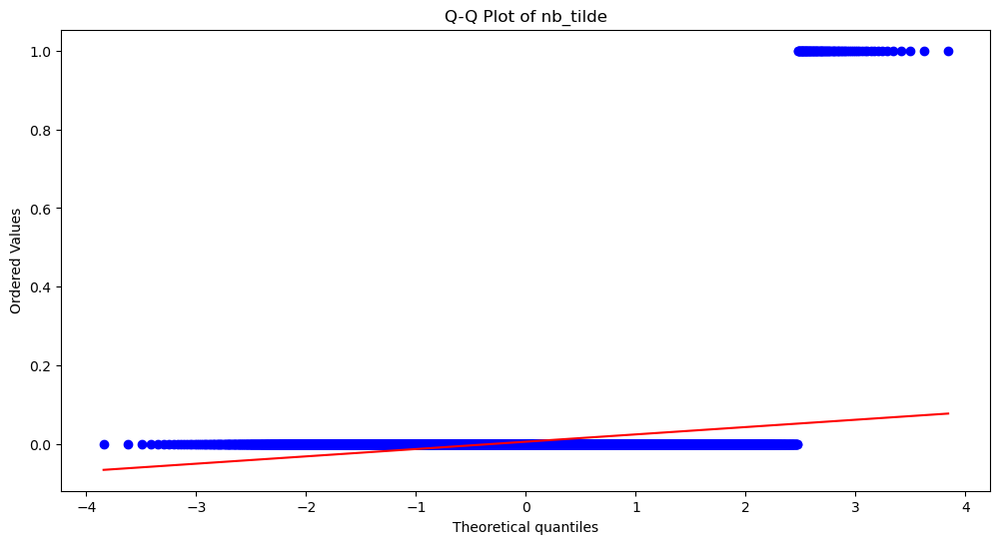

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.052, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_percent


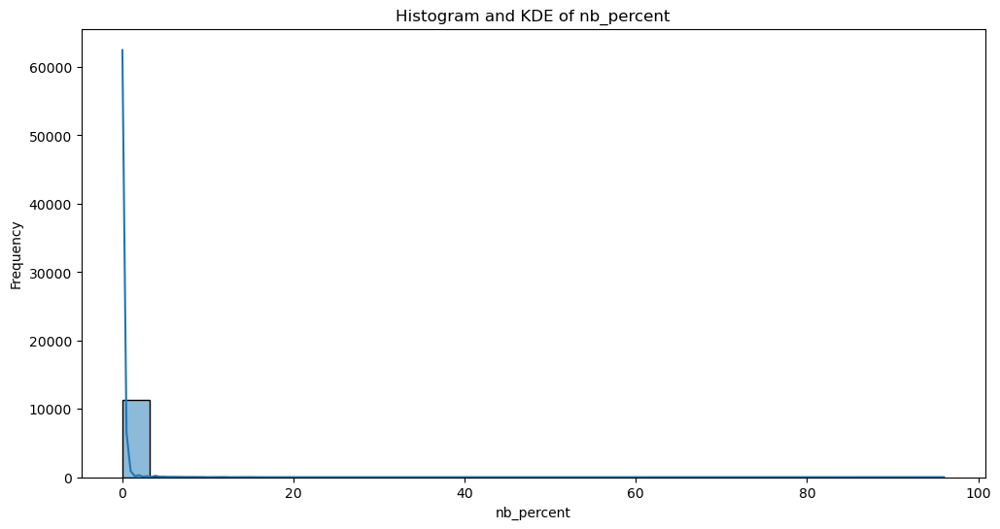

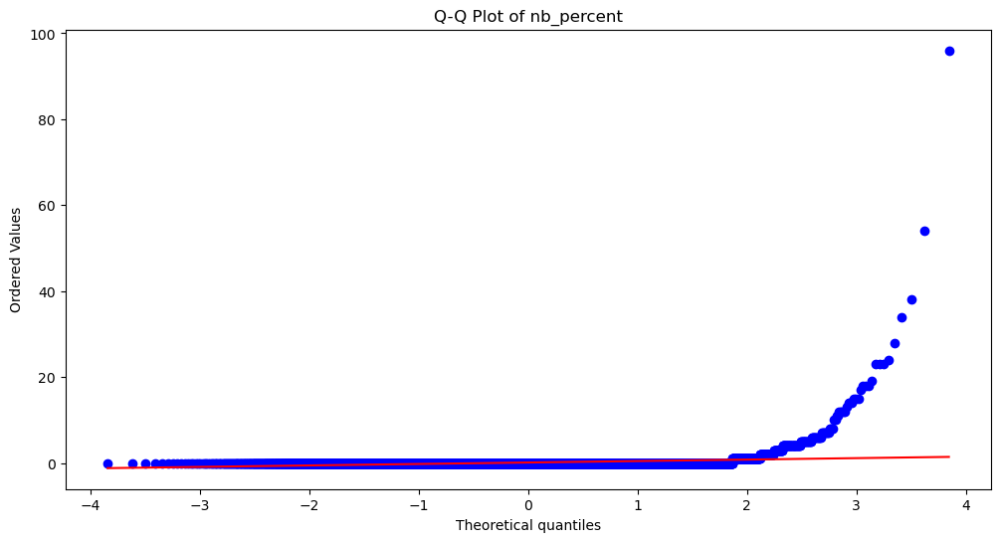

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.054, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_slash


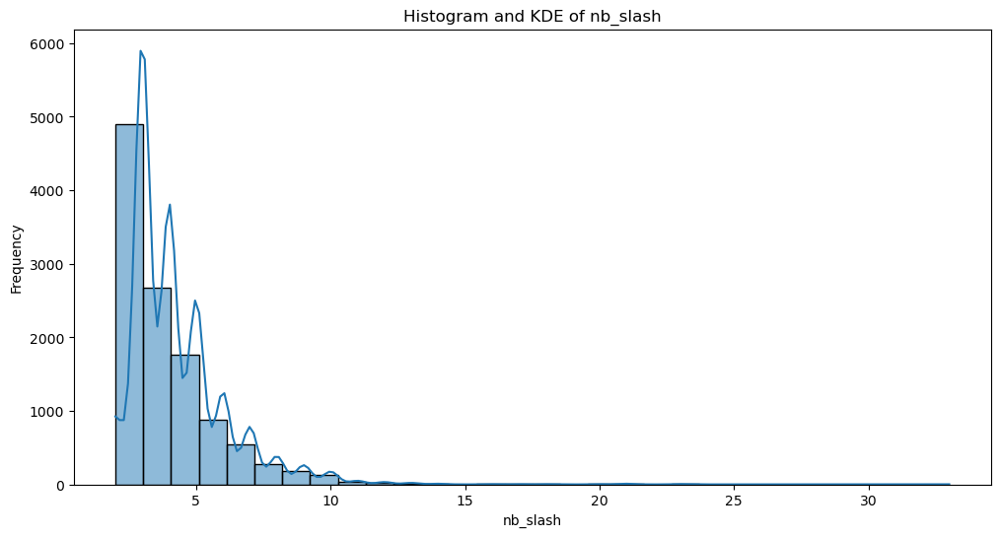

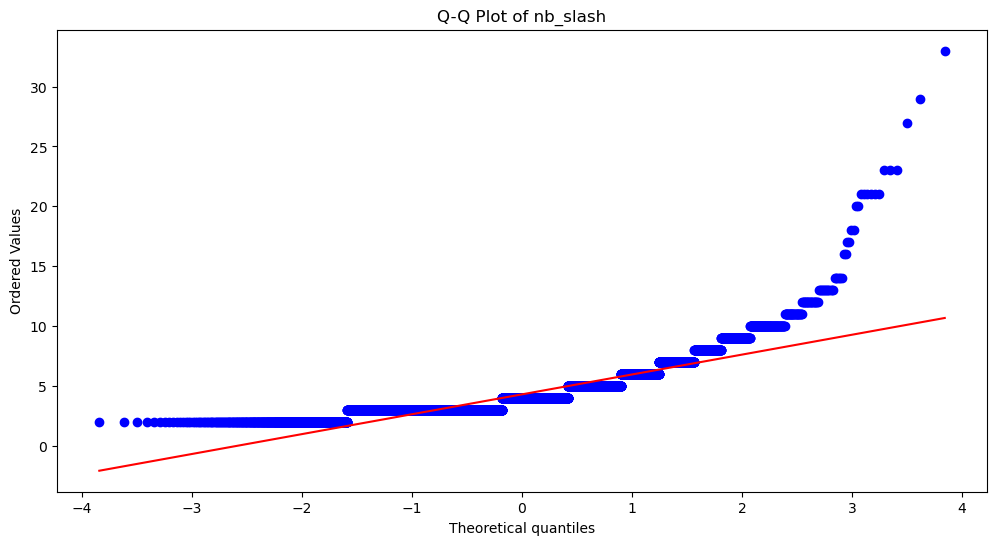

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.778, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_star


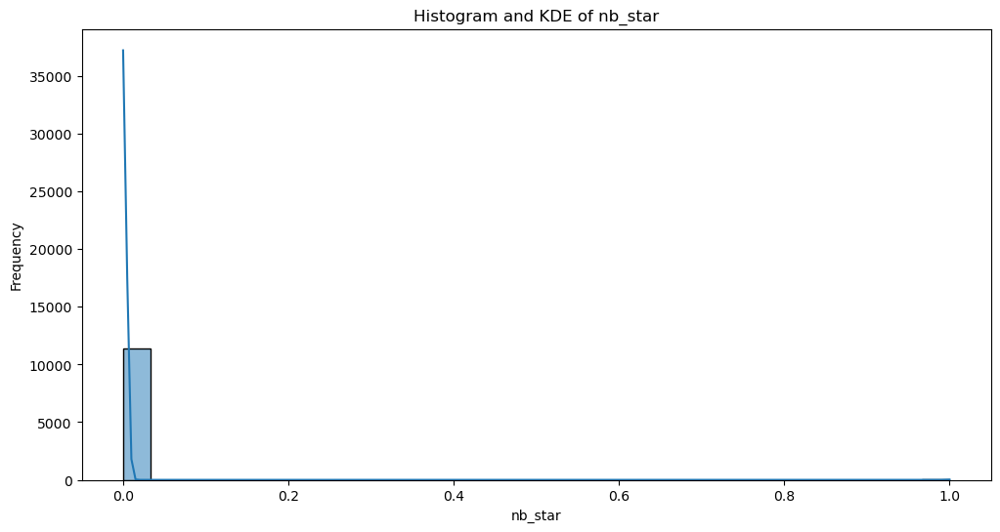

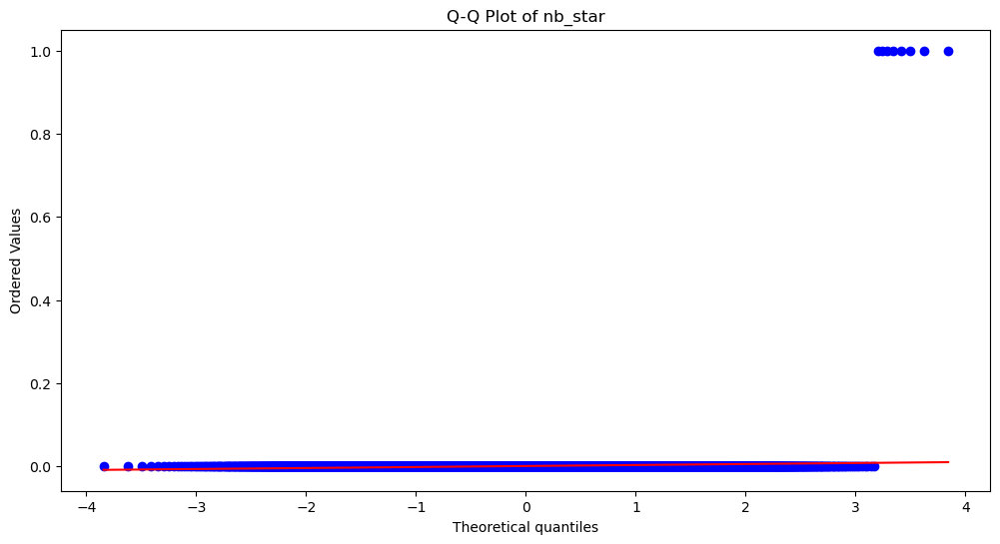

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.008, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_colon


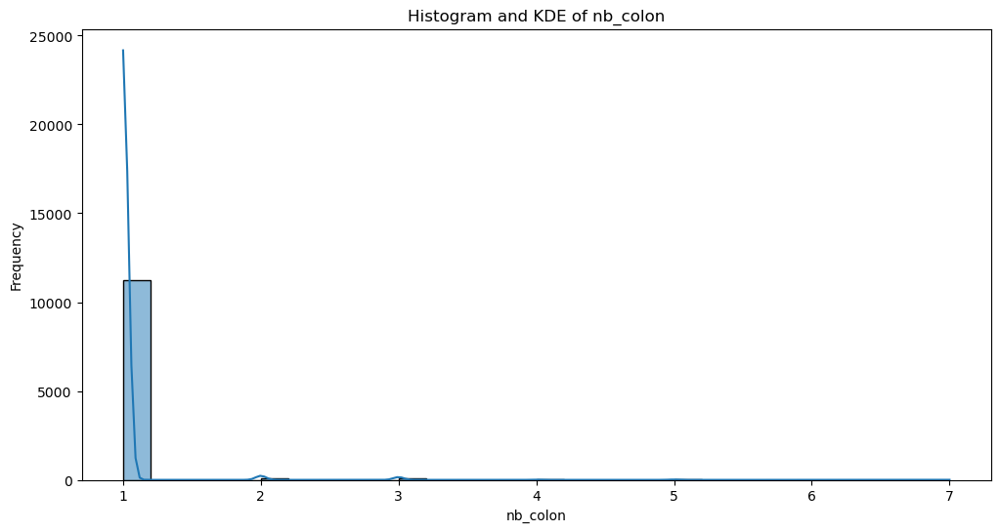

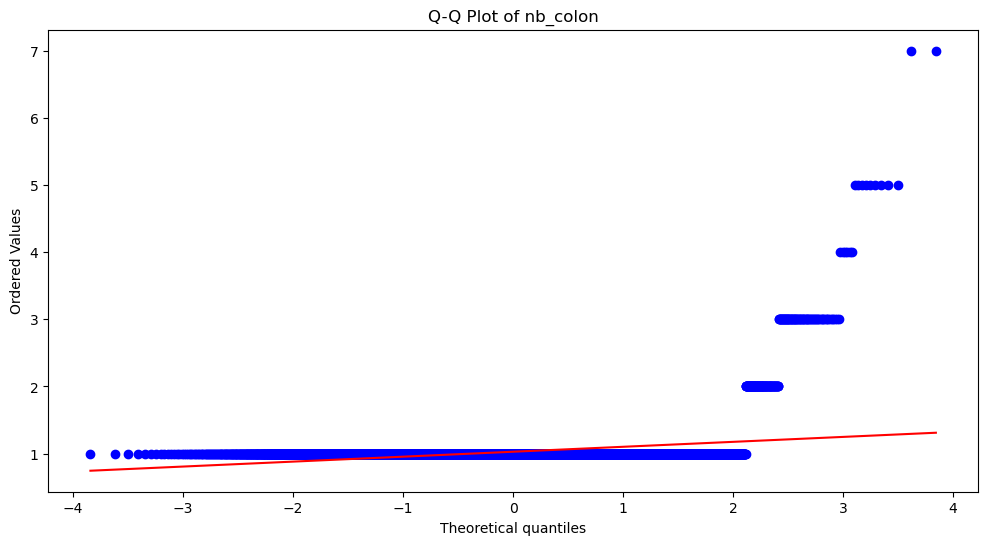

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.094, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_comma


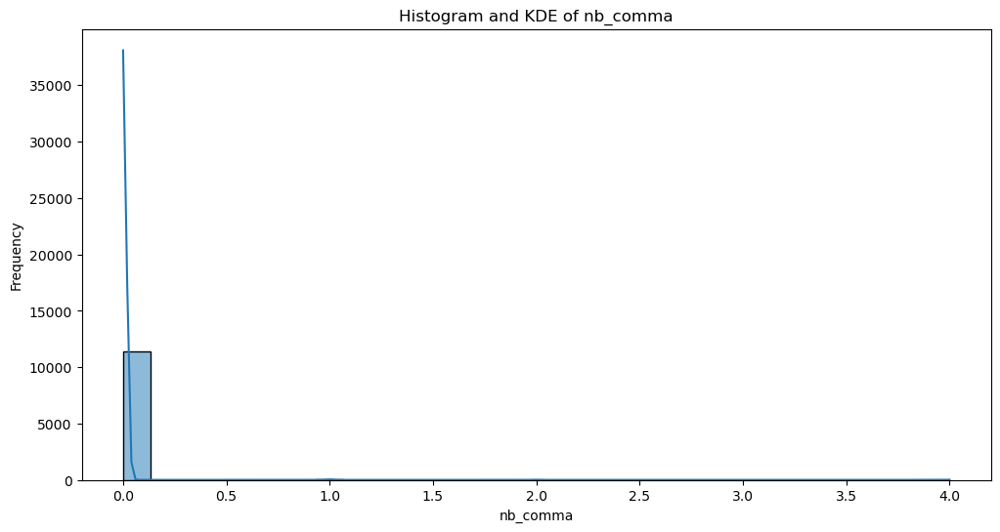

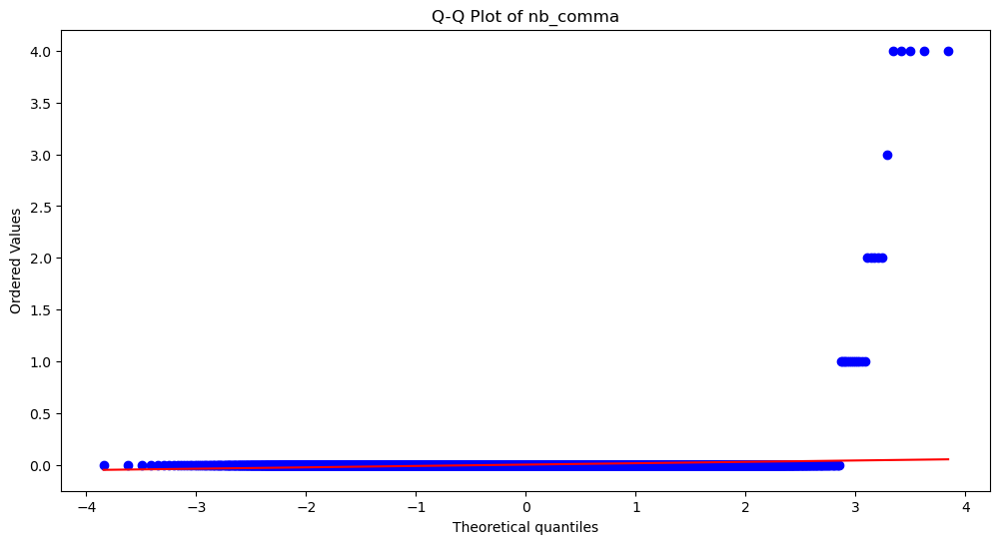

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.017, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_semicolumn


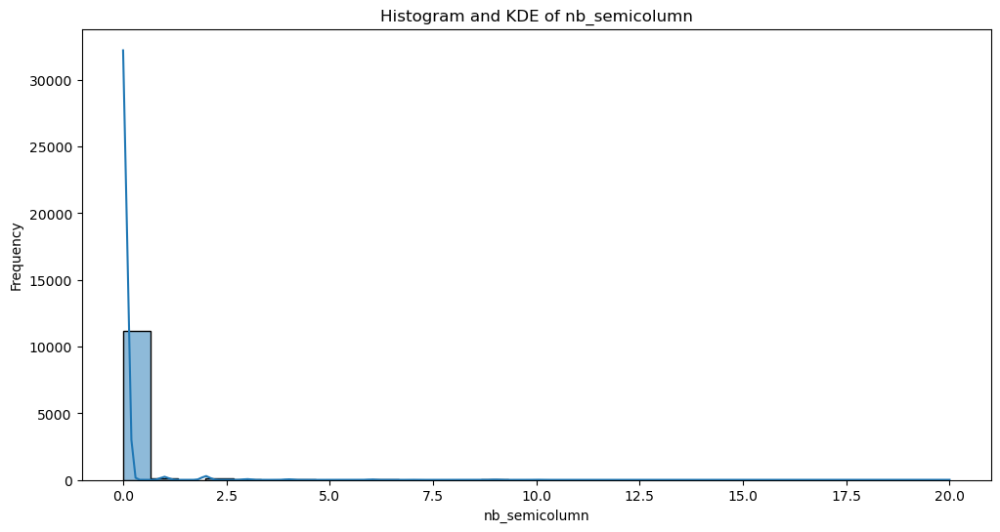

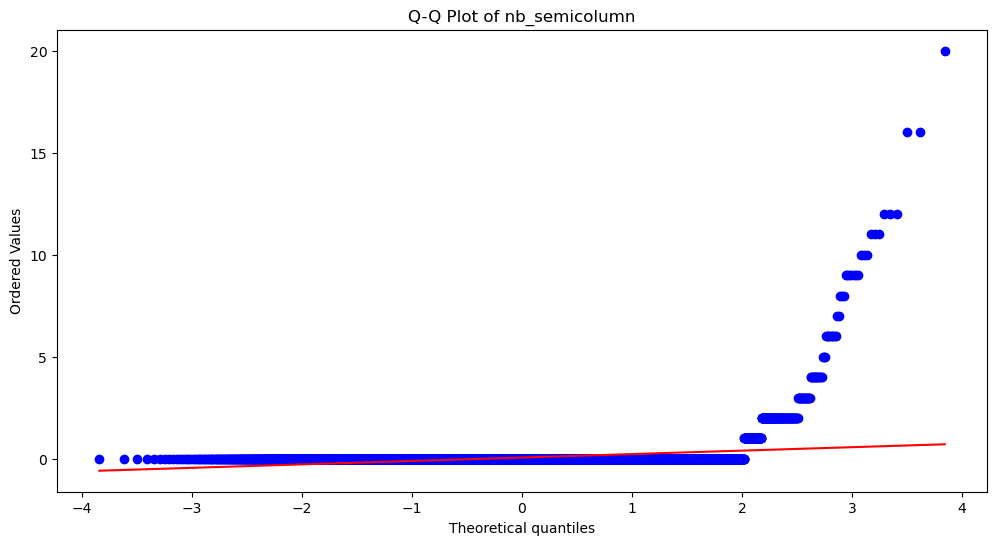

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.080, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_dollar


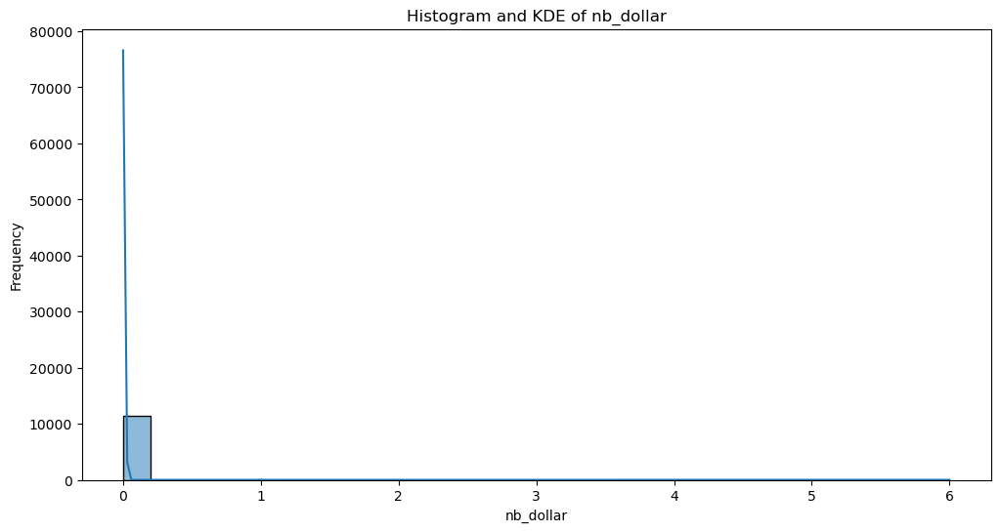

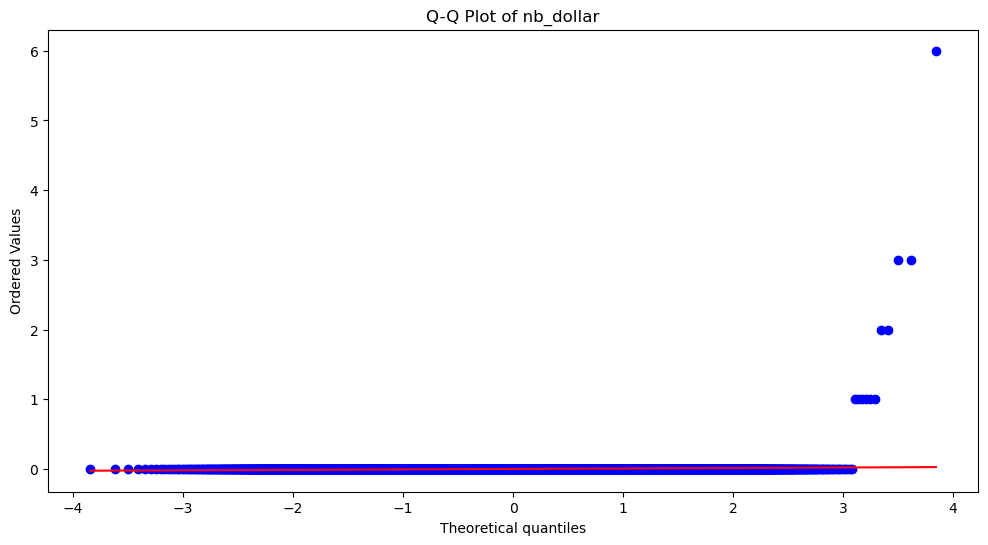

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.008, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_space


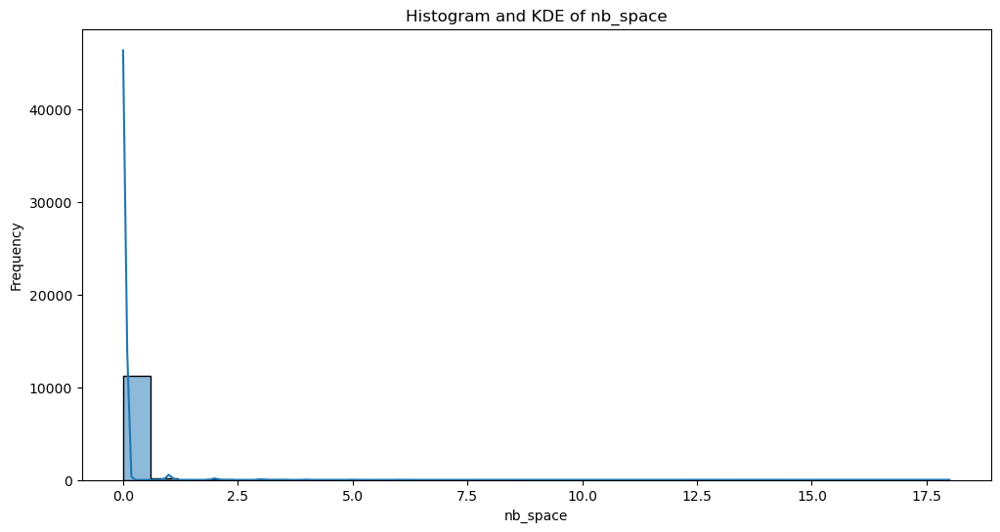

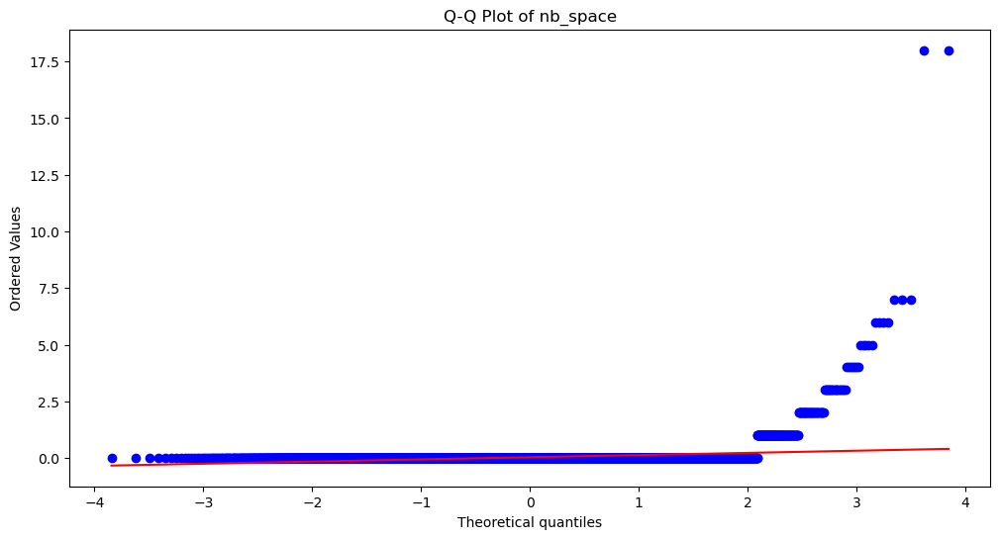

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.065, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_www


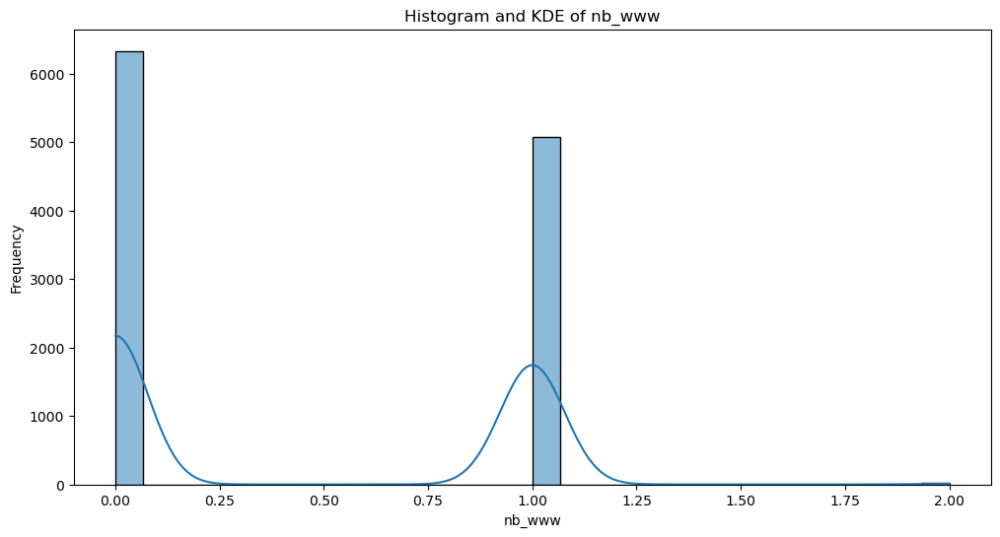

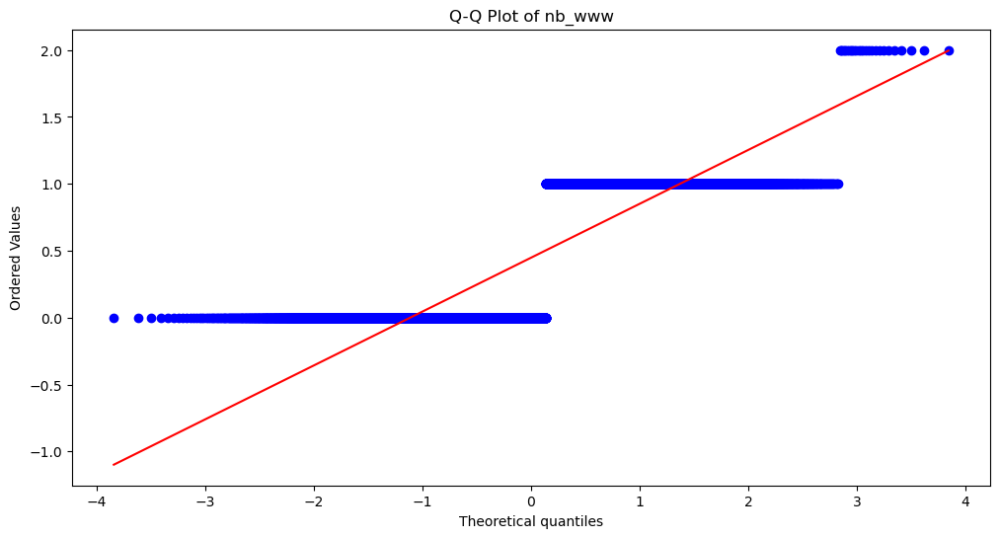

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.643, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_com


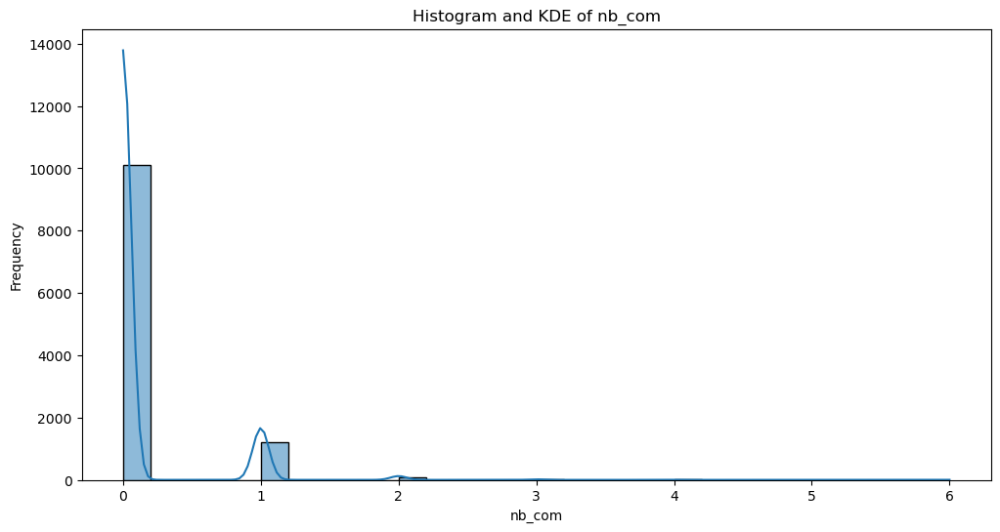

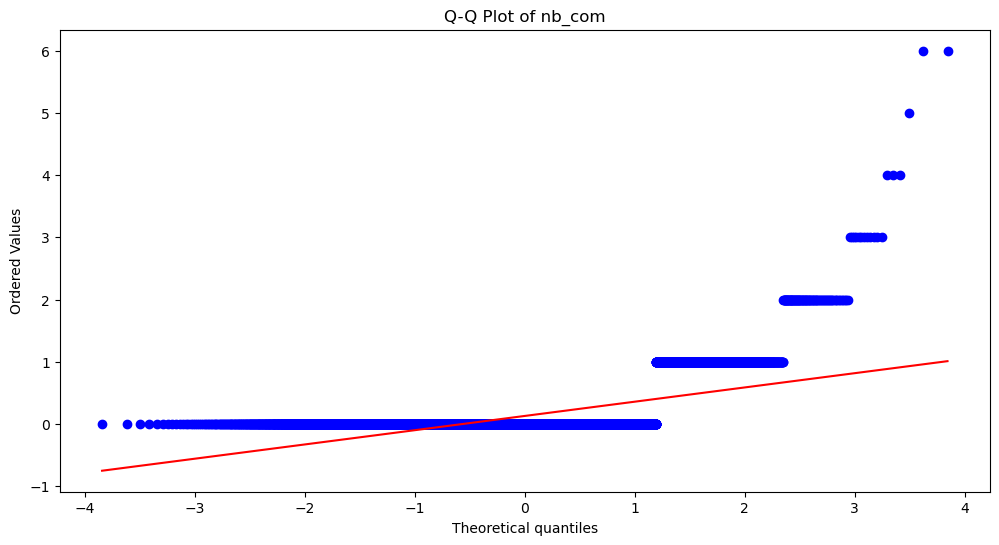

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.366, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_dslash


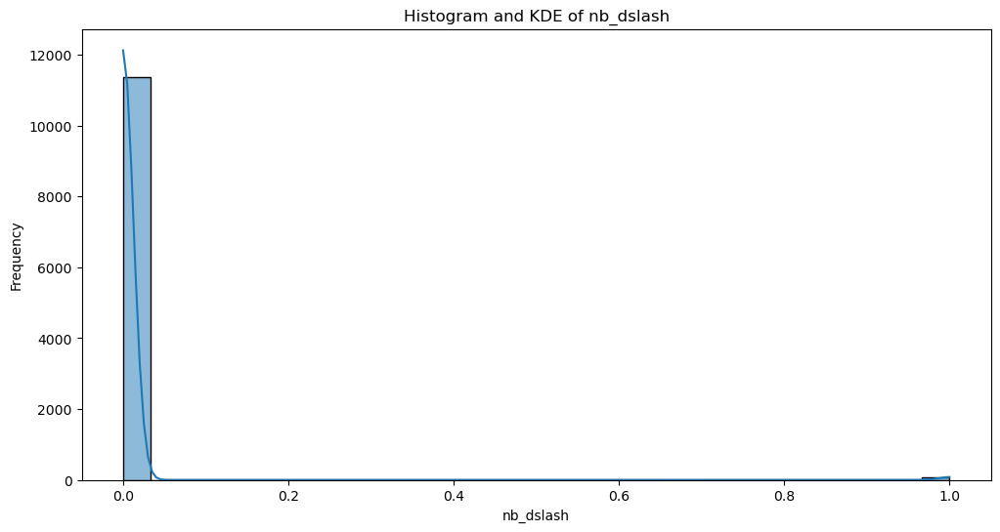

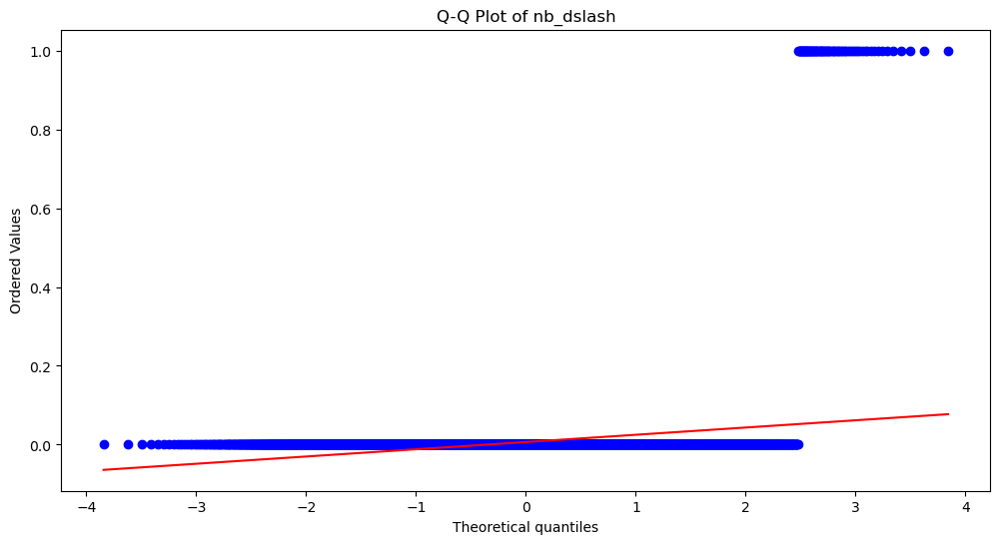

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.052, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: ratio_digits_url


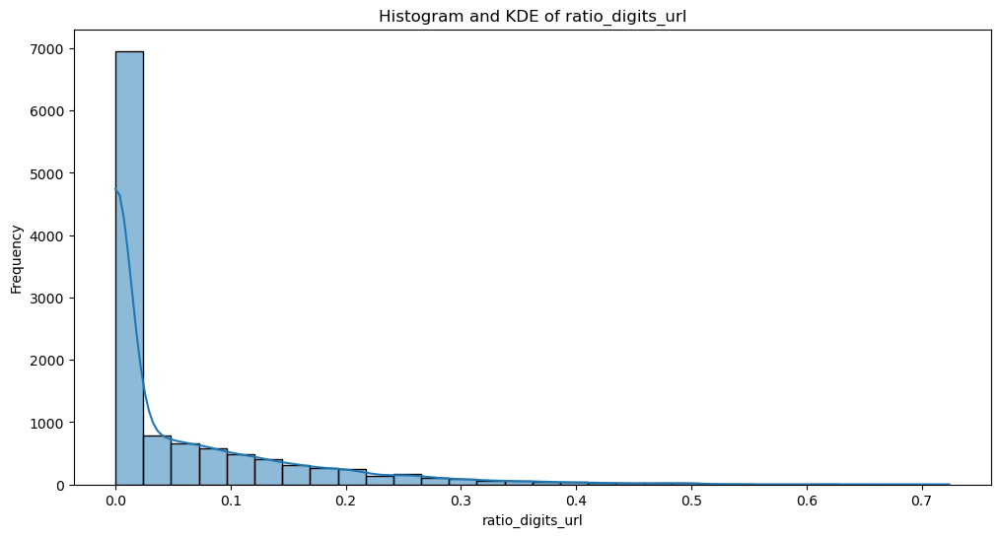

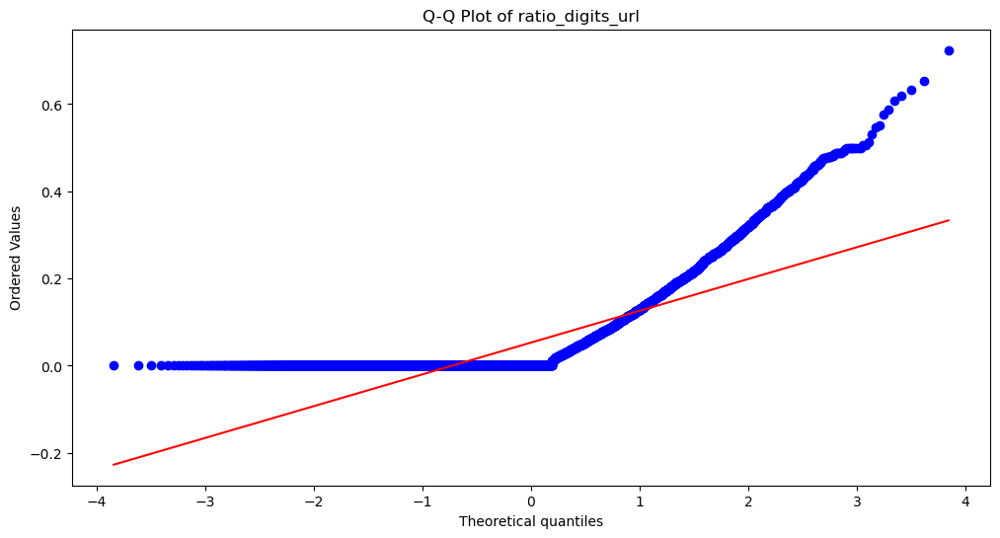

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.665, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: ratio_digits_host


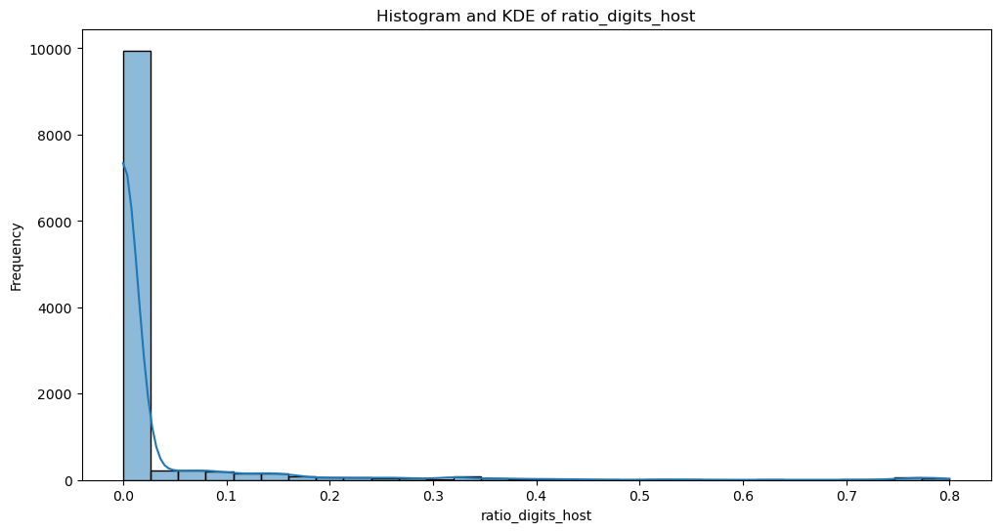

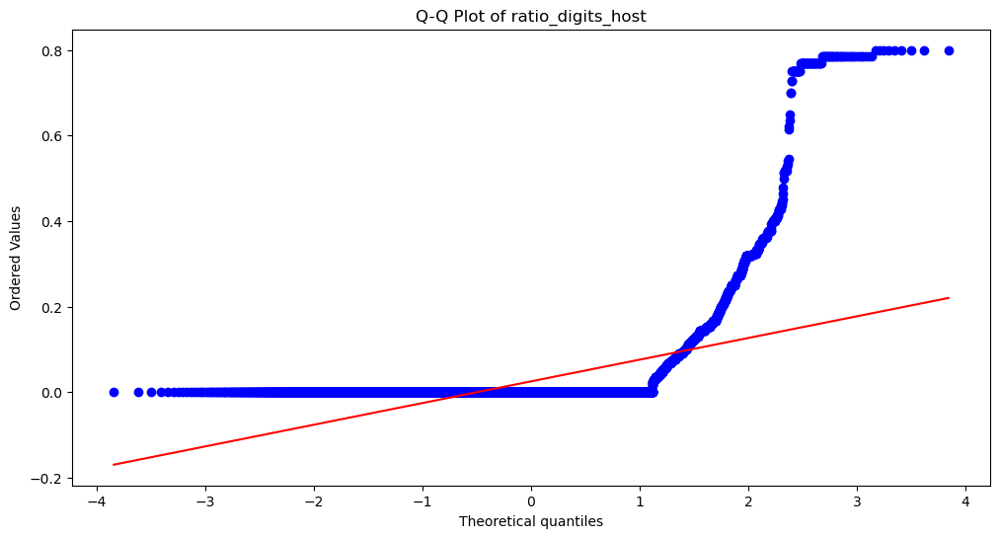

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.295, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: port


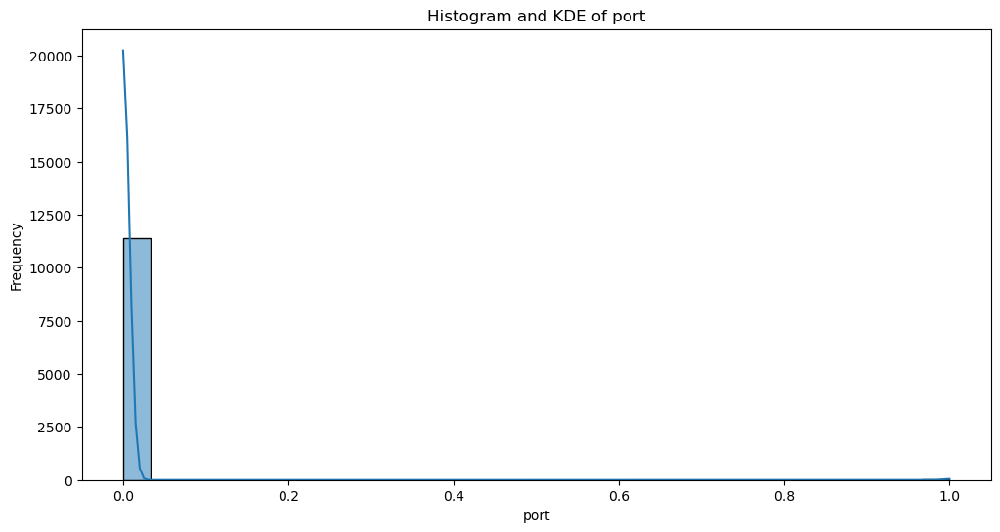

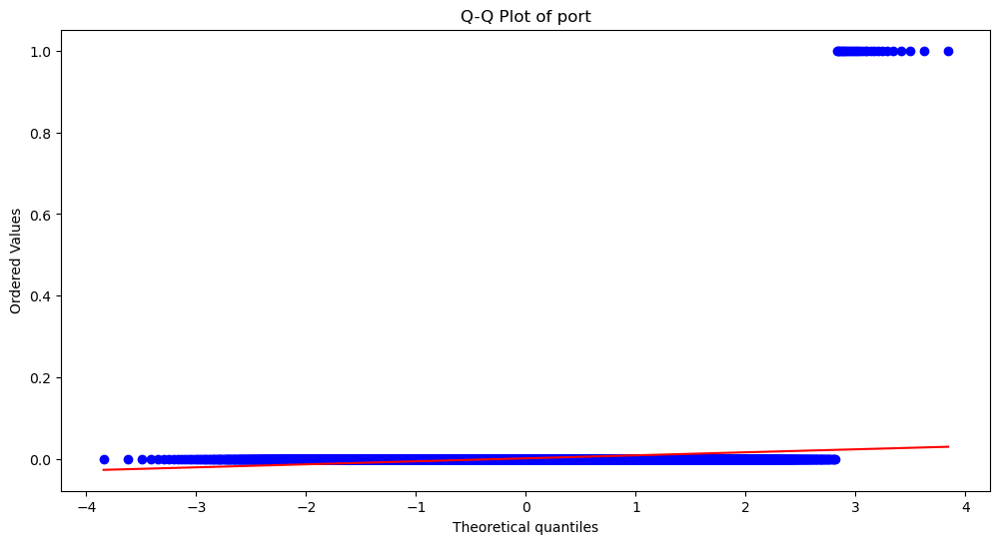

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.023, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_subdomains


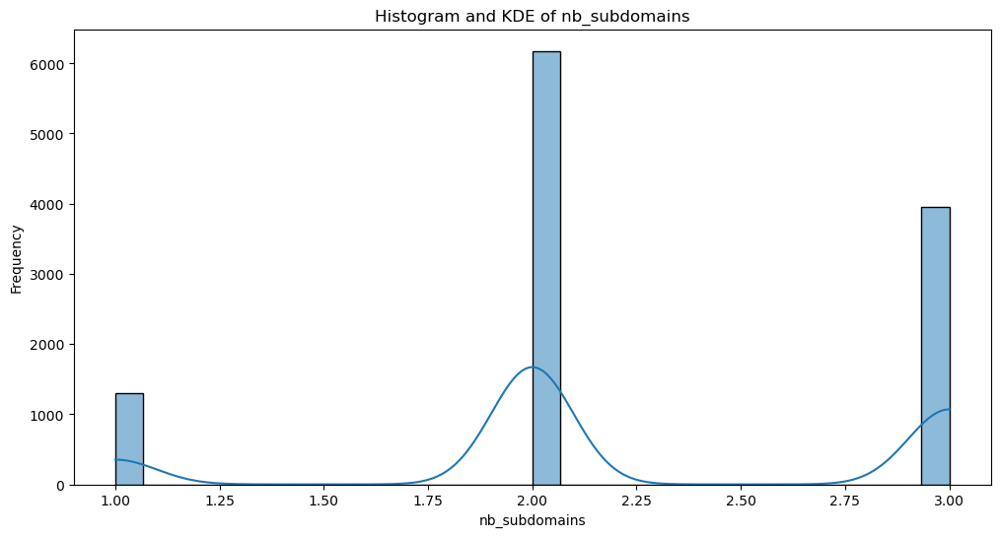

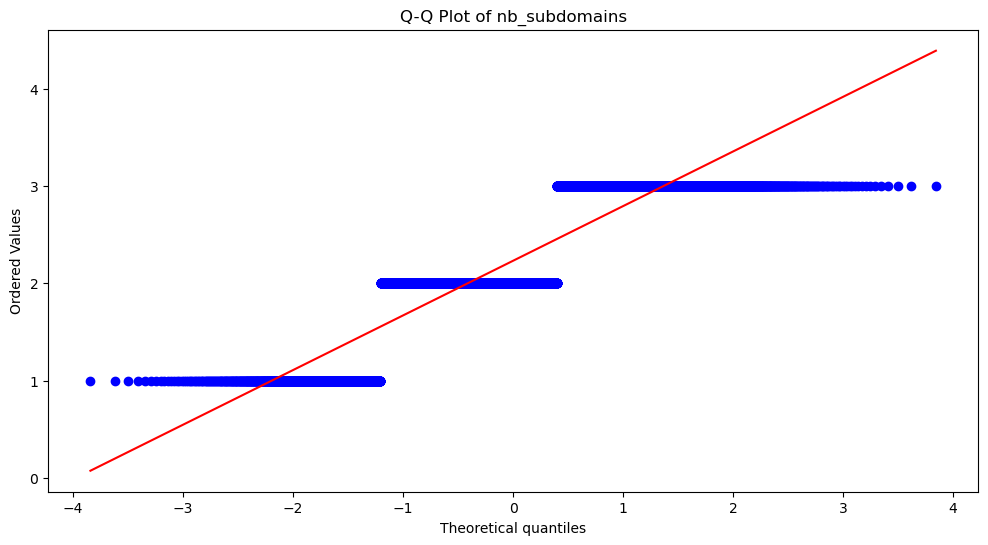

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.777, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: path_extension


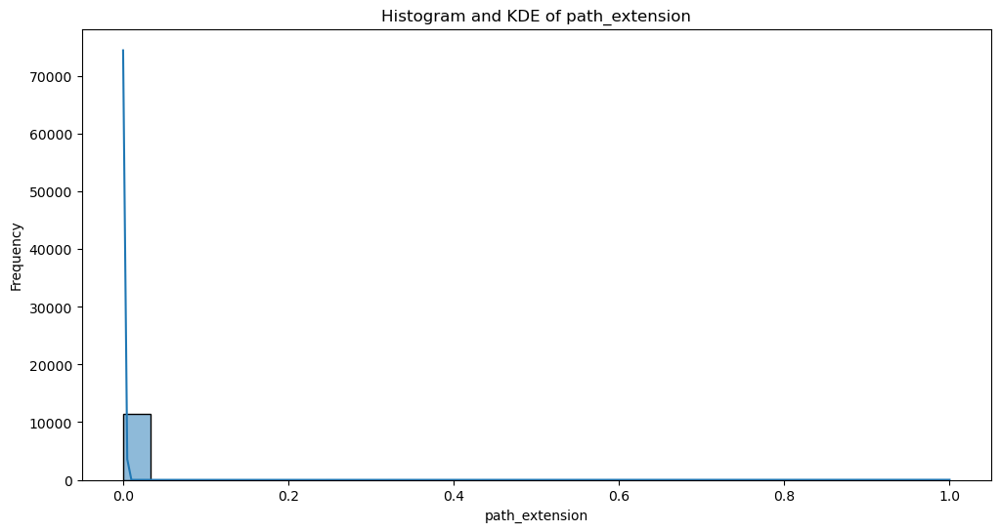

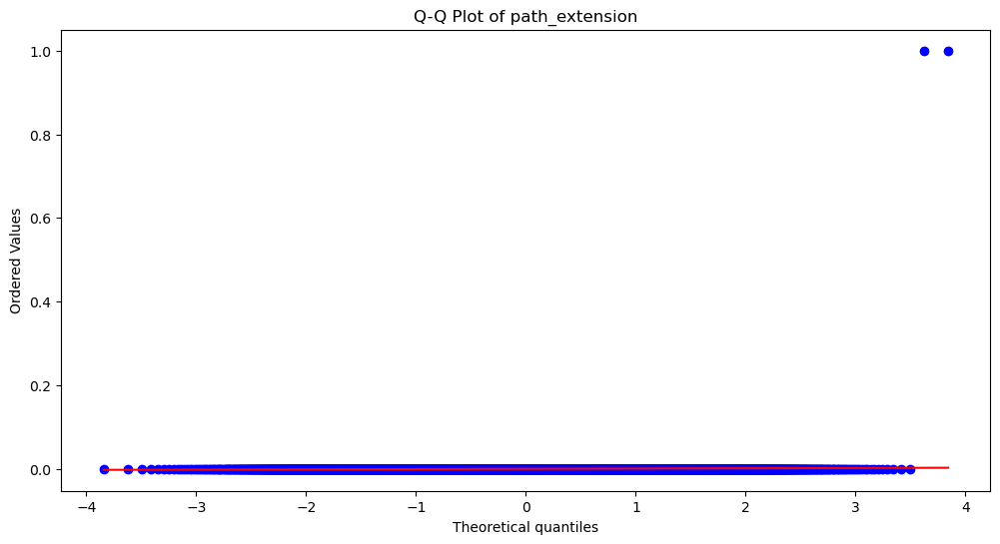

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.003, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_redirection


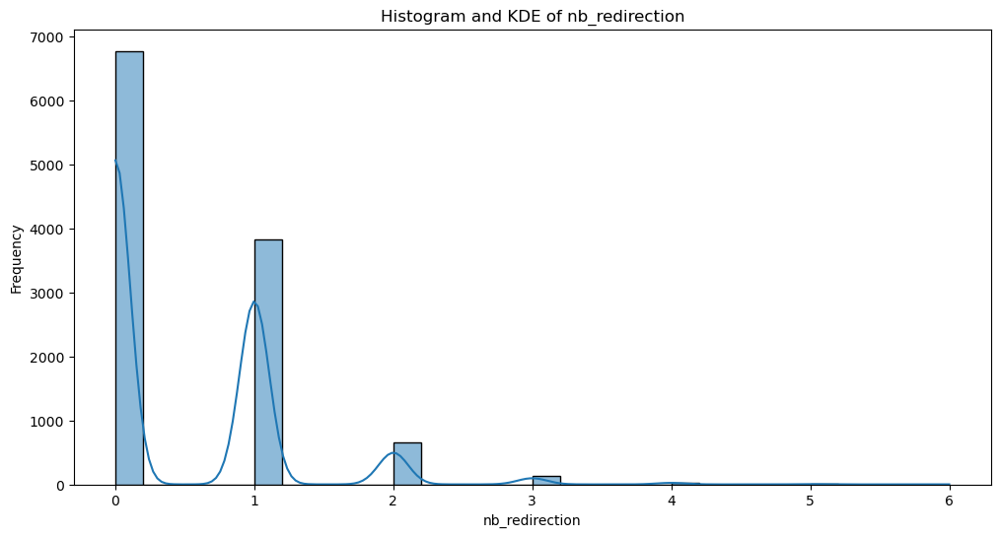

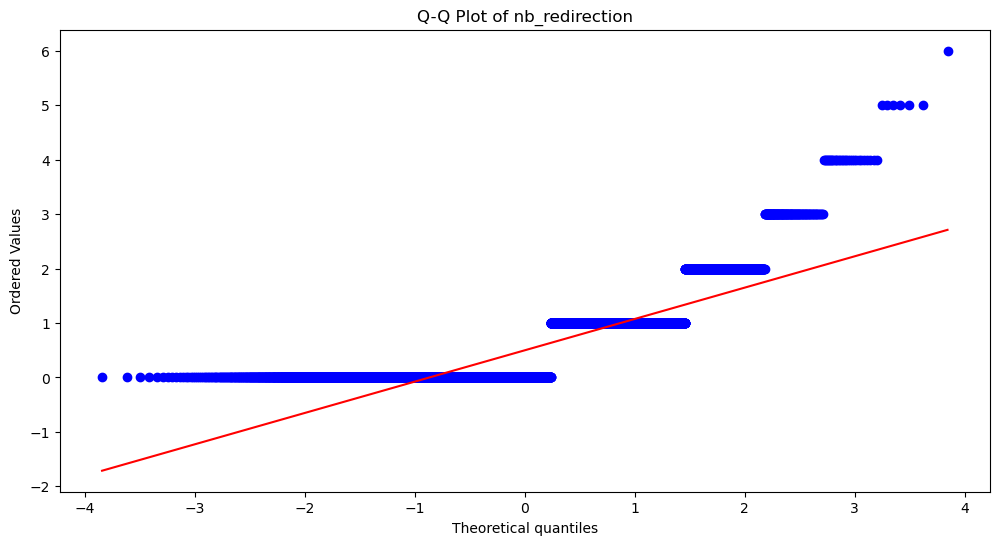

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.691, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_external_redirection


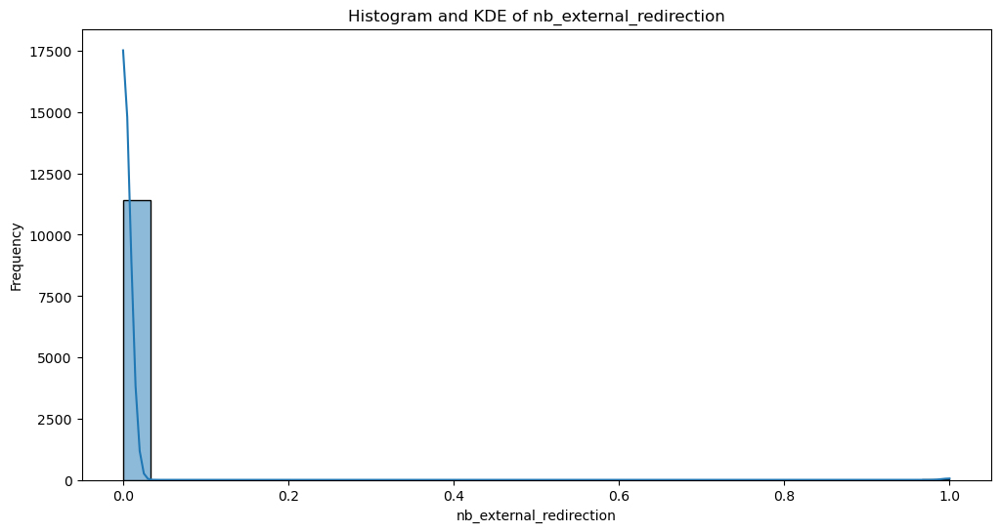

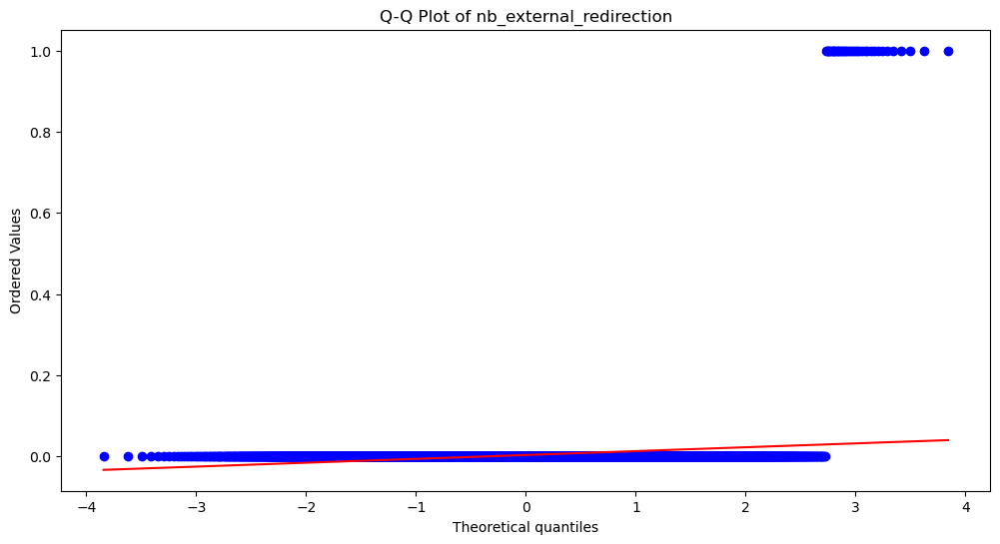

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.029, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: length_words_raw


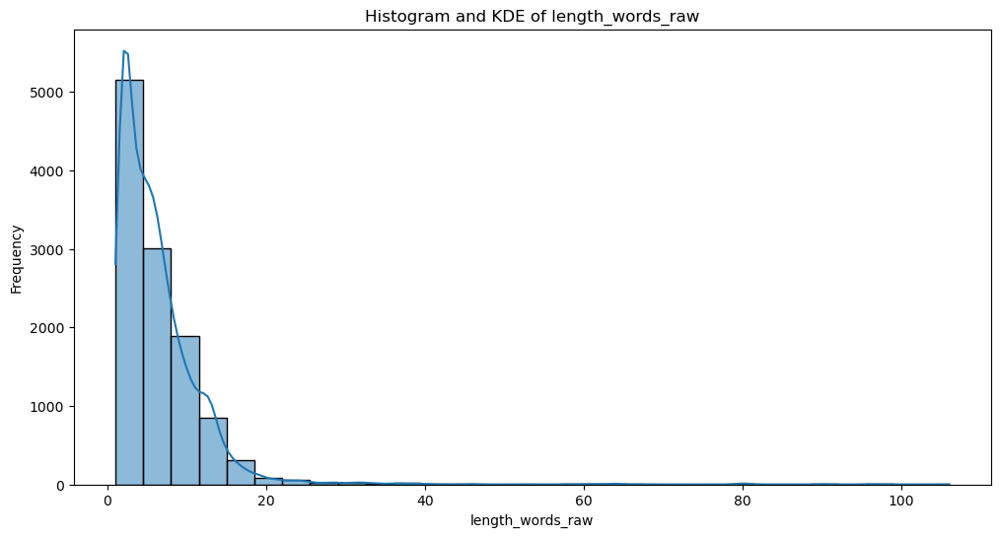

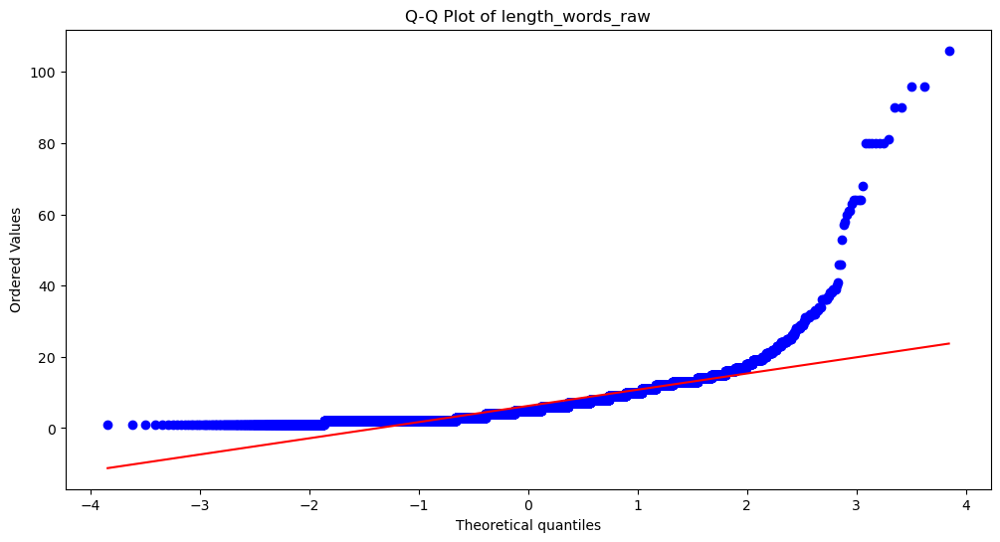

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.666, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: char_repeat


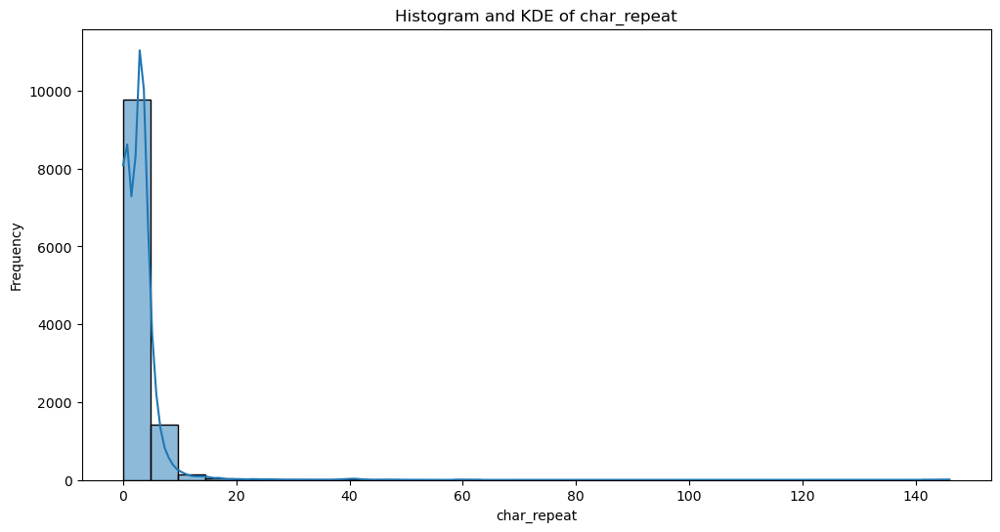

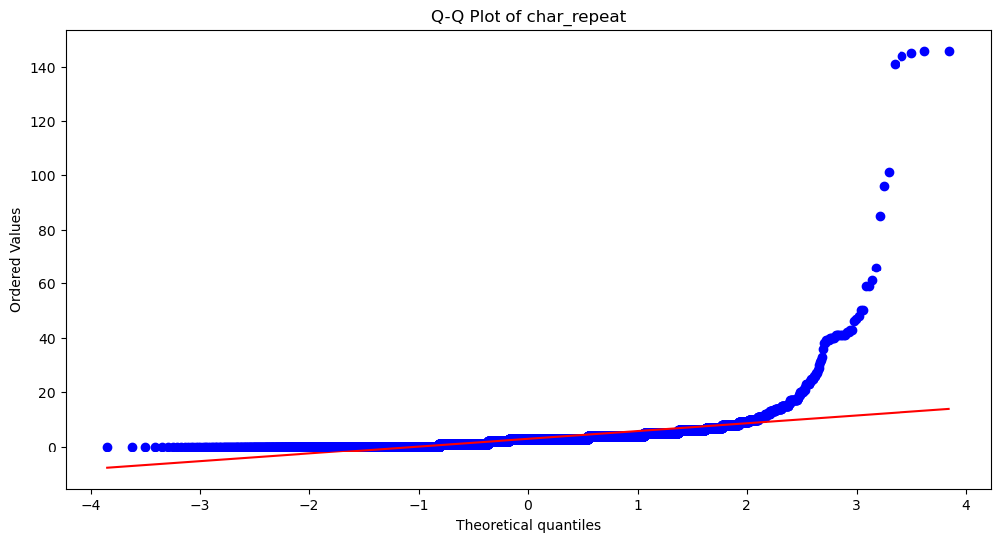

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.359, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: shortest_words_raw


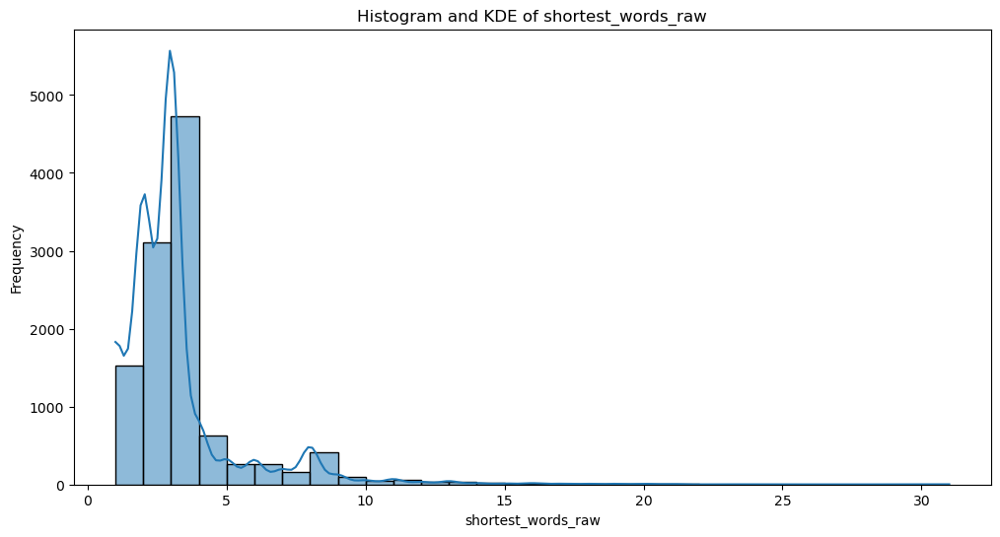

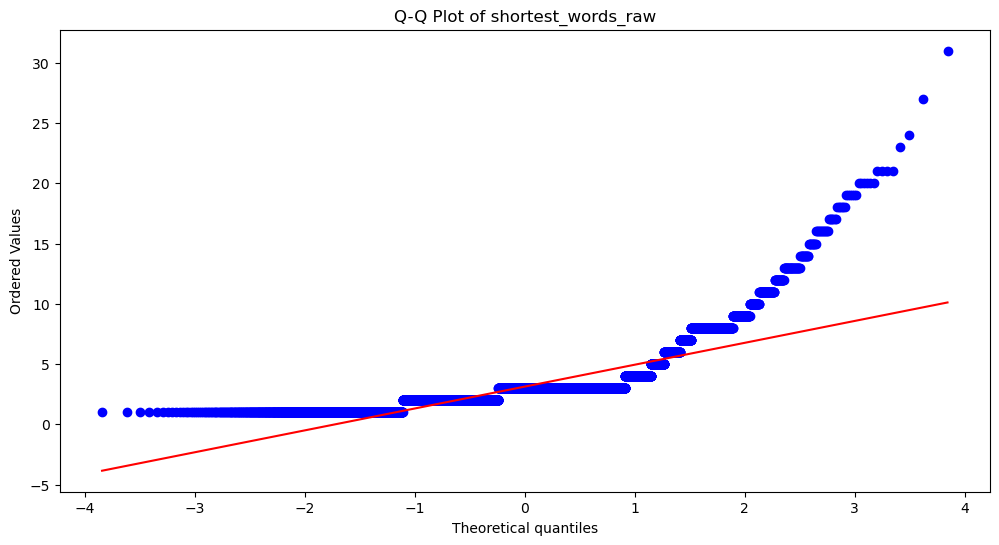

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.674, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: shortest_word_host


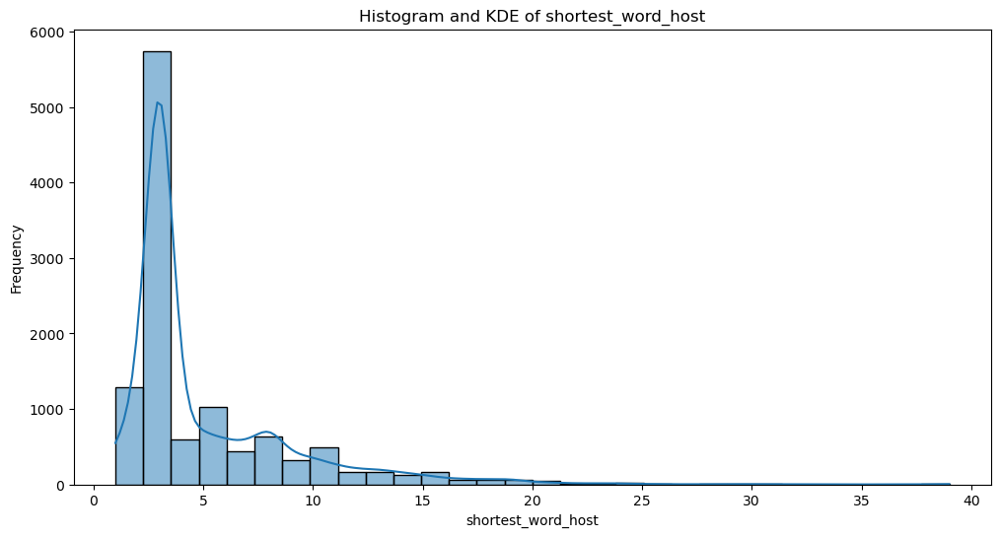

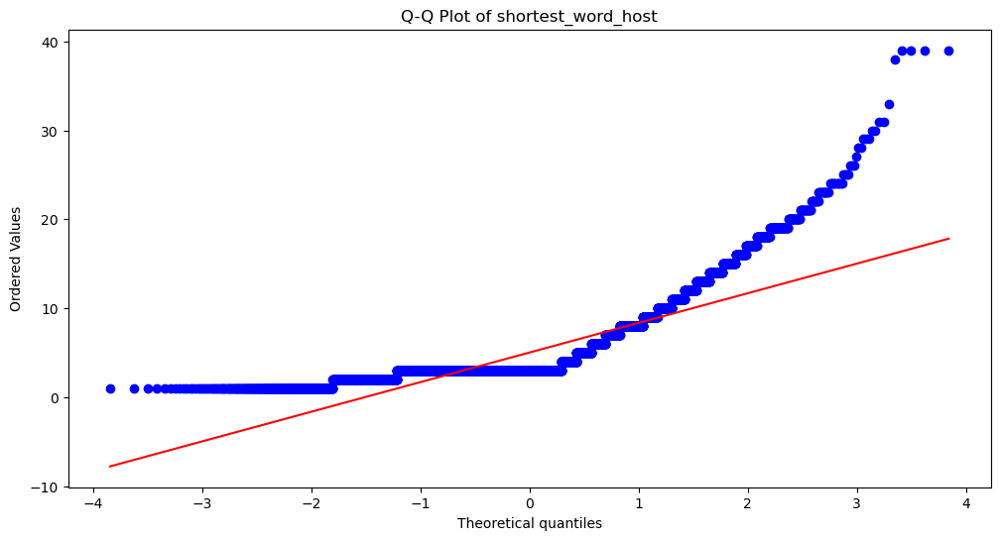

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.714, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: shortest_word_path


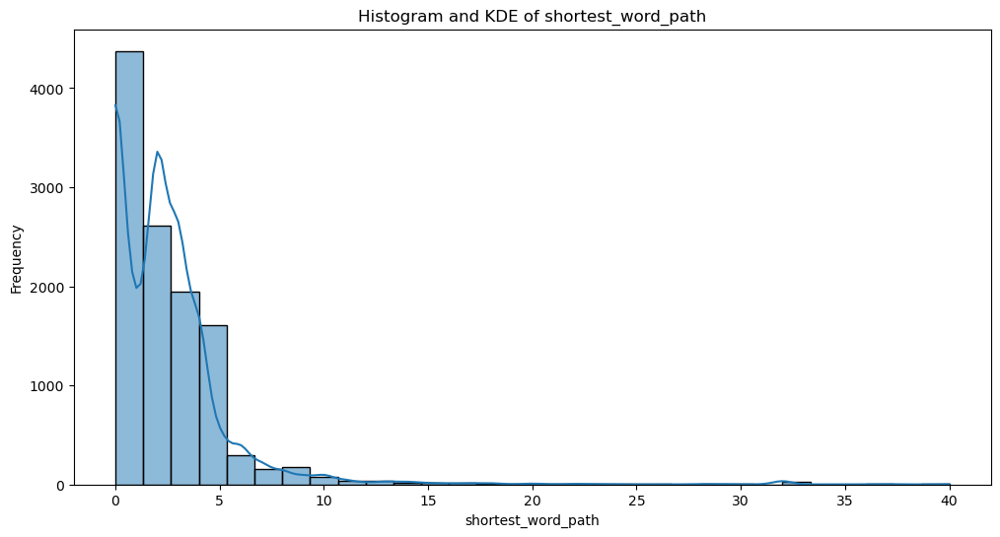

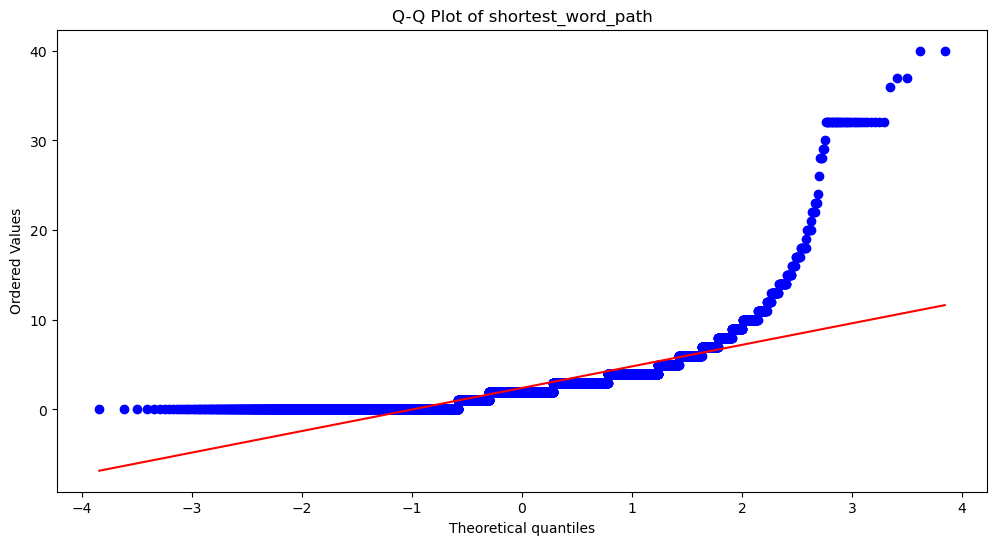

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.642, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: longest_words_raw


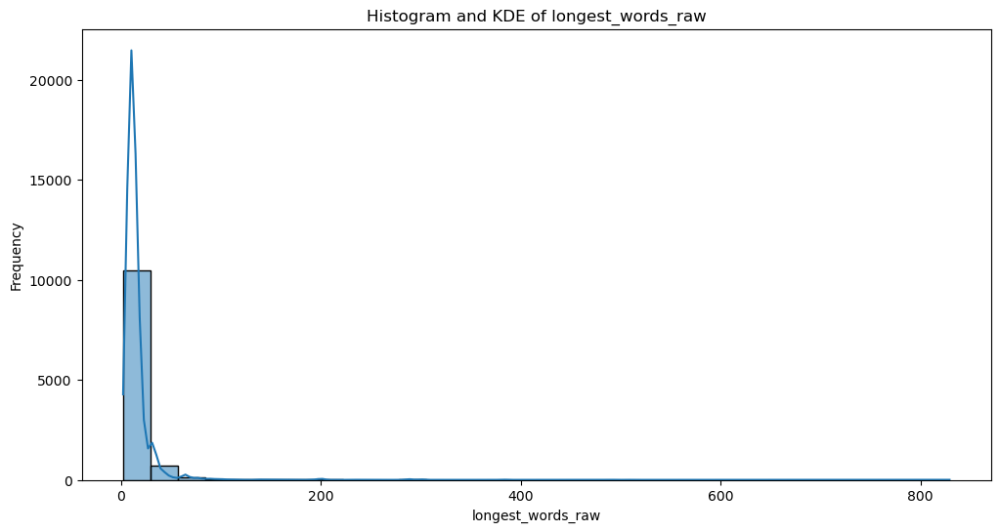

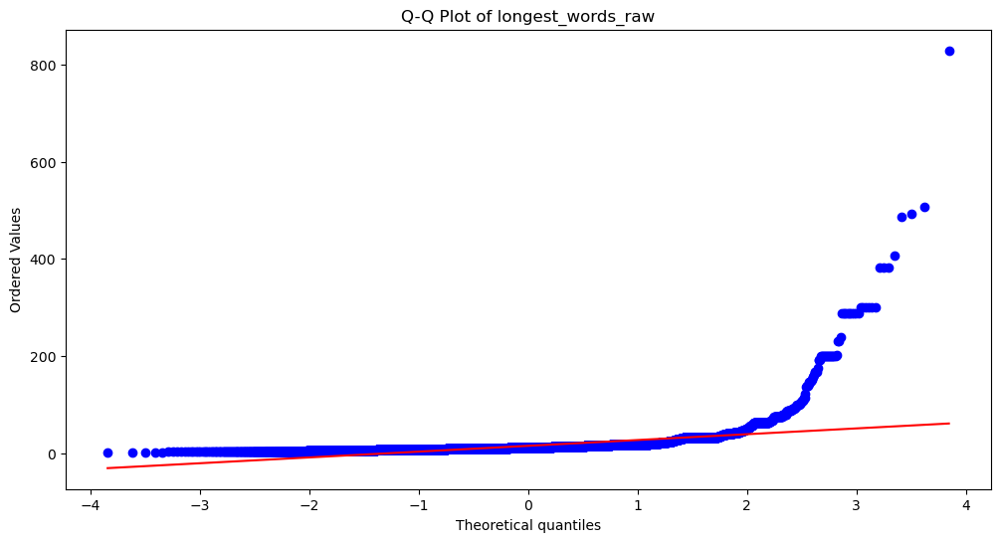

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.294, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: longest_word_host


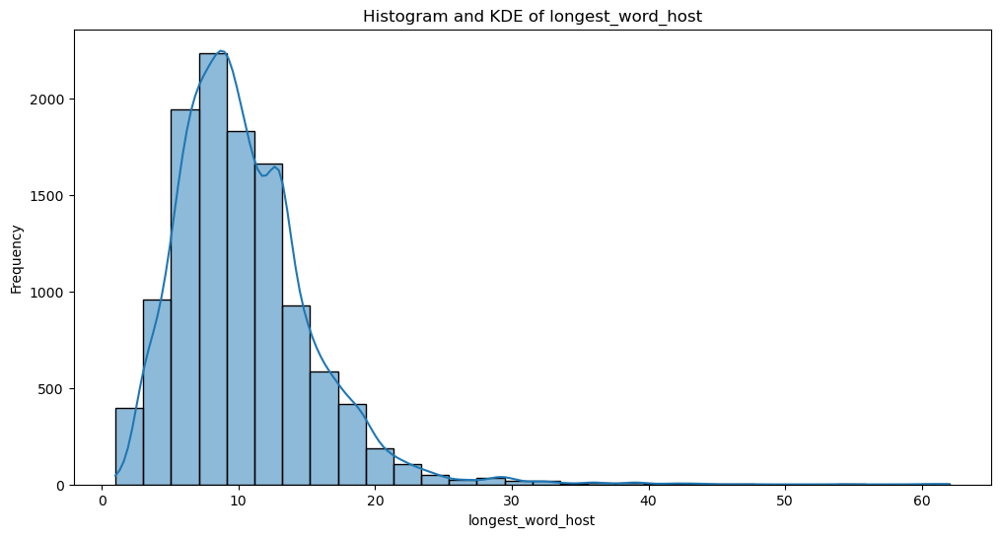

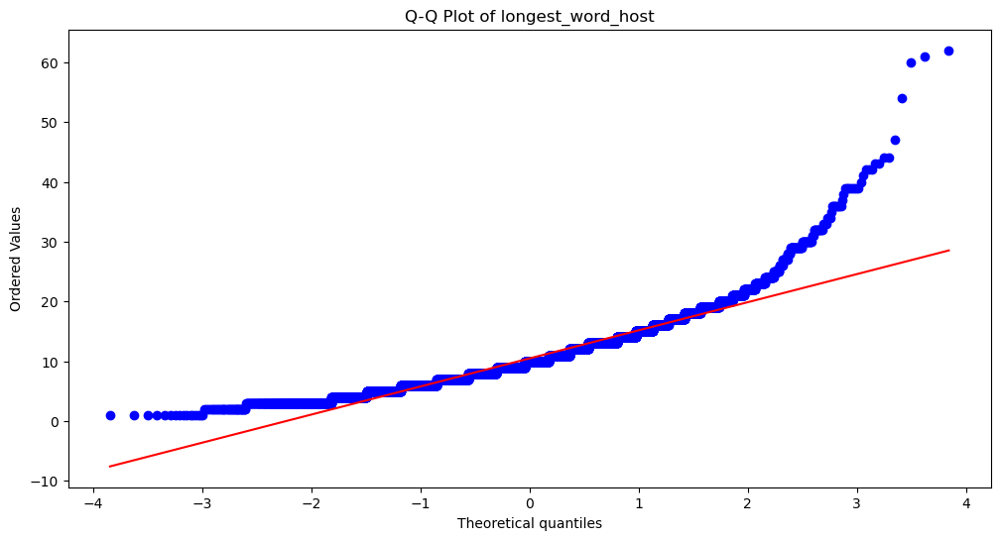

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.907, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: longest_word_path


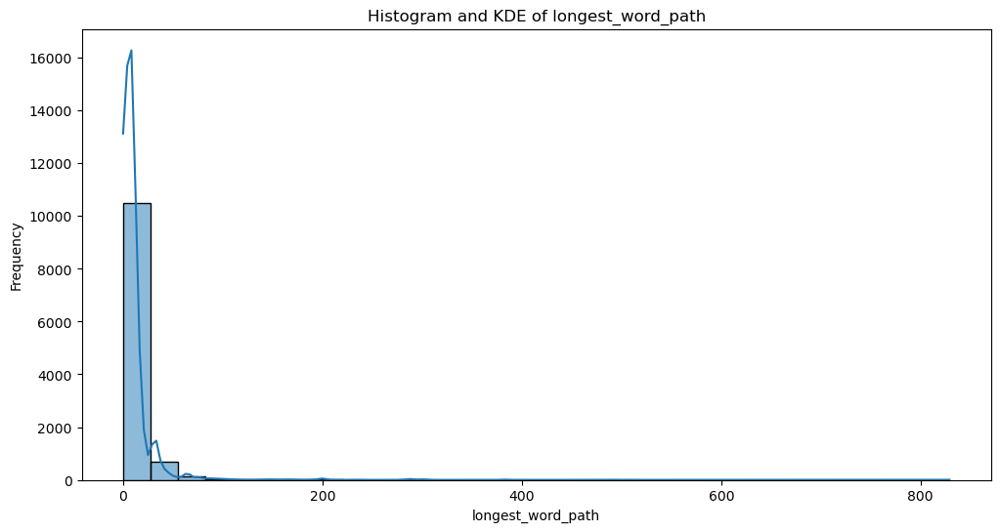

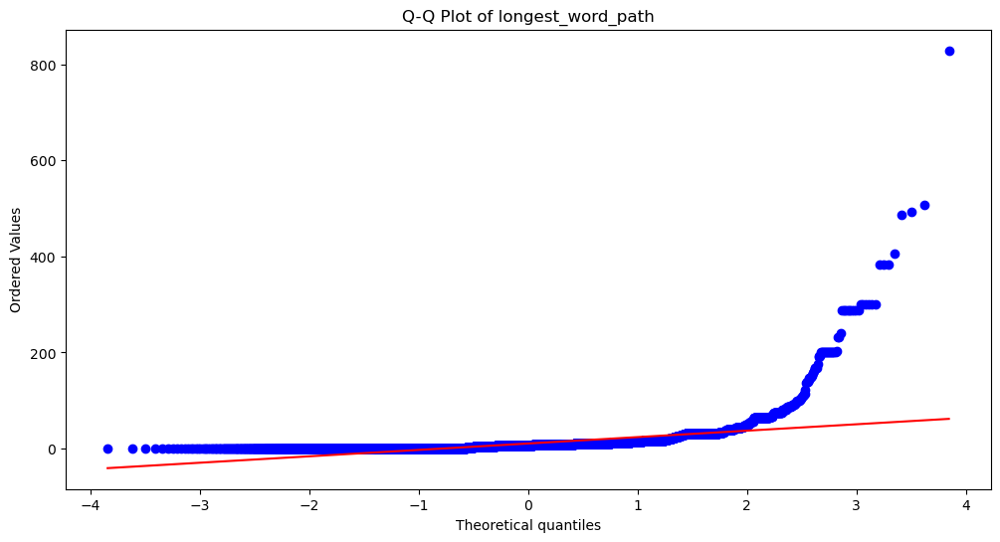

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.335, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: avg_words_raw


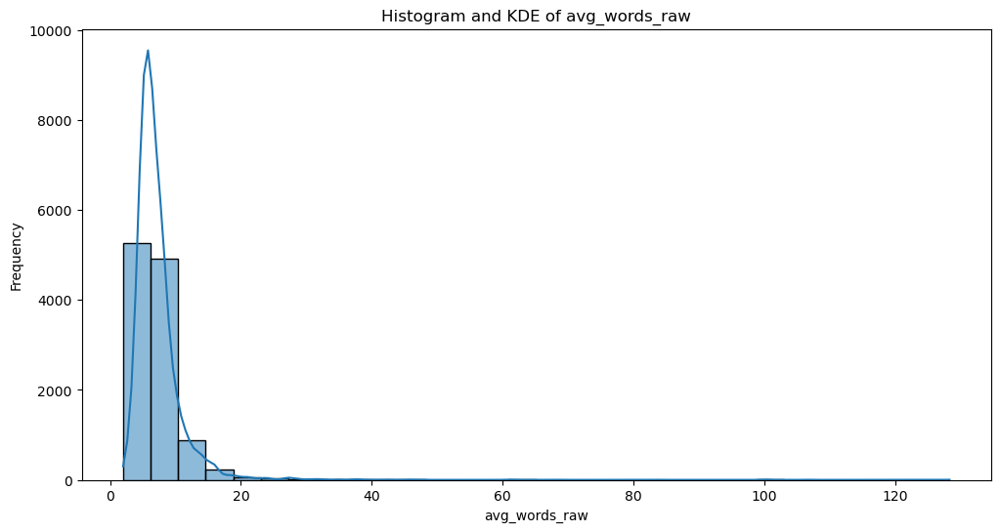

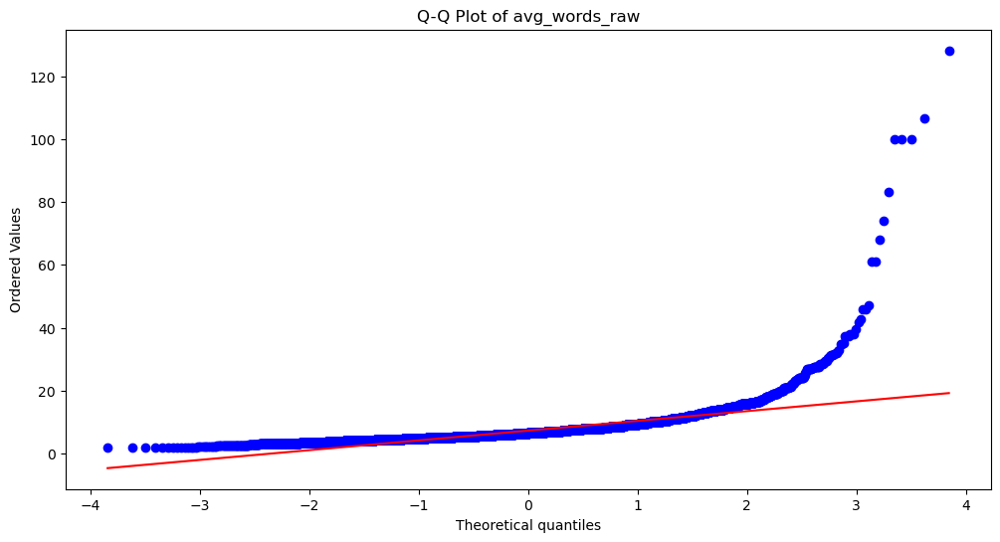

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.562, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: avg_word_host


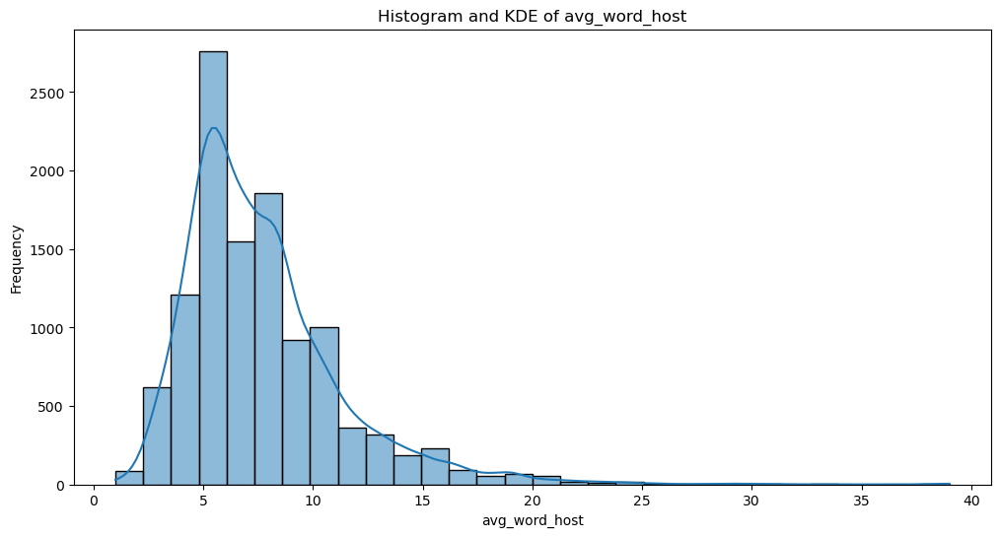

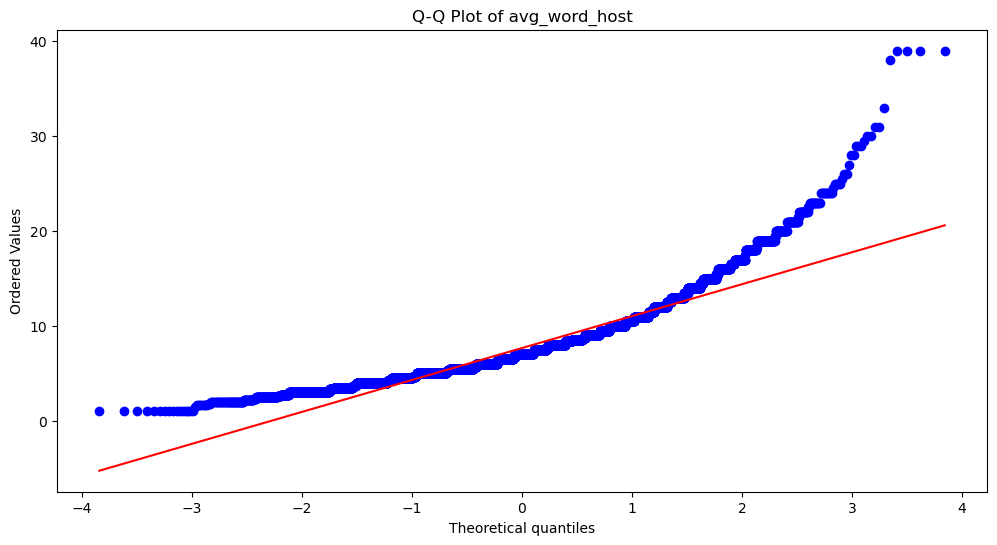

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.883, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: avg_word_path


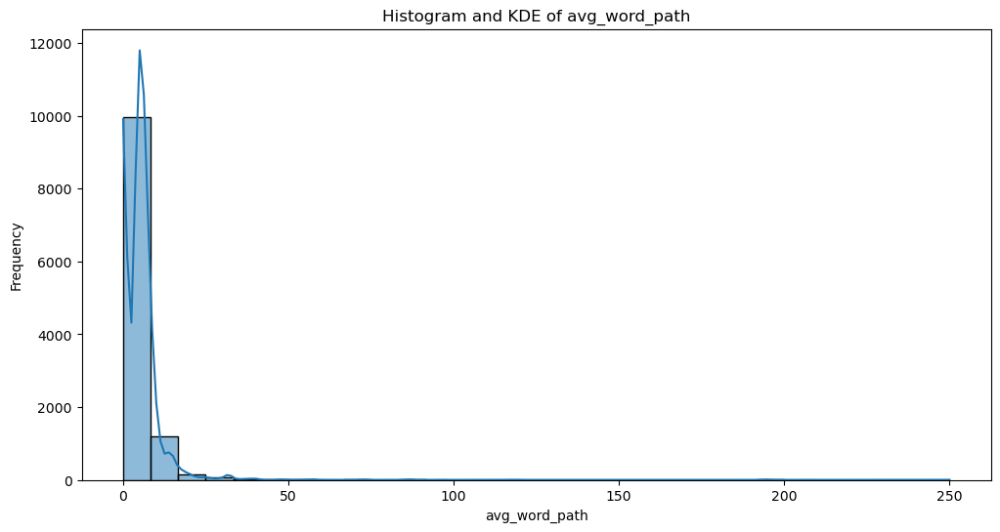

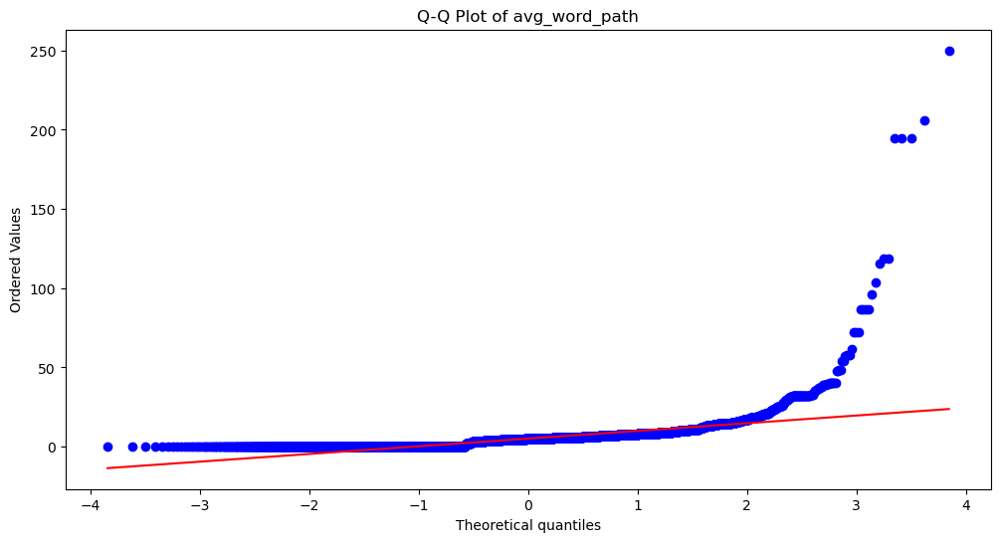

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.462, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: phish_hints


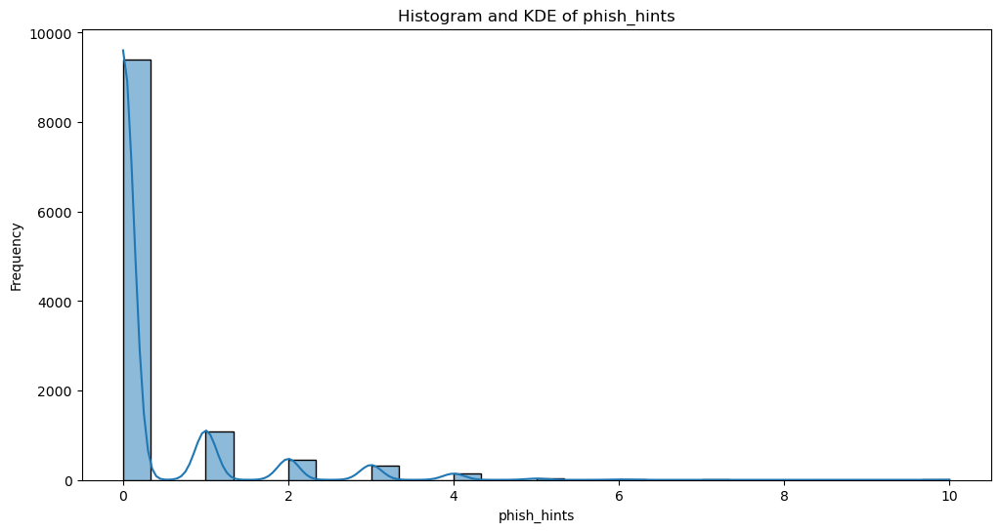

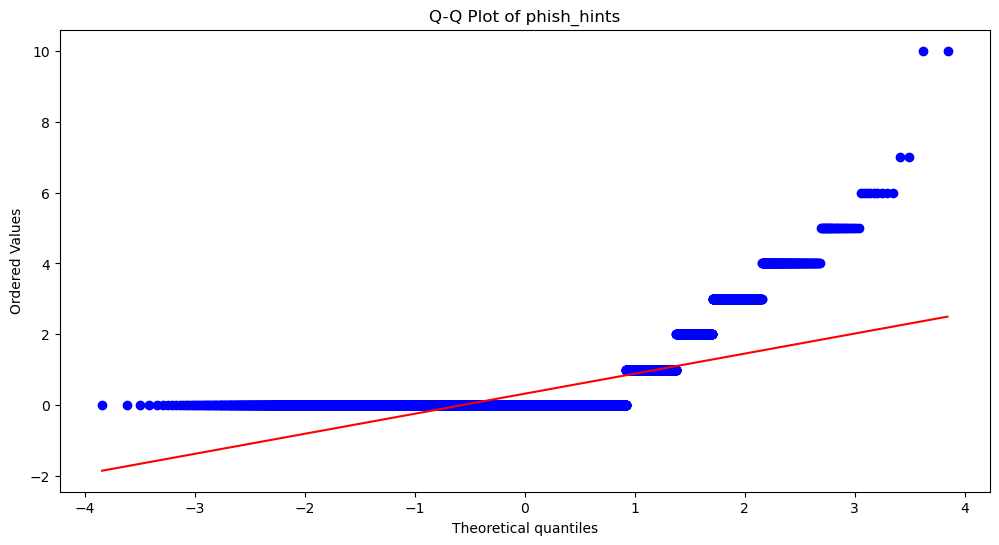

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.450, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: domain_in_brand


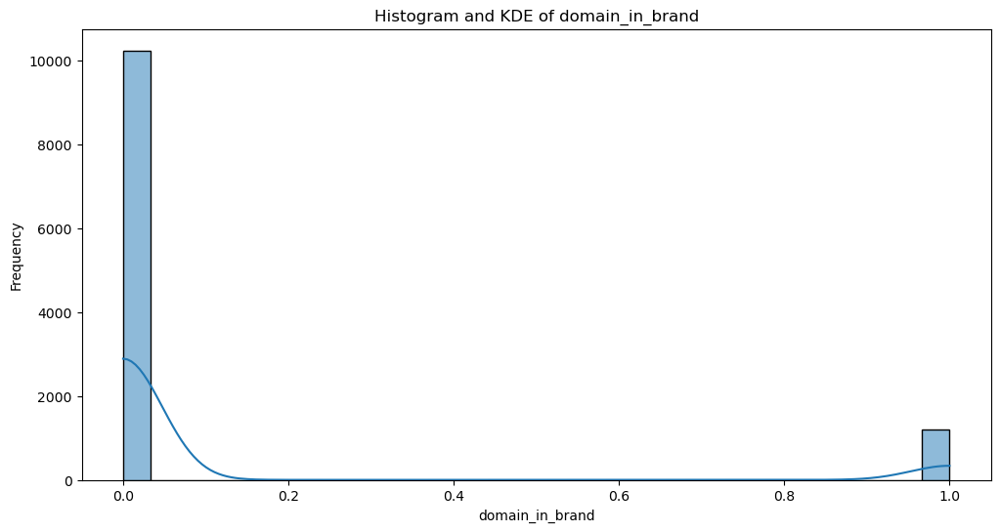

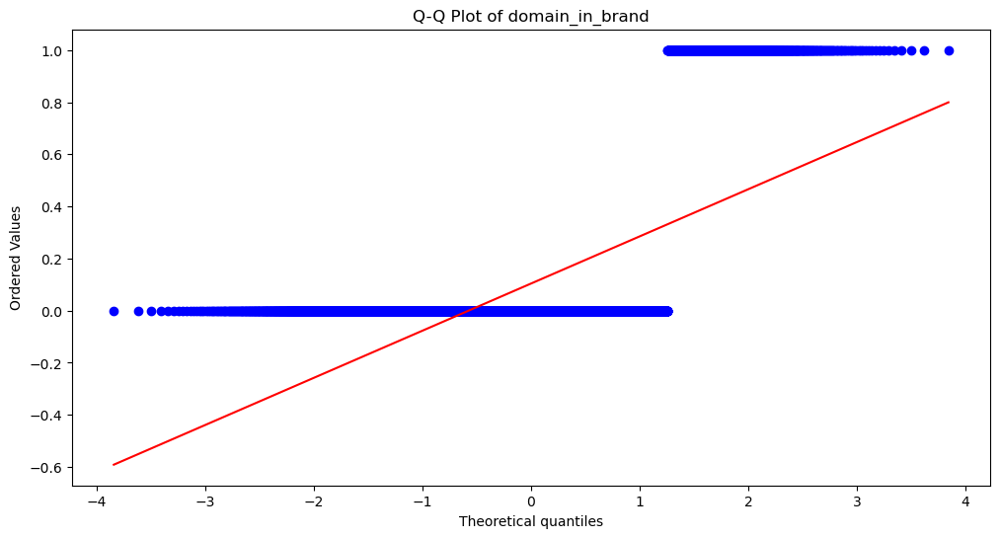

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.350, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: brand_in_subdomain


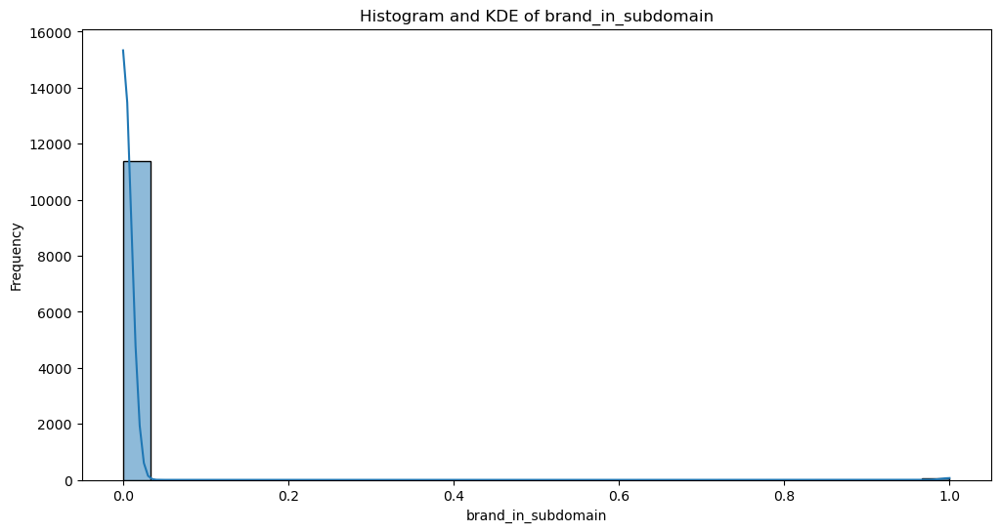

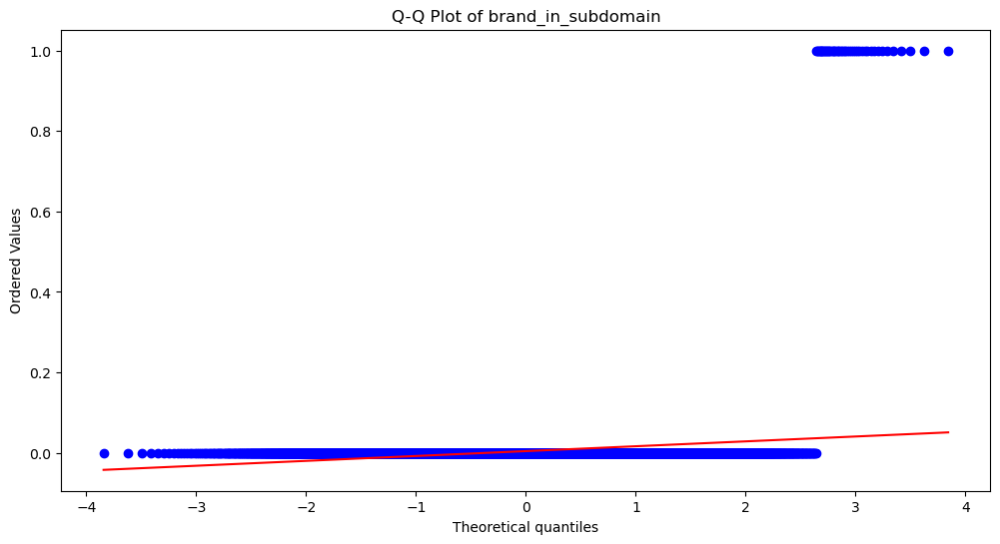

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.036, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: brand_in_path


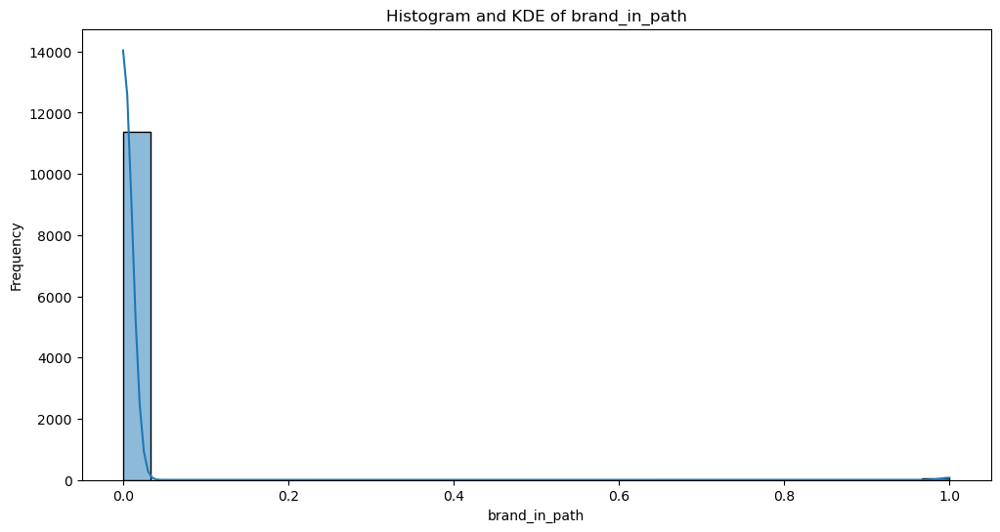

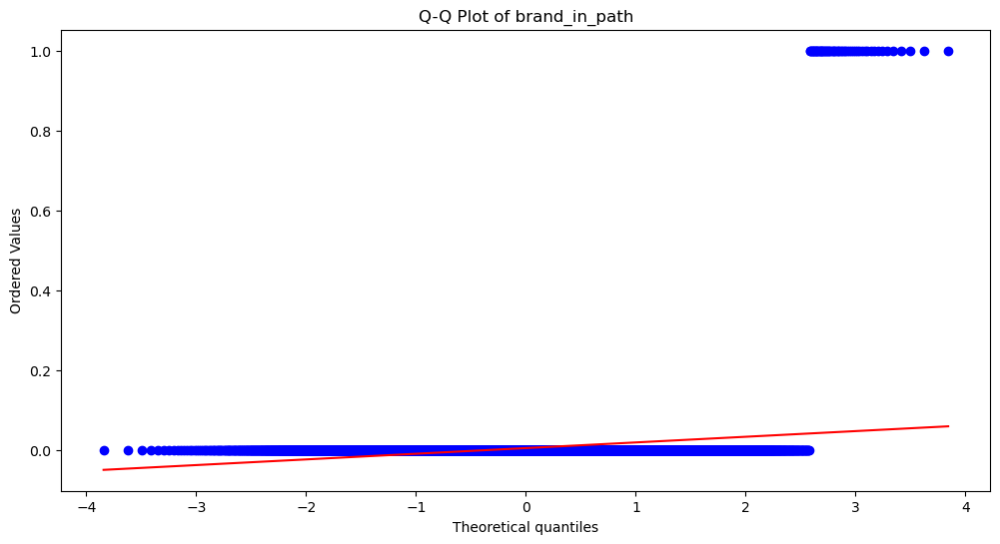

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.041, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: suspecious_tld


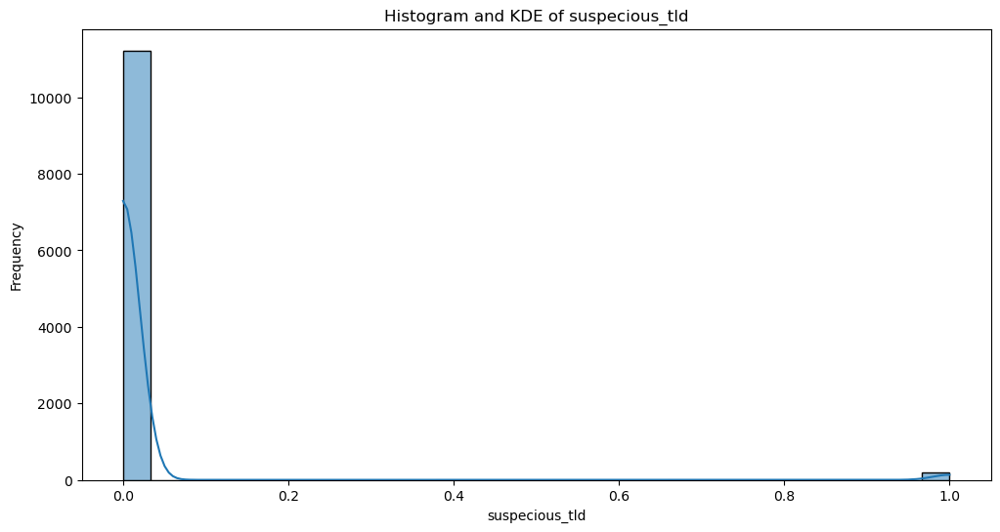

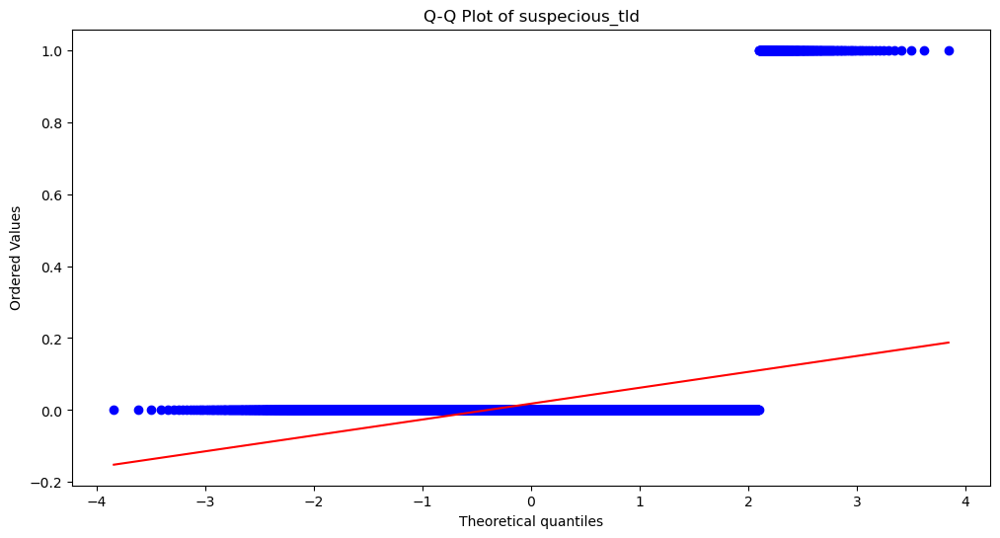

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.111, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: statistical_report


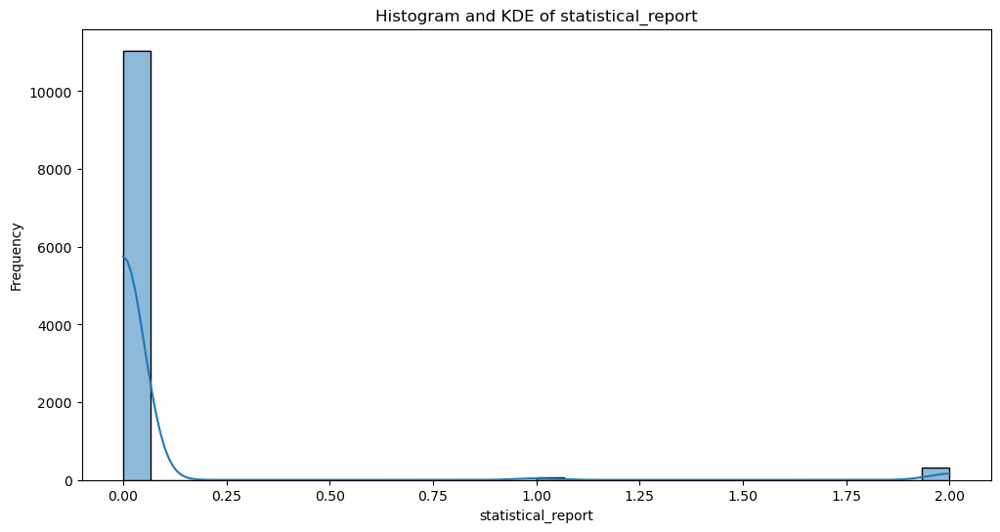

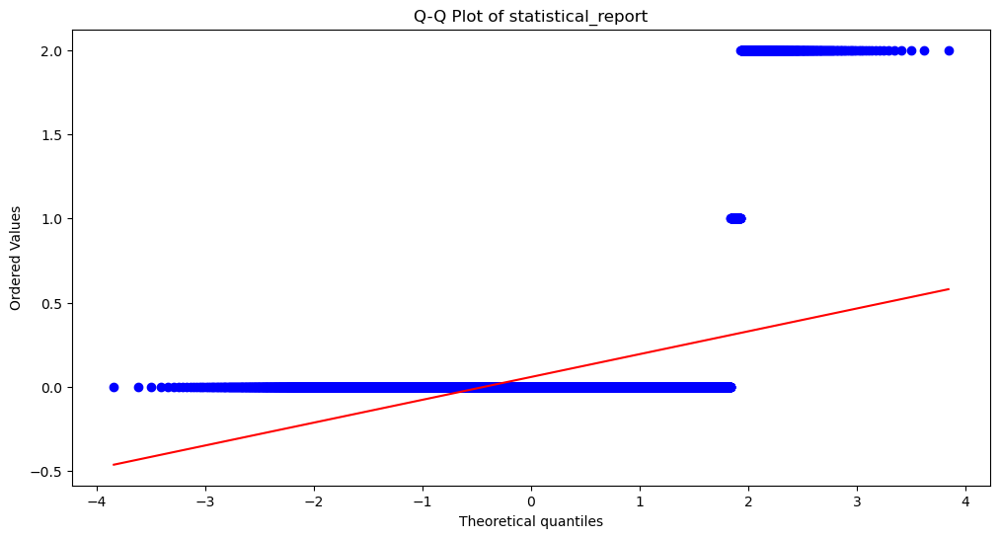

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.167, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: nb_hyperlinks


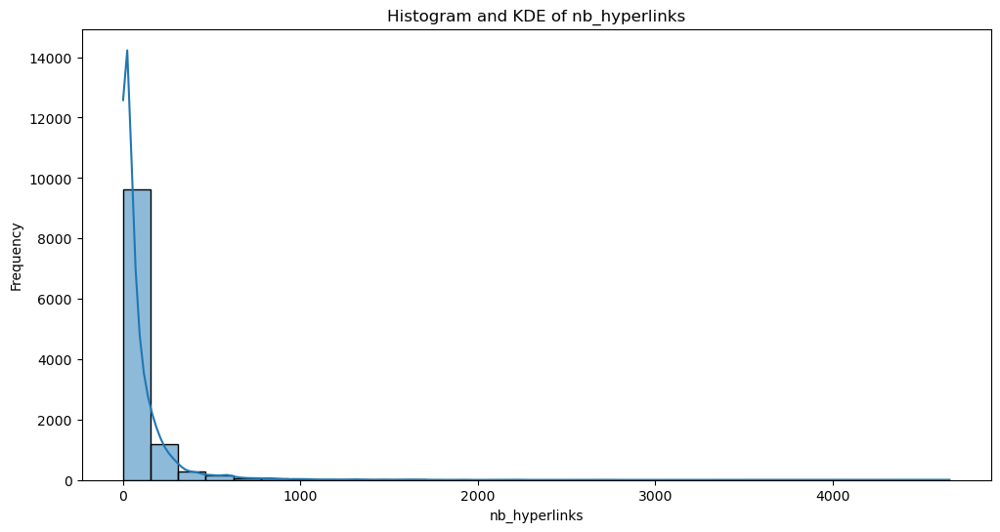

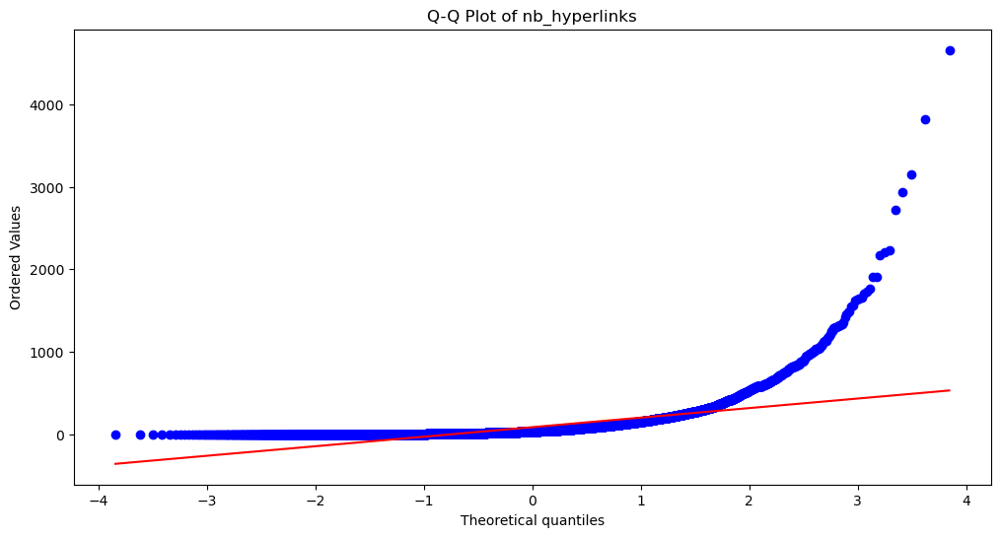

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.481, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: ratio_intHyperlinks


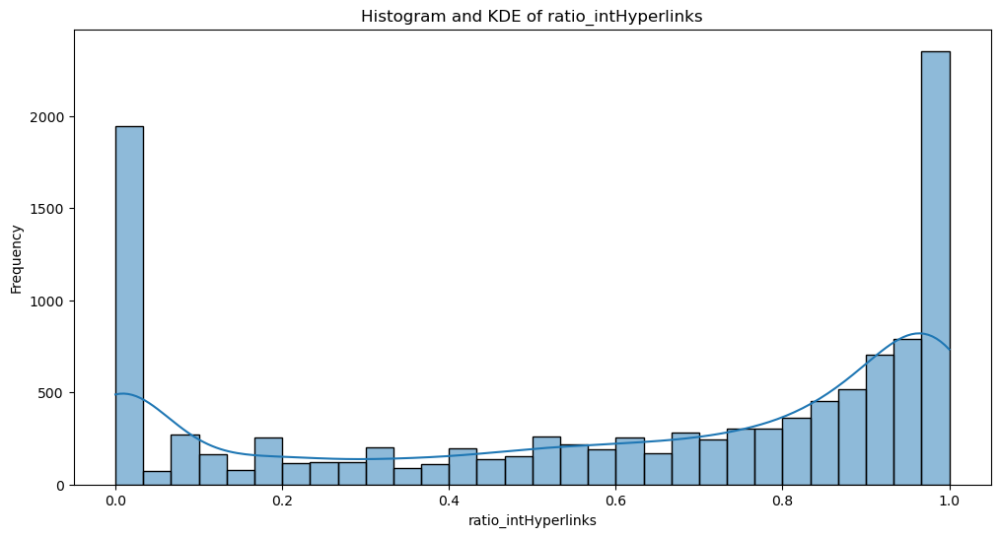

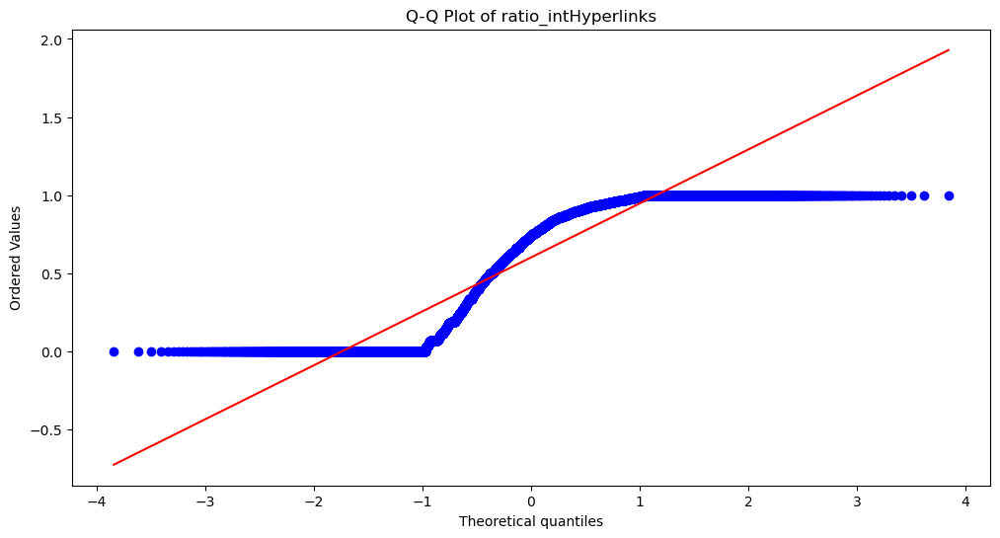

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.839, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: ratio_extHyperlinks


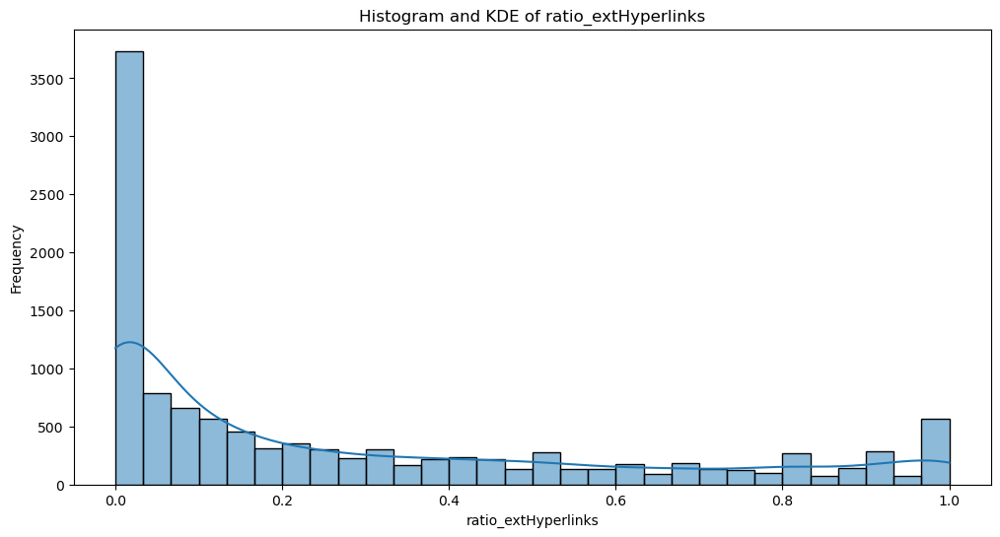

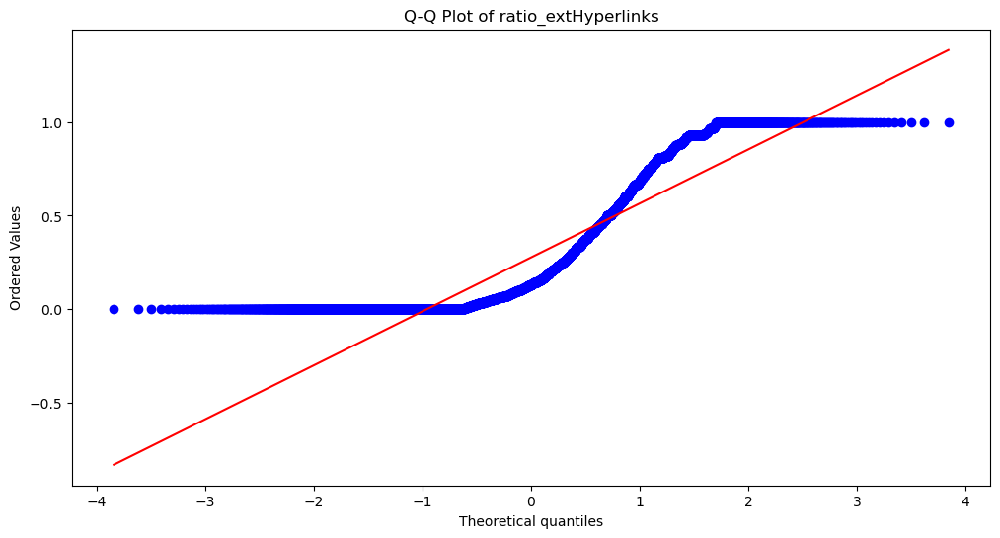

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.812, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: ratio_nullHyperlinks


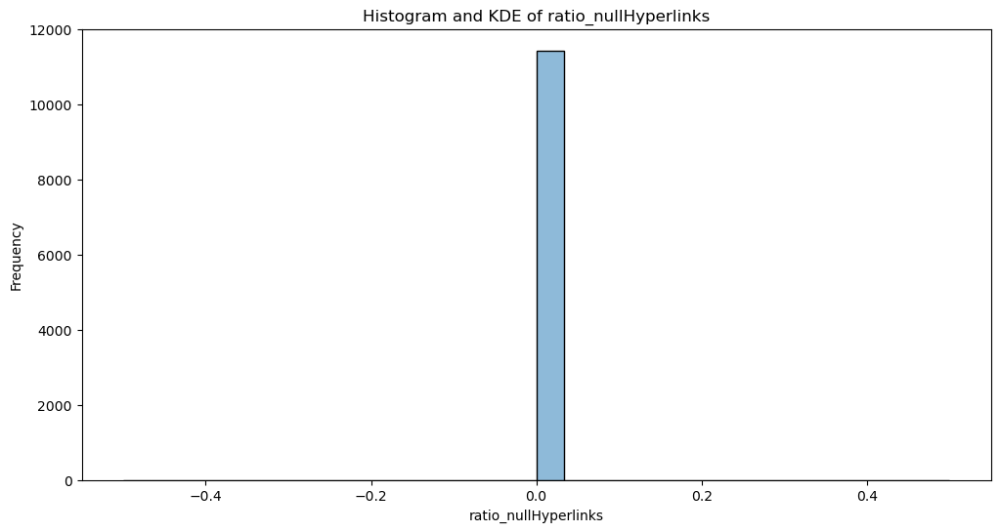

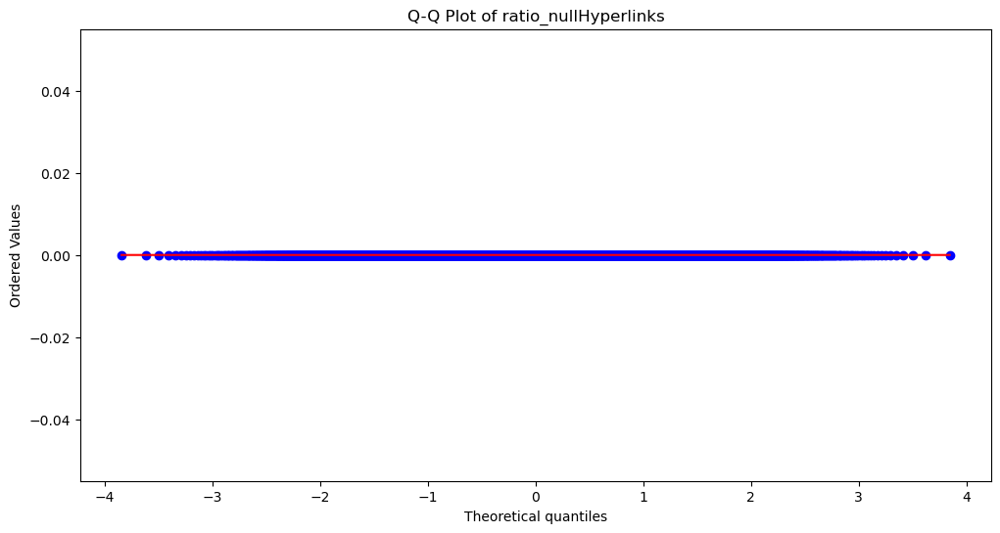

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=1.000, p-value=1.000
Sample looks Gaussian (fail to reject H0)

Analyzing column: nb_extCSS


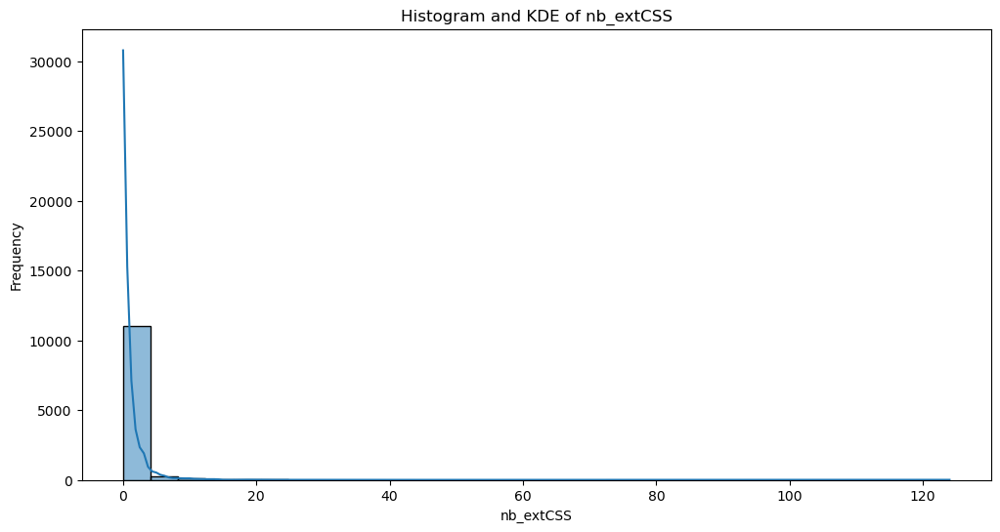

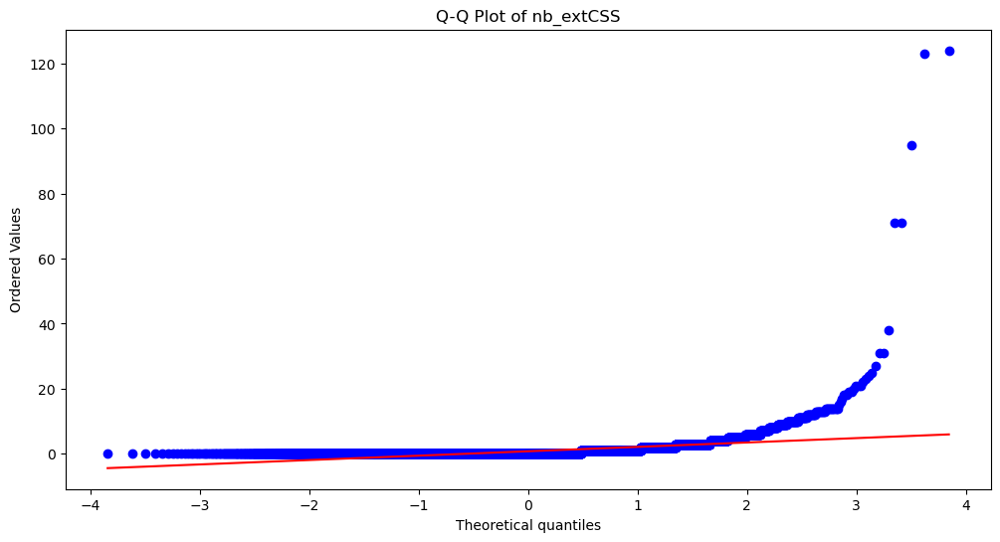

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.240, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: ratio_intRedirection


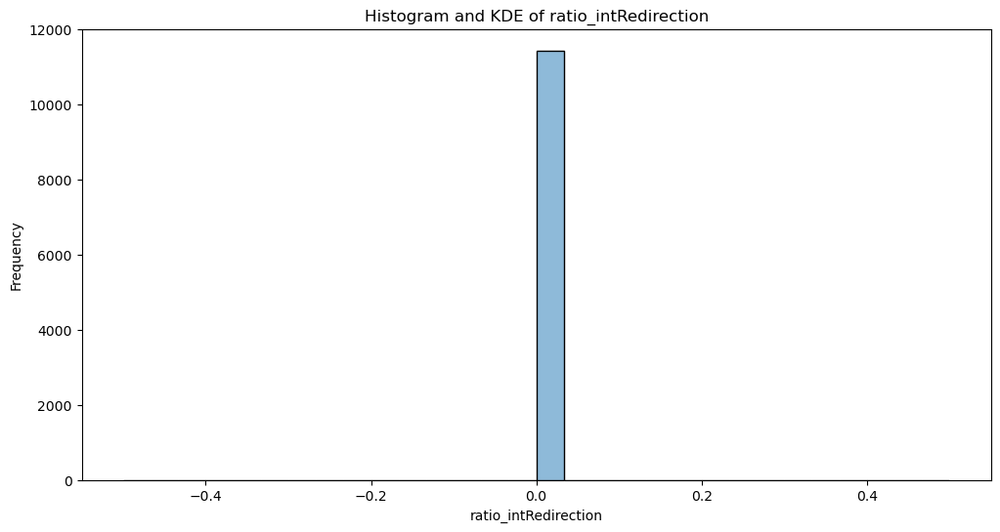

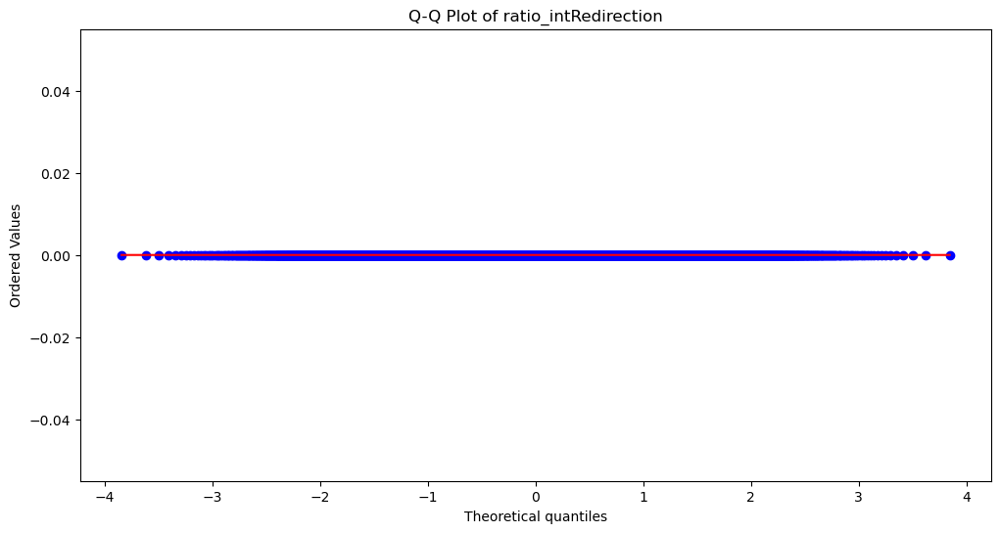

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=1.000, p-value=1.000
Sample looks Gaussian (fail to reject H0)

Analyzing column: ratio_extRedirection


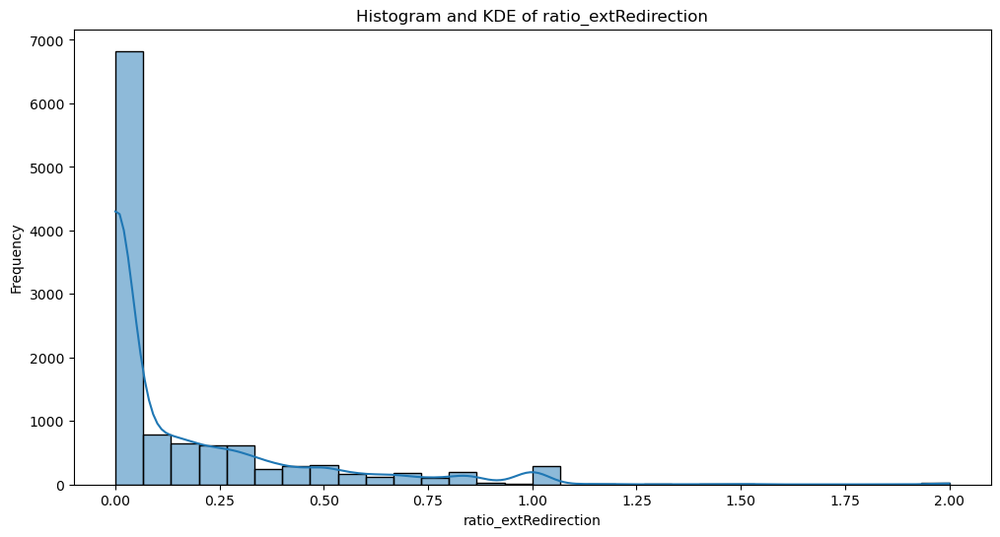

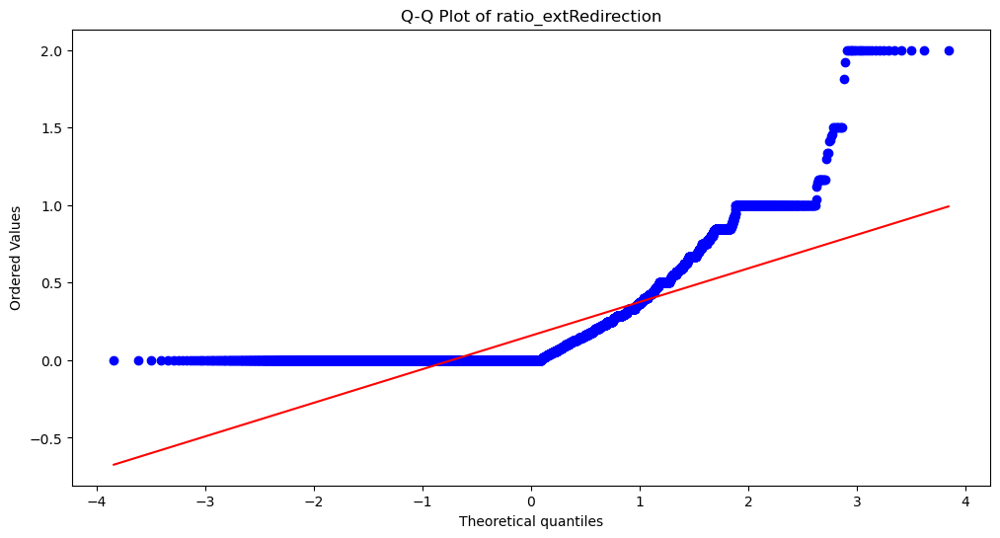

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.661, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: ratio_intErrors


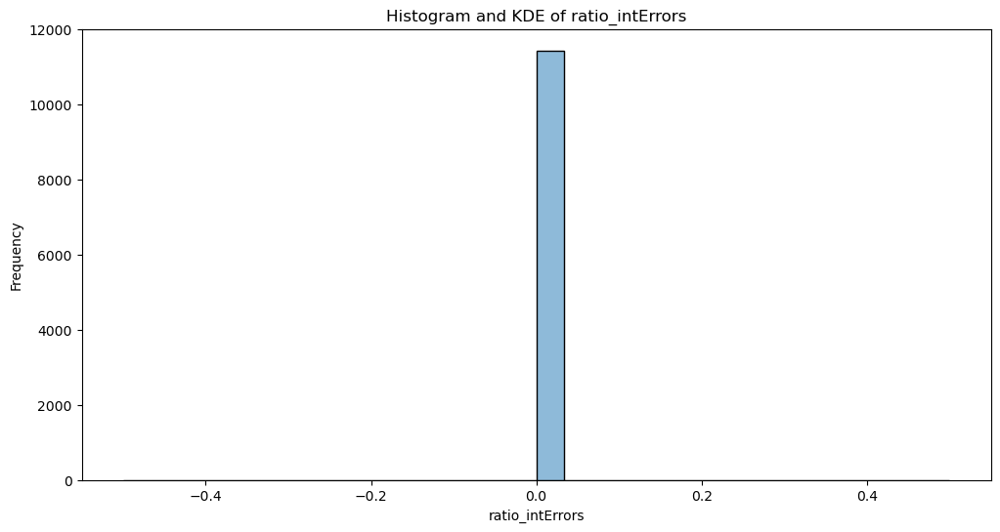

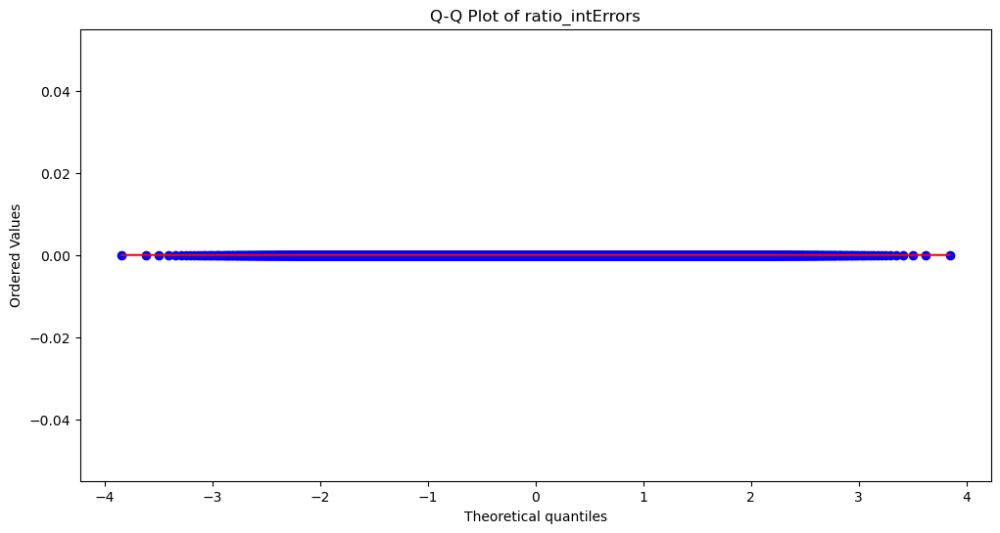

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=1.000, p-value=1.000
Sample looks Gaussian (fail to reject H0)

Analyzing column: ratio_extErrors


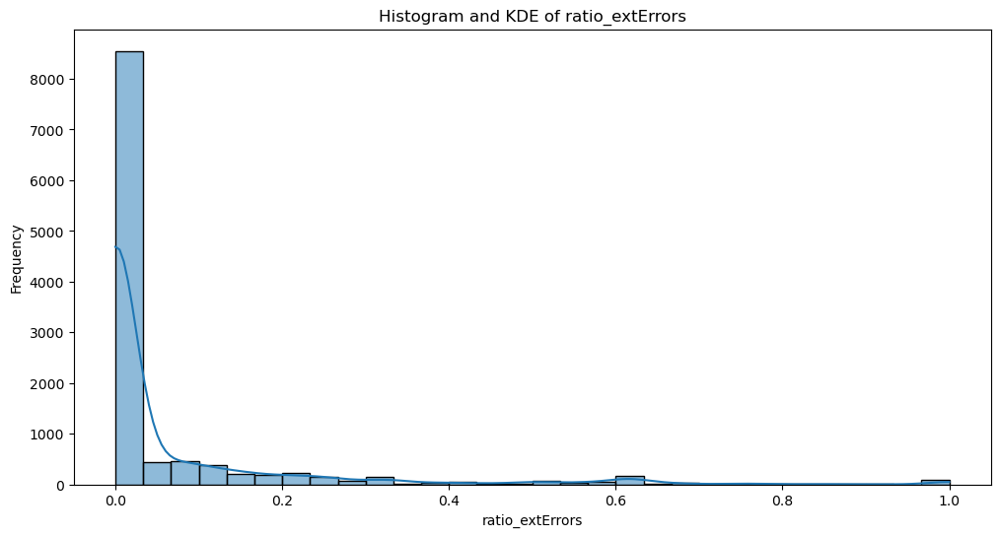

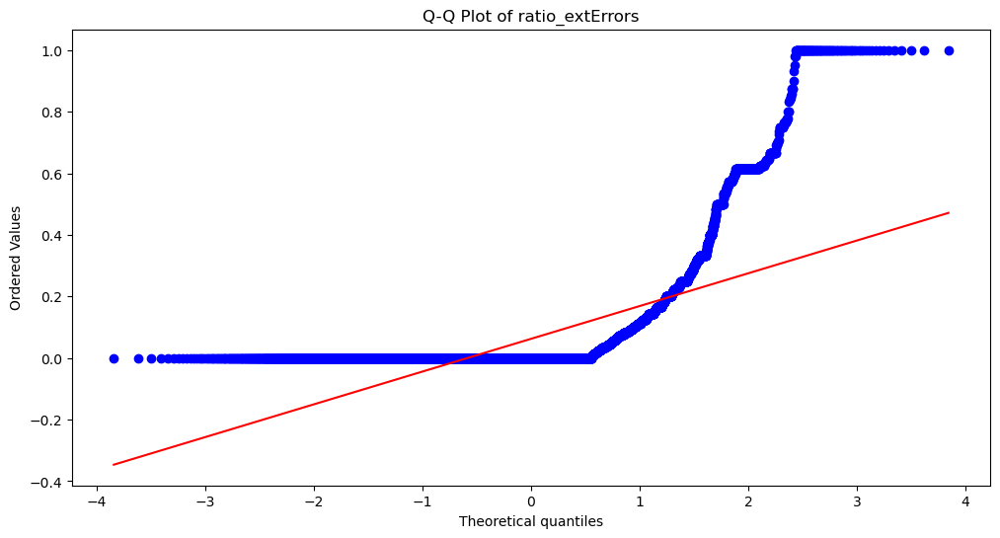

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.463, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: links_in_tags


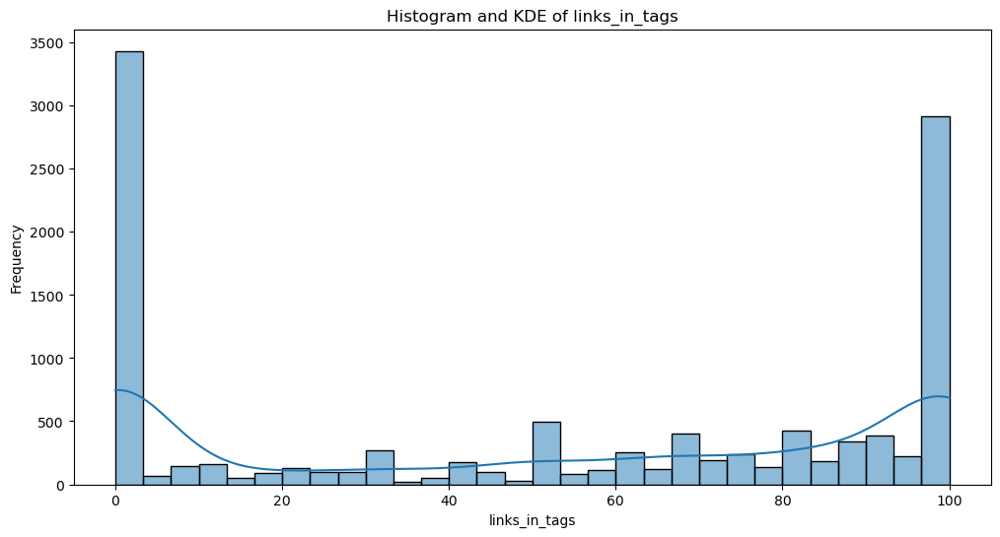

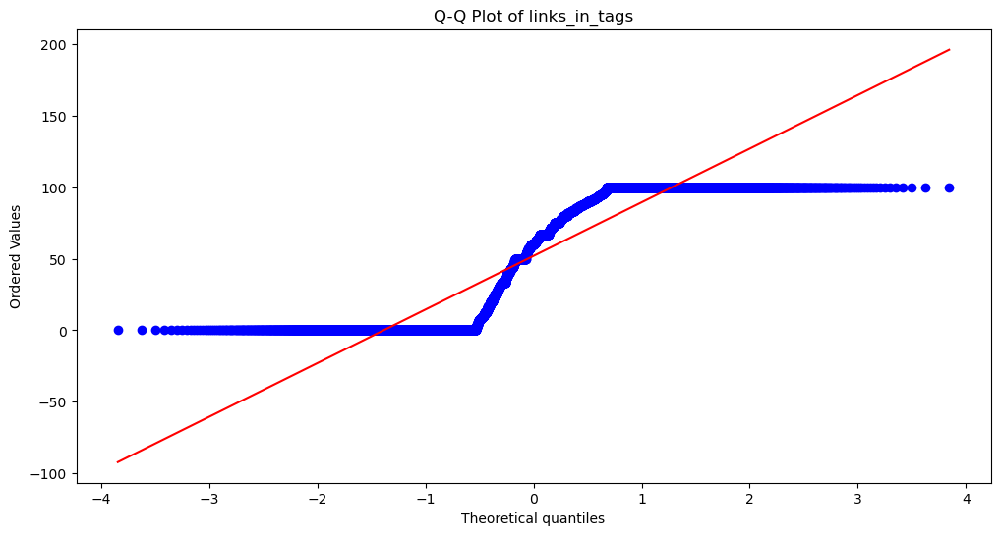

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.815, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: submit_email


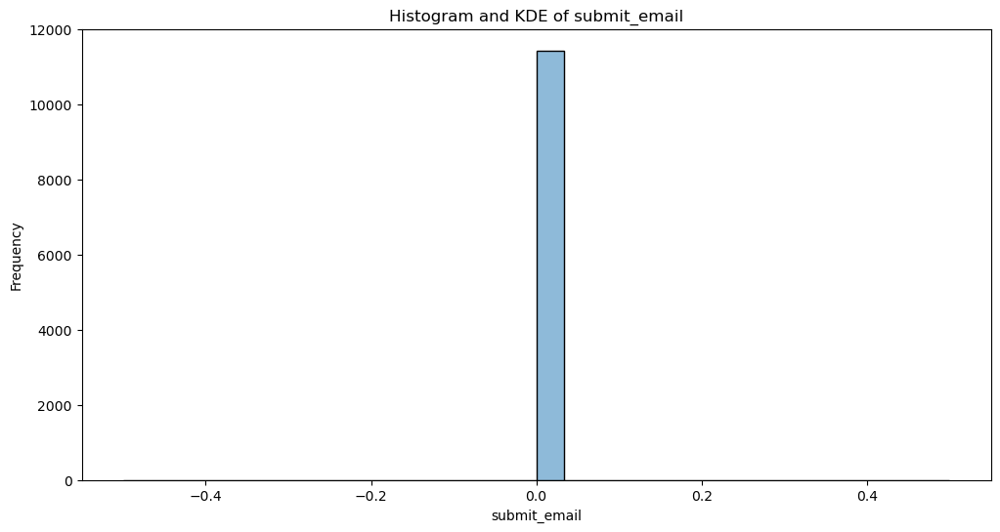

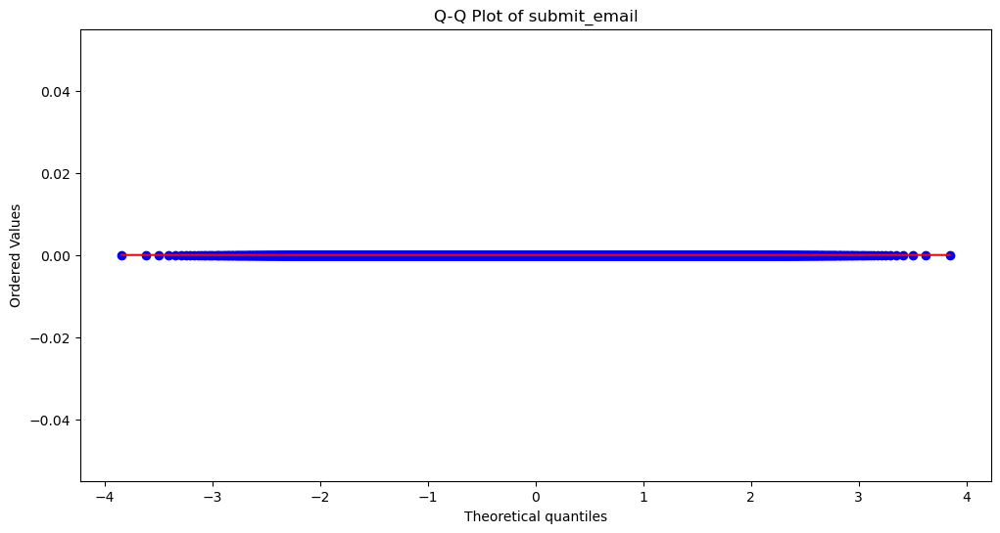

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=1.000, p-value=1.000
Sample looks Gaussian (fail to reject H0)

Analyzing column: ratio_intMedia


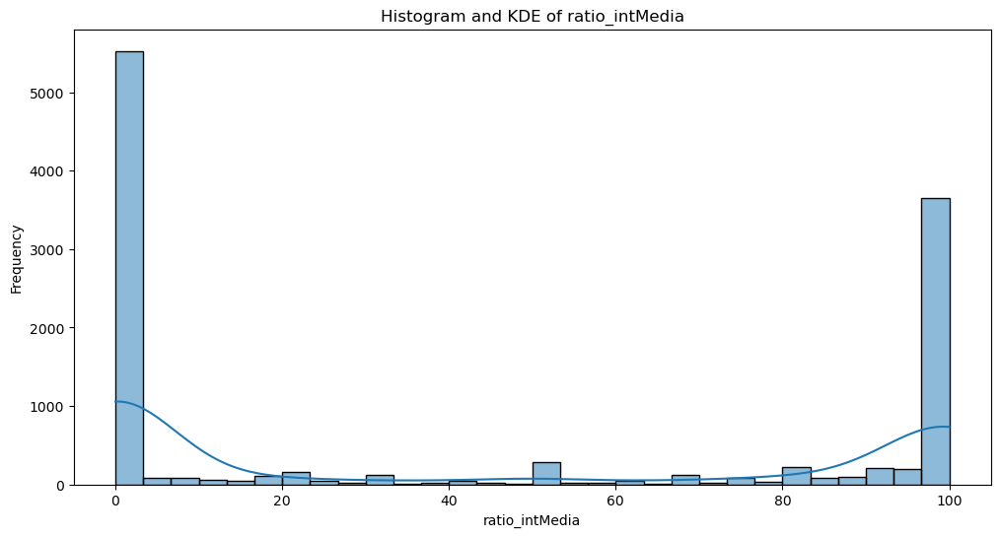

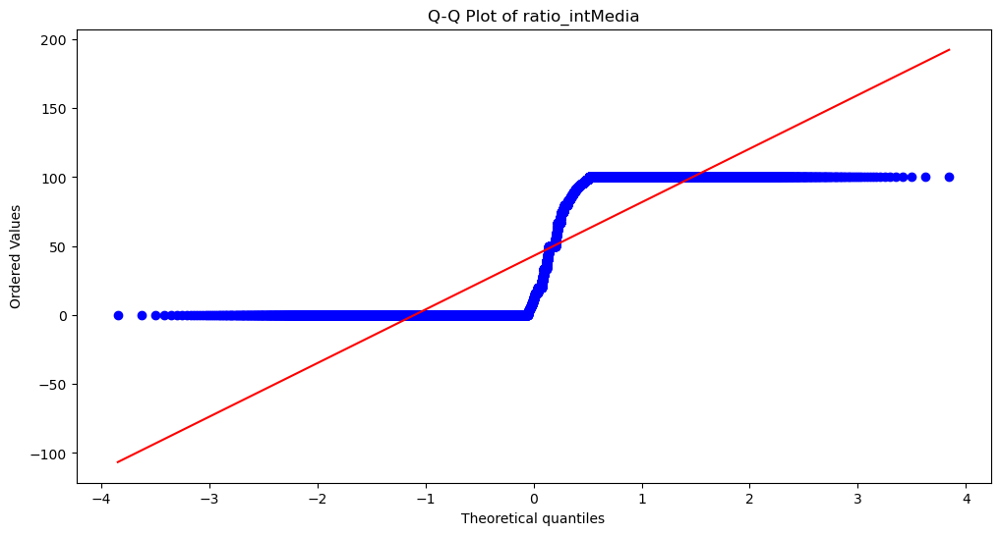

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.707, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: ratio_extMedia


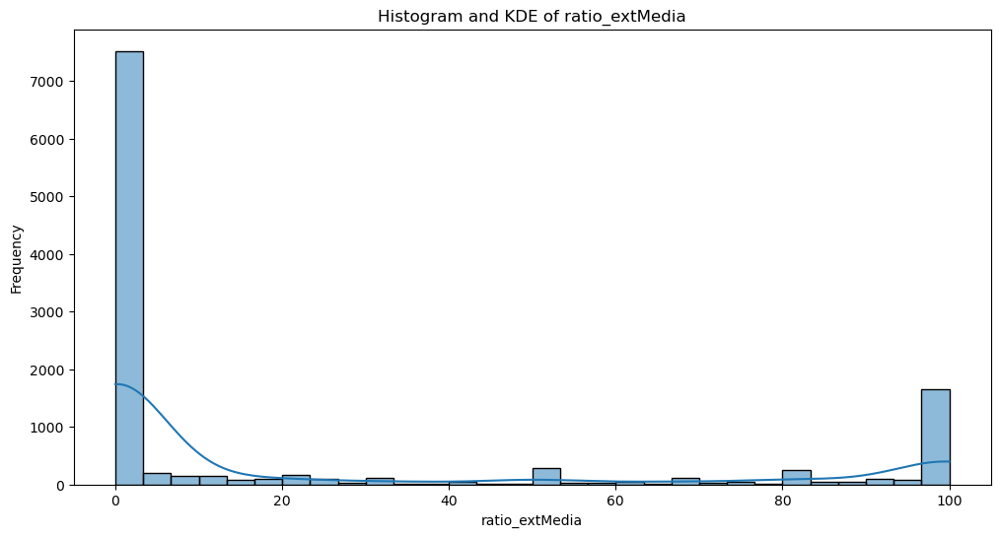

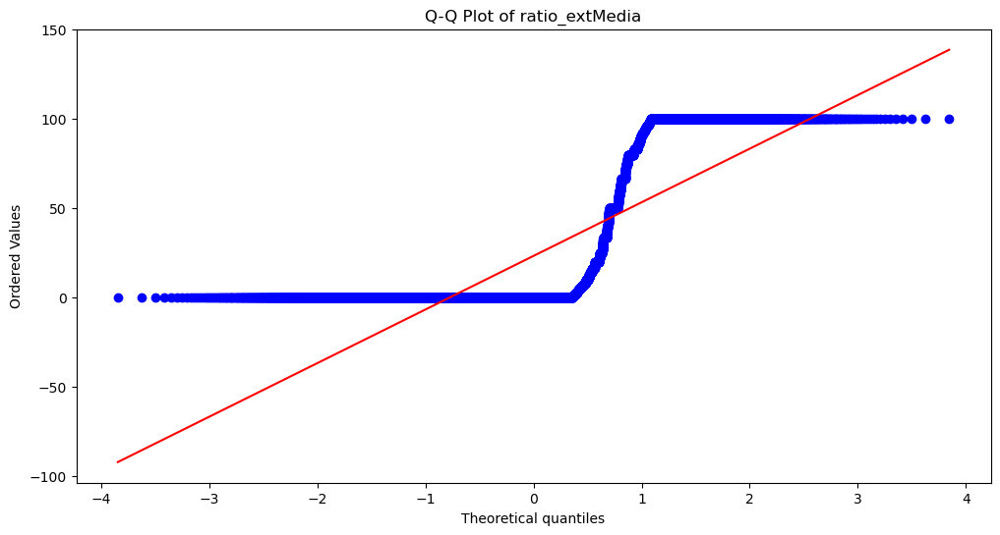

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.613, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: iframe


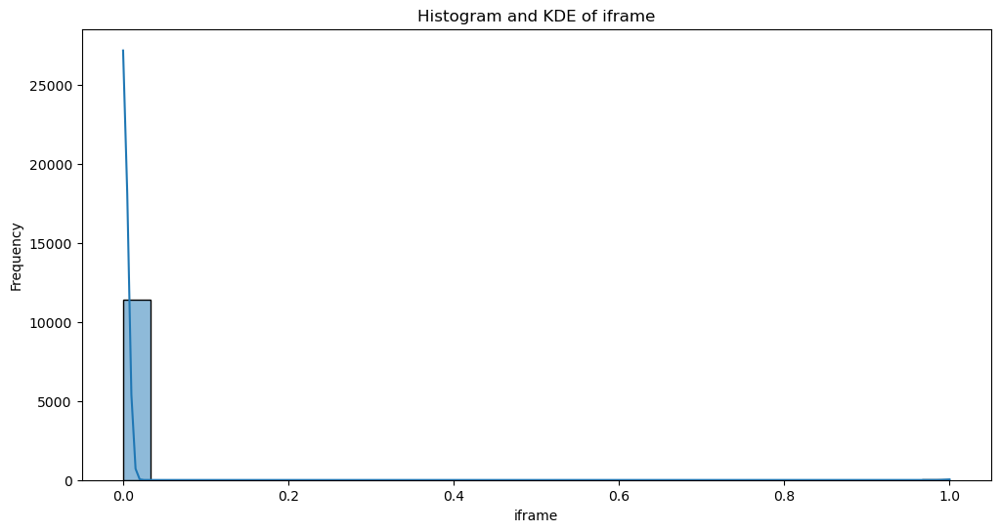

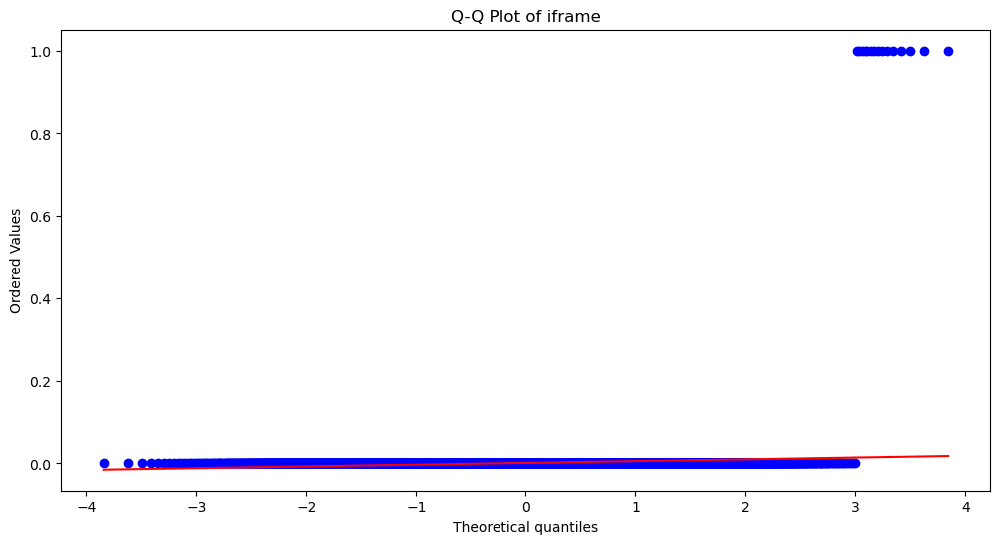

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.014, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: popup_window


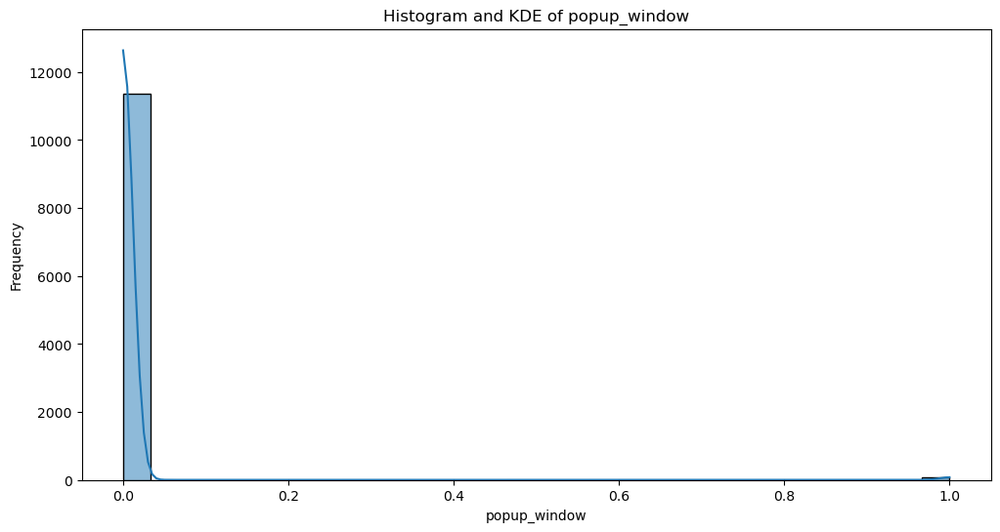

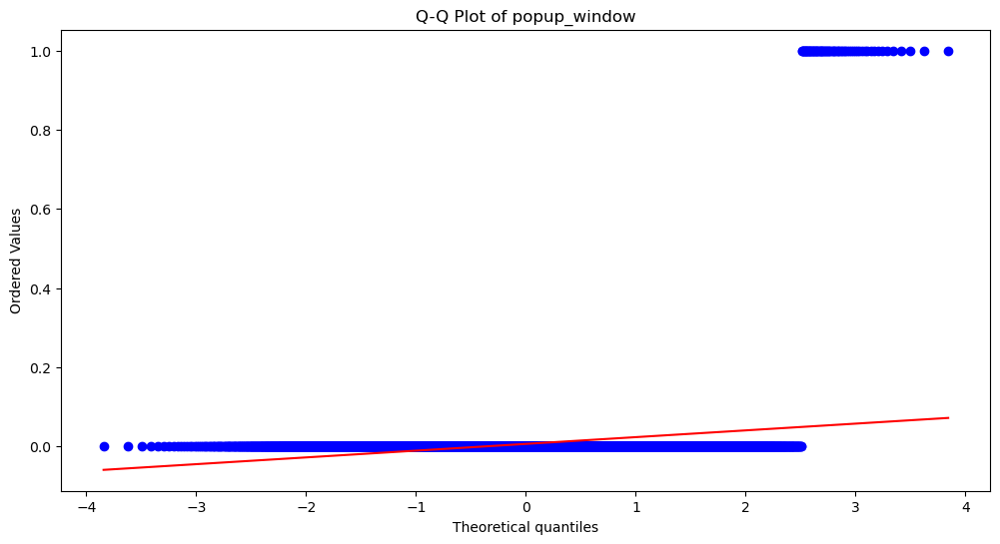

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.049, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: safe_anchor


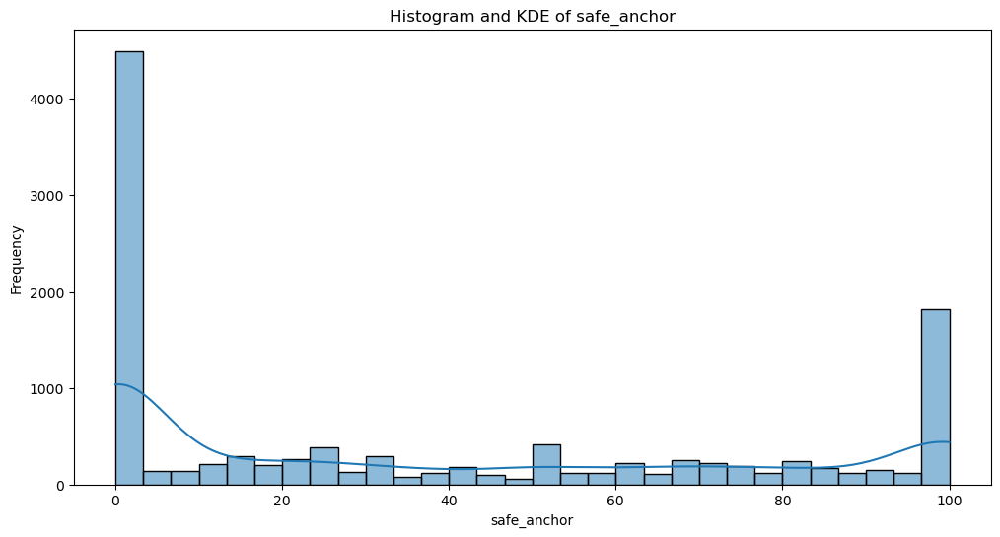

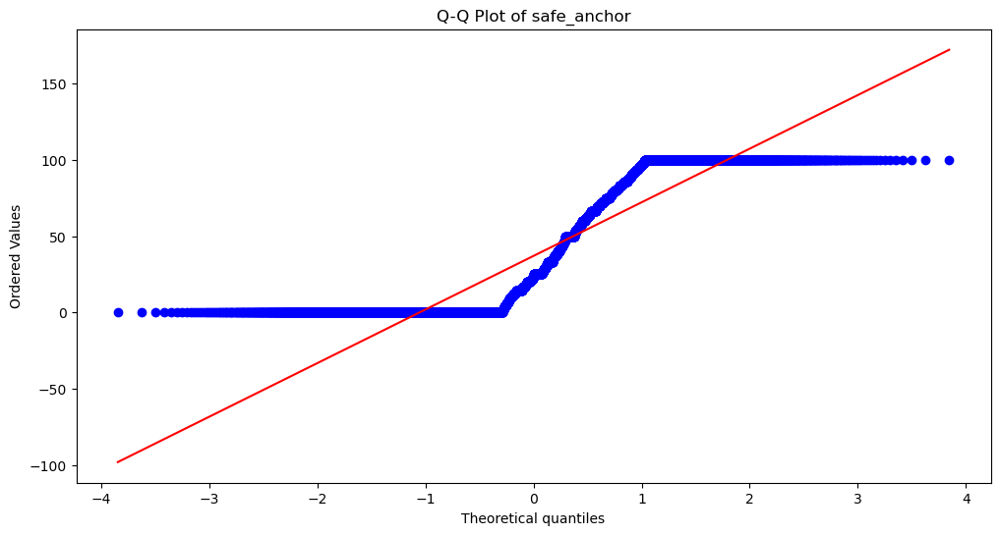

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.808, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: onmouseover


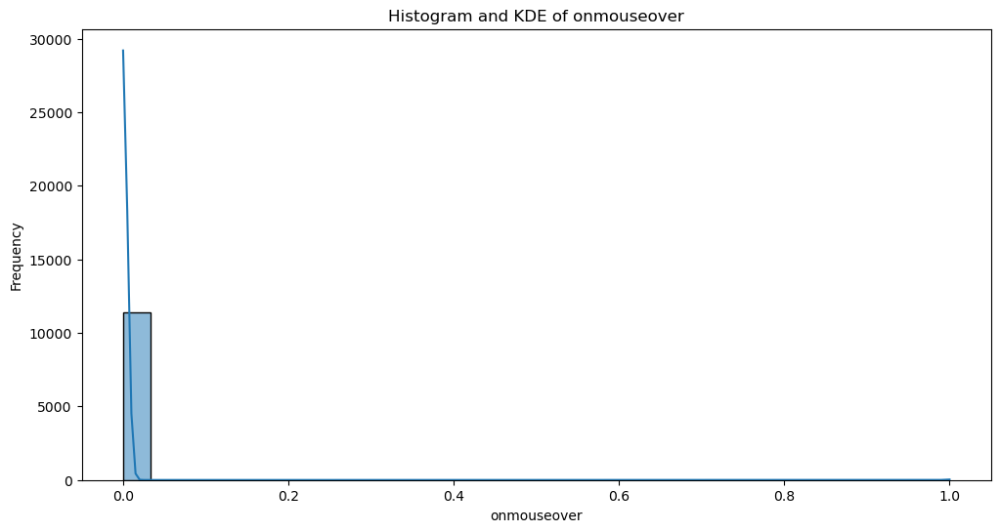

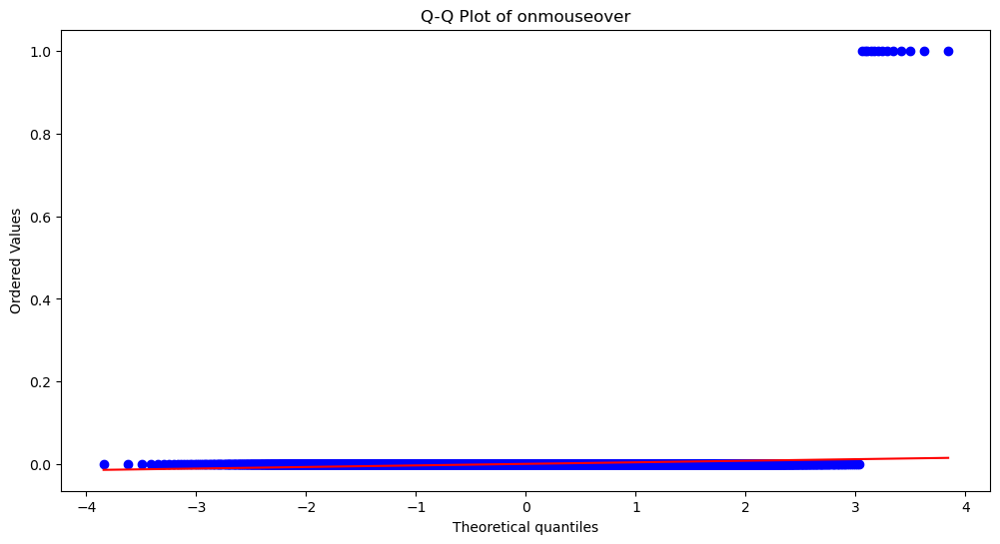

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.013, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: empty_title


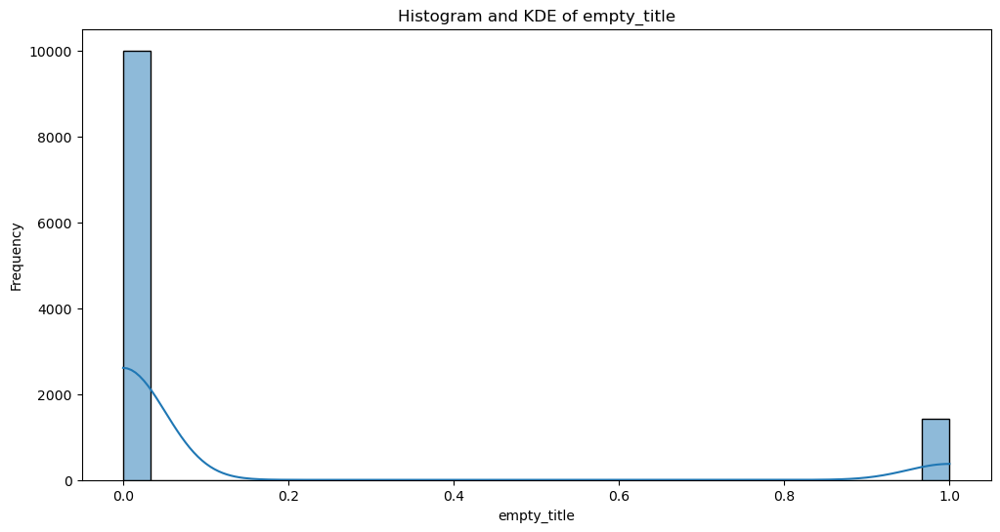

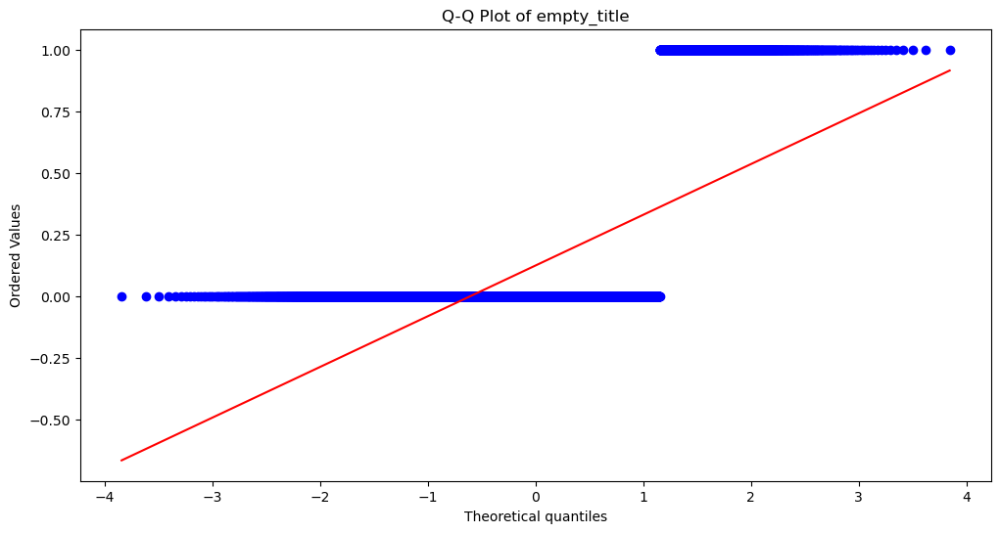

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.387, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: domain_registration_length


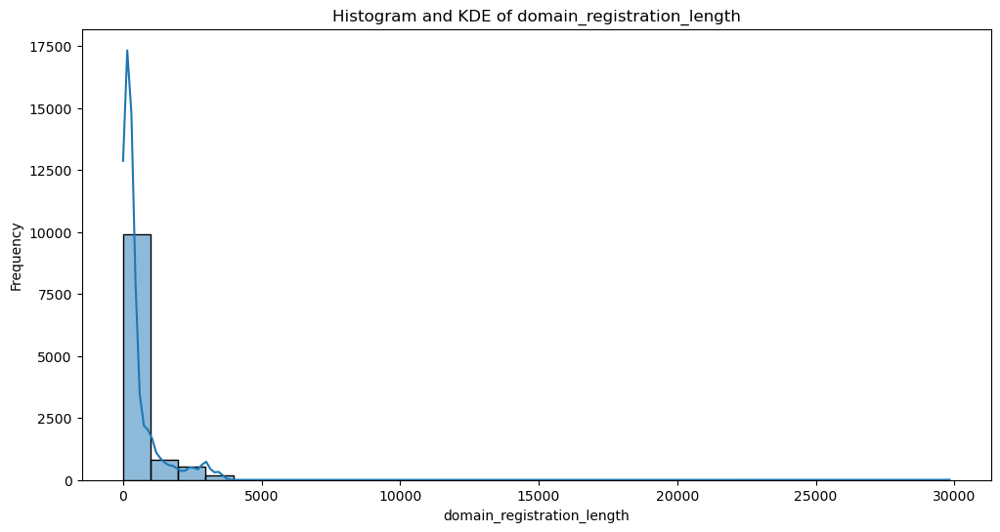

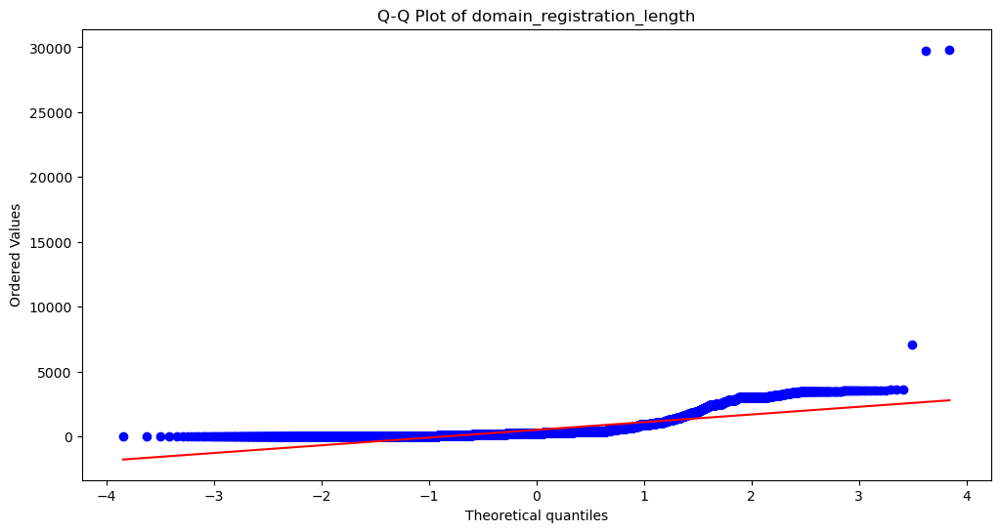

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.532, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: domain_age


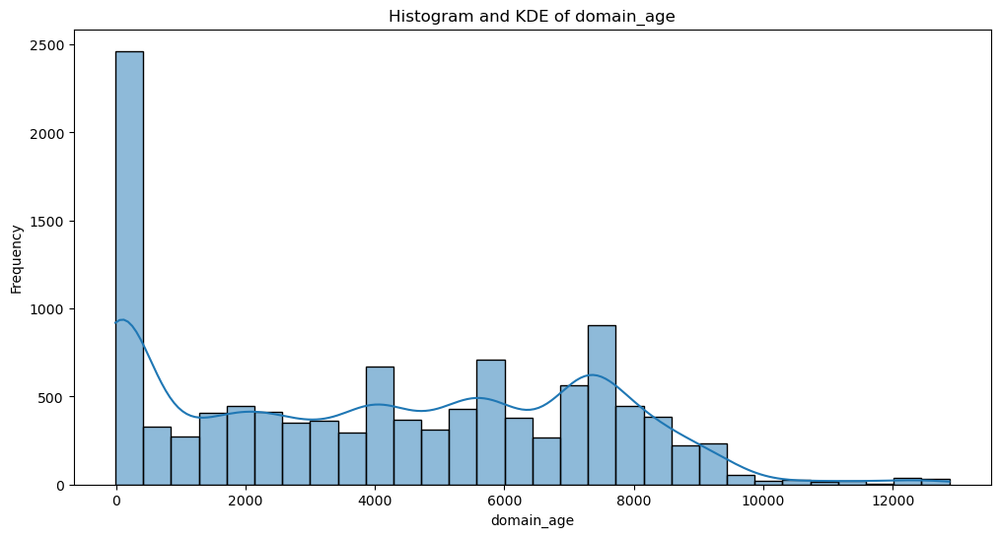

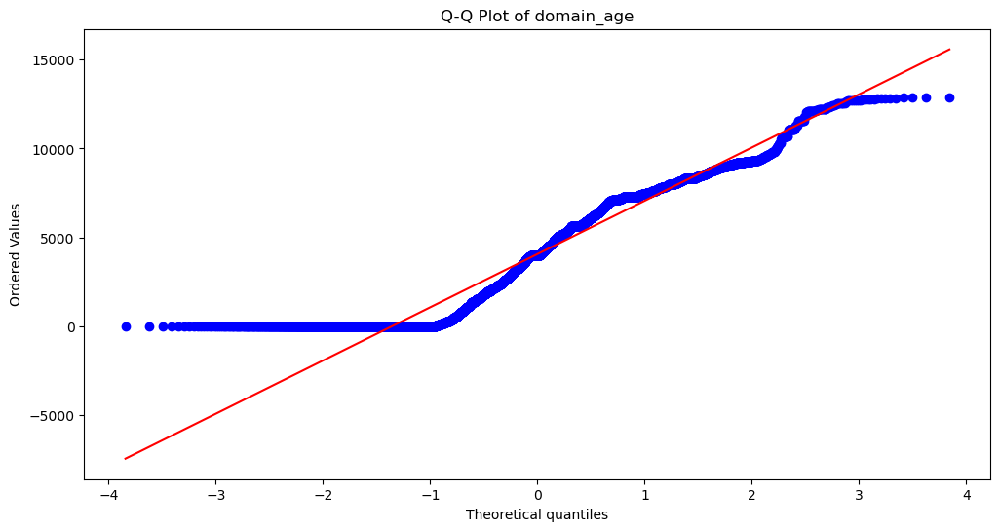

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.929, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: web_traffic


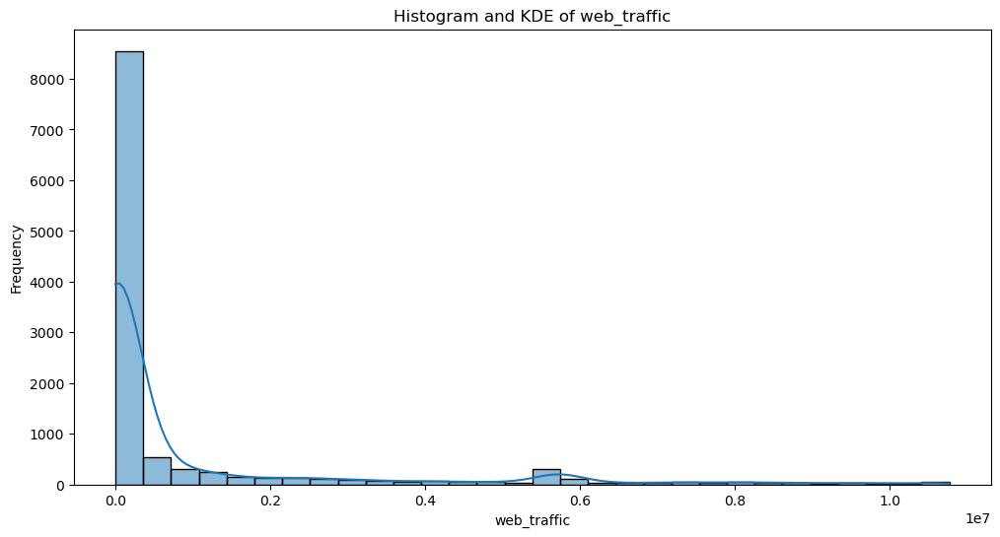

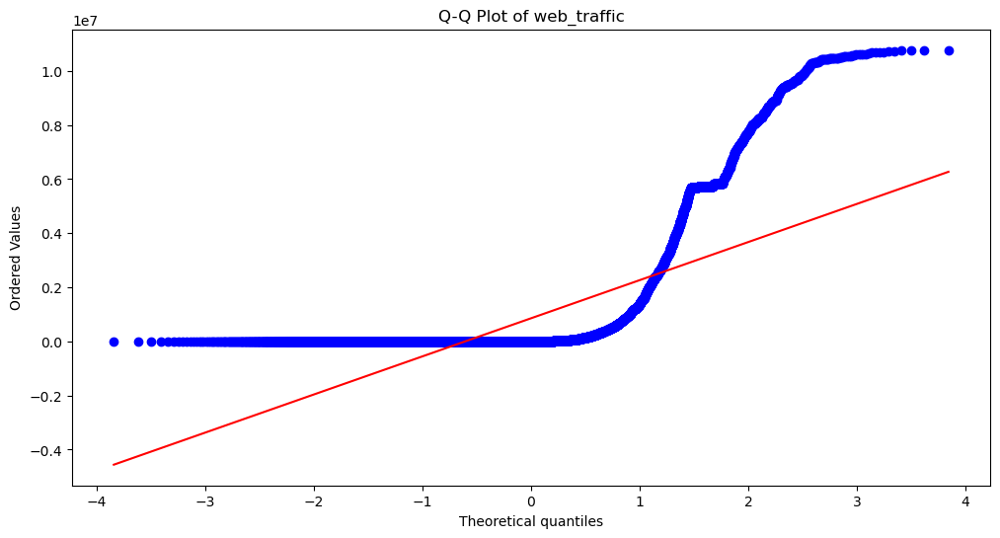

c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


Shapiro-Wilk Test:
Statistics=0.498, p-value=0.000
Sample does not look Gaussian (reject H0)

Analyzing column: page_rank


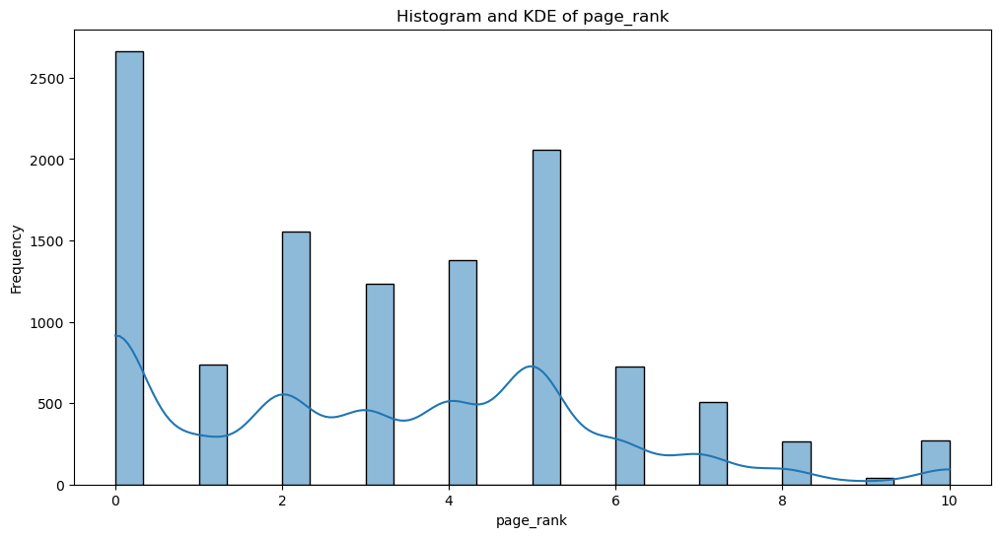

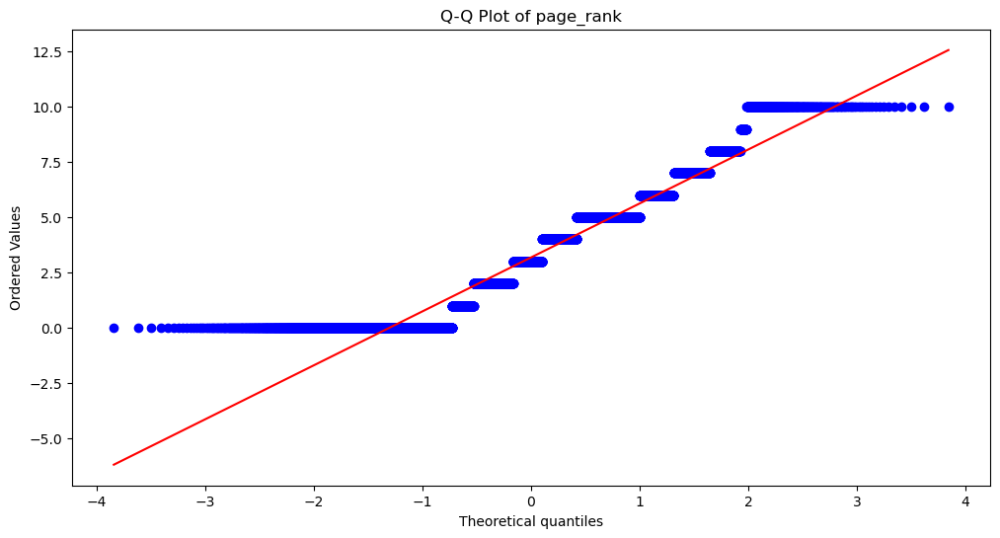

Shapiro-Wilk Test:
Statistics=0.924, p-value=0.000
Sample does not look Gaussian (reject H0)


c:\Users\Dell\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 11430.
  res = hypotest_fun_out(*samples, **kwds)


In [20]:
import scipy.stats as stats
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Loop through each numerical column to check for normality
for column_name in numerical_columns:
    print(f'\nAnalyzing column: {column_name}')

    # 1. Visual Inspection

    # a. Histogram with KDE
    plt.figure(figsize=(12, 6))
    sns.histplot(df[column_name], bins=30, kde=True)
    plt.title(f'Histogram and KDE of {column_name}')
    plt.xlabel(column_name)
    plt.ylabel('Frequency')
    plt.show()

    # b. Q-Q Plot
    plt.figure(figsize=(12, 6))
    stats.probplot(df[column_name], dist="norm", plot=plt)
    plt.title(f'Q-Q Plot of {column_name}')
    plt.show()

    # 2. Statistical Tests

    # a. Shapiro-Wilk Test
    shapiro_stat, shapiro_p = stats.shapiro(df[column_name])
    print('Shapiro-Wilk Test:')
    print(f'Statistics={shapiro_stat:.3f}, p-value={shapiro_p:.3f}')
    if shapiro_p > 0.05:
        print('Sample looks Gaussian (fail to reject H0)')
    else:
        print('Sample does not look Gaussian (reject H0)')


In [21]:
bins = [0, 50, 200, 1641]  # Define the edges of the bins
labels = ['Low', 'Medium', 'High']  # Define the labels for the bins

# Convert length_url to categorical values
df['length_url'] = pd.cut(df['length_url'], bins=bins, labels=labels, right=True)

# Display the updated DataFrame
print(df)

      length_url  length_hostname ip  nb_dots  nb_hyphens  nb_at  nb_qm  \
0            Low               19  0        3           0      0      0   
1         Medium               23  1        1           0      0      0   
2         Medium               50  1        4           1      0      1   
3            Low               11  0        2           0      0      0   
4         Medium               15  0        2           2      0      0   
...          ...              ... ..      ...         ...    ...    ...   
11425        Low               17  0        2           0      0      0   
11426     Medium               18  0        5           0      1      1   
11427     Medium               16  1        2           6      0      1   
11428        Low               30  0        2           0      0      0   
11429       High               14  1       24           0      1      1   

       nb_and  nb_or  nb_eq  ...  domain_in_title  domain_with_copyright  \
0           0      0   

In [22]:
df.dtypes

length_url         category
length_hostname       int64
ip                   object
nb_dots               int64
nb_hyphens            int64
                     ...   
web_traffic           int64
dns_record           object
google_index         object
page_rank             int64
status             category
Length: 88, dtype: object

In [23]:
from sklearn.preprocessing import RobustScaler

new_categorical_columns=df.select_dtypes(include=["category","object"]).columns.tolist()
new_numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
scaler = RobustScaler()
df_scaled = scaler.fit_transform(df[new_numerical_columns])
df_scaled = pd.DataFrame(df_scaled, columns=new_numerical_columns)
df_final = pd.concat([df_scaled,df[new_categorical_columns],], axis=1)
df_final


,length_hostname,nb_dots,nb_hyphens,nb_at,nb_qm,nb_and,nb_or,nb_eq,nb_underscore,nb_tilde,...,login_form,external_favicon,sfh,right_clic,domain_in_title,domain_with_copyright,whois_registered_domain,dns_record,google_index,status
0,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,1,1,1
1,0.444444,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,1,0,0,0,1,0
2,3.444444,2.0,1.0,0.0,1.0,2.0,0.0,3.0,2.0,0.0,...,0,0,0,0,1,0,0,0,1,0
3,-0.888889,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,1,0,0,0,0,1
4,-0.444444,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11425,-0.222222,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,0,0,0,0,0,1
11426,-0.111111,3.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,1,0,0,0,1,0
11427,-0.333333,0.0,6.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,...,0,1,0,0,0,0,0,0,1,1
11428,1.222222,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,1,0,0,0,0,1


In [24]:
df_final.isnull().sum().sum()

0

In [25]:
df_final

,length_hostname,nb_dots,nb_hyphens,nb_at,nb_qm,nb_and,nb_or,nb_eq,nb_underscore,nb_tilde,...,login_form,external_favicon,sfh,right_clic,domain_in_title,domain_with_copyright,whois_registered_domain,dns_record,google_index,status
0,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,1,1,1
1,0.444444,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,1,0,0,0,1,0
2,3.444444,2.0,1.0,0.0,1.0,2.0,0.0,3.0,2.0,0.0,...,0,0,0,0,1,0,0,0,1,0
3,-0.888889,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,1,0,0,0,0,1
4,-0.444444,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,0,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11425,-0.222222,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,0,0,0,0,0,1
11426,-0.111111,3.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,1,0,0,0,1,0
11427,-0.333333,0.0,6.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,...,0,1,0,0,0,0,0,0,1,1
11428,1.222222,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,0,1,0,0,0,0,1


In [26]:
# from sklearn.preprocessing import LabelEncoder

# # Create a LabelEncoder instance
# label_encoder = LabelEncoder()

# # Convert the 'status' column to numerical values
# df['status'] = label_encoder.fit_transform(df['status'])

# df['status'].dtype
# df['status']
df_final.columns

Index(['length_hostname', 'nb_dots', 'nb_hyphens', 'nb_at', 'nb_qm', 'nb_and',
       'nb_or', 'nb_eq', 'nb_underscore', 'nb_tilde', 'nb_percent', 'nb_slash',
       'nb_star', 'nb_colon', 'nb_comma', 'nb_semicolumn', 'nb_dollar',
       'nb_space', 'nb_www', 'nb_com', 'nb_dslash', 'ratio_digits_url',
       'ratio_digits_host', 'port', 'nb_subdomains', 'path_extension',
       'nb_redirection', 'nb_external_redirection', 'length_words_raw',
       'char_repeat', 'shortest_words_raw', 'shortest_word_host',
       'shortest_word_path', 'longest_words_raw', 'longest_word_host',
       'longest_word_path', 'avg_words_raw', 'avg_word_host', 'avg_word_path',
       'phish_hints', 'domain_in_brand', 'brand_in_subdomain', 'brand_in_path',
       'suspecious_tld', 'statistical_report', 'nb_hyperlinks',
       'ratio_intHyperlinks', 'ratio_extHyperlinks', 'ratio_nullHyperlinks',
       'nb_extCSS', 'ratio_intRedirection', 'ratio_extRedirection',
       'ratio_intErrors', 'ratio_extErrors', 'lin

In [27]:
df['status'].dtype

CategoricalDtype(categories=['0', '1'], ordered=False, categories_dtype=object)

In [28]:
object_columns = df_final.select_dtypes(include='object').columns.tolist()
df_final[object_columns] = df_final[object_columns].astype('category')
print(df_final.dtypes)


length_hostname             float64
nb_dots                     float64
nb_hyphens                  float64
nb_at                       float64
nb_qm                       float64
                             ...   
domain_with_copyright      category
whois_registered_domain    category
dns_record                 category
google_index               category
status                     category
Length: 88, dtype: object


In [29]:
print(df_final)

       length_hostname  nb_dots  nb_hyphens  nb_at  nb_qm  nb_and  nb_or  \
0             0.000000      1.0         0.0    0.0    0.0     0.0    0.0   
1             0.444444     -1.0         0.0    0.0    0.0     0.0    0.0   
2             3.444444      2.0         1.0    0.0    1.0     2.0    0.0   
3            -0.888889      0.0         0.0    0.0    0.0     0.0    0.0   
4            -0.444444      0.0         2.0    0.0    0.0     0.0    0.0   
...                ...      ...         ...    ...    ...     ...    ...   
11425        -0.222222      0.0         0.0    0.0    0.0     0.0    0.0   
11426        -0.111111      3.0         0.0    1.0    1.0     0.0    0.0   
11427        -0.333333      0.0         6.0    0.0    1.0     0.0    0.0   
11428         1.222222      0.0         0.0    0.0    0.0     0.0    0.0   
11429        -0.555556     22.0         0.0    1.0    1.0     9.0    0.0   

       nb_eq  nb_underscore  nb_tilde  ...  login_form  external_favicon  sfh  \
0     

In [30]:
group_legitimate = df_final[df_final['status'] == '1']
group_phishing = df_final[df_final['status'] == '0']

# Initialize a dictionary to store the results
z_test_results = {}

# Set the p-value threshold
p_value_threshold = 0.05

# Perform z-test for each numerical column
for column in df_final.select_dtypes(include=['float64', 'int64']).columns:
    # Calculate means and standard deviations
    mean_legitimate = group_legitimate[column].mean()
    mean_phishing = group_phishing[column].mean()

    std_legitimate = group_legitimate[column].std(ddof=0)  # Population std deviation
    std_phishing = group_phishing[column].std(ddof=0)      # Population std deviation

    n_legitimate = len(group_legitimate[column])
    n_phishing = len(group_phishing[column])

    # Calculate the z-score
    z_score = (mean_legitimate - mean_phishing) / np.sqrt((std_legitimate**2 / n_legitimate) + (std_phishing**2 / n_phishing))

    # Calculate the p-value
    p_value = 2 * (1 - stats.norm.cdf(abs(z_score)))  # Two-tailed test

    # Determine significance message
    if p_value < p_value_threshold:
        significance_message = "Significant difference between groups."
    else:
        significance_message = "No significant difference between groups."

    # Store the results
    z_test_results[column] = {
        'z_score': z_score,
        'p_value': p_value,
        'mean_legitimate': mean_legitimate,
        'mean_phishing': mean_phishing,
        'significance_message': significance_message  # Append the message
    }

# Display the results
for column, result in z_test_results.items():
    print(f"Column: {column}")
    print(f"Z-Score: {result['z_score']:.4f}, P-Value: {result['p_value']:.4f}")
    print(f"Mean (Legitimate): {result['mean_legitimate']:.4f}, Mean (Phishing): {result['mean_phishing']:.4f}")
    print(f"Result: {result['significance_message']}\n")

Column: length_hostname
Z-Score: -26.2353, P-Value: 0.0000
Mean (Legitimate): -0.0531, Mean (Phishing): 0.5176
Result: Significant difference between groups.

Column: nb_dots
Z-Score: -22.6238, P-Value: 0.0000
Mean (Legitimate): 0.1972, Mean (Phishing): 0.7643
Result: Significant difference between groups.

Column: nb_hyphens
Z-Score: 10.7566, P-Value: 0.0000
Mean (Legitimate): 1.2065, Mean (Phishing): 0.7886
Result: Significant difference between groups.

Column: nb_at
Z-Score: -15.4376, P-Value: 0.0000
Mean (Legitimate): 0.0000, Mean (Phishing): 0.0444
Result: Significant difference between groups.

Column: nb_qm
Z-Score: -32.9243, P-Value: 0.0000
Mean (Legitimate): 0.0339, Mean (Phishing): 0.2485
Result: Significant difference between groups.

Column: nb_and
Z-Score: -18.5044, P-Value: 0.0000
Mean (Legitimate): 0.0222, Mean (Phishing): 0.3024
Result: Significant difference between groups.

Column: nb_or
Z-Score: nan, P-Value: nan
Mean (Legitimate): 0.0000, Mean (Phishing): 0.0000
Re

C:\Users\Dell\AppData\Local\Temp\ipykernel_120756\2577512563.py:23: RuntimeWarning: invalid value encountered in scalar divide
  z_score = (mean_legitimate - mean_phishing) / np.sqrt((std_legitimate**2 / n_legitimate) + (std_phishing**2 / n_phishing))


In [31]:
df_final.columns

Index(['length_hostname', 'nb_dots', 'nb_hyphens', 'nb_at', 'nb_qm', 'nb_and',
       'nb_or', 'nb_eq', 'nb_underscore', 'nb_tilde', 'nb_percent', 'nb_slash',
       'nb_star', 'nb_colon', 'nb_comma', 'nb_semicolumn', 'nb_dollar',
       'nb_space', 'nb_www', 'nb_com', 'nb_dslash', 'ratio_digits_url',
       'ratio_digits_host', 'port', 'nb_subdomains', 'path_extension',
       'nb_redirection', 'nb_external_redirection', 'length_words_raw',
       'char_repeat', 'shortest_words_raw', 'shortest_word_host',
       'shortest_word_path', 'longest_words_raw', 'longest_word_host',
       'longest_word_path', 'avg_words_raw', 'avg_word_host', 'avg_word_path',
       'phish_hints', 'domain_in_brand', 'brand_in_subdomain', 'brand_in_path',
       'suspecious_tld', 'statistical_report', 'nb_hyperlinks',
       'ratio_intHyperlinks', 'ratio_extHyperlinks', 'ratio_nullHyperlinks',
       'nb_extCSS', 'ratio_intRedirection', 'ratio_extRedirection',
       'ratio_intErrors', 'ratio_extErrors', 'lin

In [32]:
categorical_columns = df_final.select_dtypes(include='category').columns.tolist()
categorical_columns.remove('status')

chi_squared_results = {}

# Perform Chi-Squared test for each categorical column
for column in categorical_columns:
    # Create a contingency table
    contingency_table = pd.crosstab(df_final[column], df_final['status'])

    # Perform the Chi-Squared test
    chi2_stat, p_value, dof, expected_frequencies = stats.chi2_contingency(contingency_table)

    # Store the results
    chi_squared_results[column] = {
        'chi_squared_statistic': chi2_stat,
        'p_value': p_value,
        'contingency_table': contingency_table,
        'expected_frequencies': expected_frequencies
    }

# Display the results
for column, result in chi_squared_results.items():
    print(f"Column: {column}")
    print(f"Chi-Squared Statistic: {result['chi_squared_statistic']:.4f}, P-Value: {result['p_value']:.4f}")
    print("Contingency Table:")
    print(result['contingency_table'])
    print("Expected Frequencies:")
    print(result['expected_frequencies'])

    # Interpret the result
    alpha = 0.05
    if result['p_value'] < alpha:
        print("Result: Reject the null hypothesis. There is a significant association between the variable and status.\n")
    else:
        print("Result: Fail to reject the null hypothesis. There is no significant association between the variable and status.\n")

Column: length_url
Chi-Squared Statistic: 575.0547, P-Value: 0.0000
Contingency Table:
status         0     1
length_url            
Low         2561  3683
Medium      2920  2024
High         234     8
Expected Frequencies:
[[3122. 3122.]
 [2472. 2472.]
 [ 121.  121.]]
Result: Reject the null hypothesis. There is a significant association between the variable and status.

Column: ip
Chi-Squared Statistic: 1181.0862, P-Value: 0.0000
Contingency Table:
status     0     1
ip                
0       4197  5512
1       1518   203
Expected Frequencies:
[[4854.5 4854.5]
 [ 860.5  860.5]]
Result: Reject the null hypothesis. There is a significant association between the variable and status.

Column: http_in_path
Chi-Squared Statistic: 66.6313, P-Value: 0.0000
Contingency Table:
status           0     1
http_in_path            
0             5591  5689
1              104    25
2                9     1
3                2     0
4                9     0
Expected Frequencies:
[[5.64e+03 5.64e+03]
 

In [33]:
categorical_columns = df_final.select_dtypes(include='category').columns.tolist()
categorical_columns.remove('status')  # Remove the target variable

# Initialize a list to store columns to drop
columns_to_drop = []

# Perform Chi-Squared test for each categorical column
for column in categorical_columns:
    # Create a contingency table
    contingency_table = pd.crosstab(df_final[column], df_final['status'])

    # Perform the Chi-Squared test
    chi2_stat, p_value, dof, expected_frequencies = stats.chi2_contingency(contingency_table)

    # Check the result and store the column name if no significant association
    alpha = 0.05
    if p_value >= alpha:
        columns_to_drop.append(column)

# Drop the columns with no significant association
df_final_dropped = df_final.drop(columns=columns_to_drop)

# Display the updated DataFrame
print("Updated DataFrame after dropping columns with no significant association:")
print(df_final_dropped)

Updated DataFrame after dropping columns with no significant association:
       length_hostname  nb_dots  nb_hyphens  nb_at  nb_qm  nb_and  nb_or  \
0             0.000000      1.0         0.0    0.0    0.0     0.0    0.0   
1             0.444444     -1.0         0.0    0.0    0.0     0.0    0.0   
2             3.444444      2.0         1.0    0.0    1.0     2.0    0.0   
3            -0.888889      0.0         0.0    0.0    0.0     0.0    0.0   
4            -0.444444      0.0         2.0    0.0    0.0     0.0    0.0   
...                ...      ...         ...    ...    ...     ...    ...   
11425        -0.222222      0.0         0.0    0.0    0.0     0.0    0.0   
11426        -0.111111      3.0         0.0    1.0    1.0     0.0    0.0   
11427        -0.333333      0.0         6.0    0.0    1.0     0.0    0.0   
11428         1.222222      0.0         0.0    0.0    0.0     0.0    0.0   
11429        -0.555556     22.0         0.0    1.0    1.0     9.0    0.0   

       nb_eq 

In [34]:
columns_to_drop

['punycode', 'sfh', 'right_clic']

In [35]:
numerical_columns = df_final.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Initialize a list to store columns to drop
columns_to_drop_numerical = []

# Perform t-test for each numerical column
for column in numerical_columns:
    # Separate the groups based on the 'status' column
    group_legitimate = df_final[df_final['status'] == '1'][column]
    group_phishing = df_final[df_final['status'] == '0'][column]

    # Perform the t-test
    t_stat, p_value = stats.ttest_ind(group_legitimate, group_phishing, equal_var=False)  # Welch's t-test

    # Check the result and store the column name if no significant association
    alpha = 0.05
    if p_value >= alpha:
        columns_to_drop_numerical.append(column)

# Drop the columns with no significant association
df_final_dropped_numerical = df_final.drop(columns=columns_to_drop_numerical)

# Display the updated DataFrame
print("Updated DataFrame after dropping numerical columns with no significant association:")
print(df_final_dropped_numerical)

Updated DataFrame after dropping numerical columns with no significant association:
       length_hostname  nb_dots  nb_hyphens  nb_at  nb_qm  nb_and  nb_or  \
0             0.000000      1.0         0.0    0.0    0.0     0.0    0.0   
1             0.444444     -1.0         0.0    0.0    0.0     0.0    0.0   
2             3.444444      2.0         1.0    0.0    1.0     2.0    0.0   
3            -0.888889      0.0         0.0    0.0    0.0     0.0    0.0   
4            -0.444444      0.0         2.0    0.0    0.0     0.0    0.0   
...                ...      ...         ...    ...    ...     ...    ...   
11425        -0.222222      0.0         0.0    0.0    0.0     0.0    0.0   
11426        -0.111111      3.0         0.0    1.0    1.0     0.0    0.0   
11427        -0.333333      0.0         6.0    0.0    1.0     0.0    0.0   
11428         1.222222      0.0         0.0    0.0    0.0     0.0    0.0   
11429        -0.555556     22.0         0.0    1.0    1.0     9.0    0.0   

   

In [36]:
columns_to_drop_numerical

['nb_comma',
 'nb_space',
 'port',
 'path_extension',
 'char_repeat',
 'iframe',
 'onmouseover']

In [37]:
df_final_dropped_numerical.isnull().sum().sum()

0

In [38]:
df_final_dropped_numerical.columns


Index(['length_hostname', 'nb_dots', 'nb_hyphens', 'nb_at', 'nb_qm', 'nb_and',
       'nb_or', 'nb_eq', 'nb_underscore', 'nb_tilde', 'nb_percent', 'nb_slash',
       'nb_star', 'nb_colon', 'nb_semicolumn', 'nb_dollar', 'nb_www', 'nb_com',
       'nb_dslash', 'ratio_digits_url', 'ratio_digits_host', 'nb_subdomains',
       'nb_redirection', 'nb_external_redirection', 'length_words_raw',
       'shortest_words_raw', 'shortest_word_host', 'shortest_word_path',
       'longest_words_raw', 'longest_word_host', 'longest_word_path',
       'avg_words_raw', 'avg_word_host', 'avg_word_path', 'phish_hints',
       'domain_in_brand', 'brand_in_subdomain', 'brand_in_path',
       'suspecious_tld', 'statistical_report', 'nb_hyperlinks',
       'ratio_intHyperlinks', 'ratio_extHyperlinks', 'ratio_nullHyperlinks',
       'nb_extCSS', 'ratio_intRedirection', 'ratio_extRedirection',
       'ratio_intErrors', 'ratio_extErrors', 'links_in_tags', 'submit_email',
       'ratio_intMedia', 'ratio_extMedia', 

In [39]:
df_final_dropped_numerical['length_hostname'].dtype

dtype('float64')

In [40]:
df_final_dropped_numerical['google_index'].dtype

CategoricalDtype(categories=['0', '1'], ordered=False, categories_dtype=object)

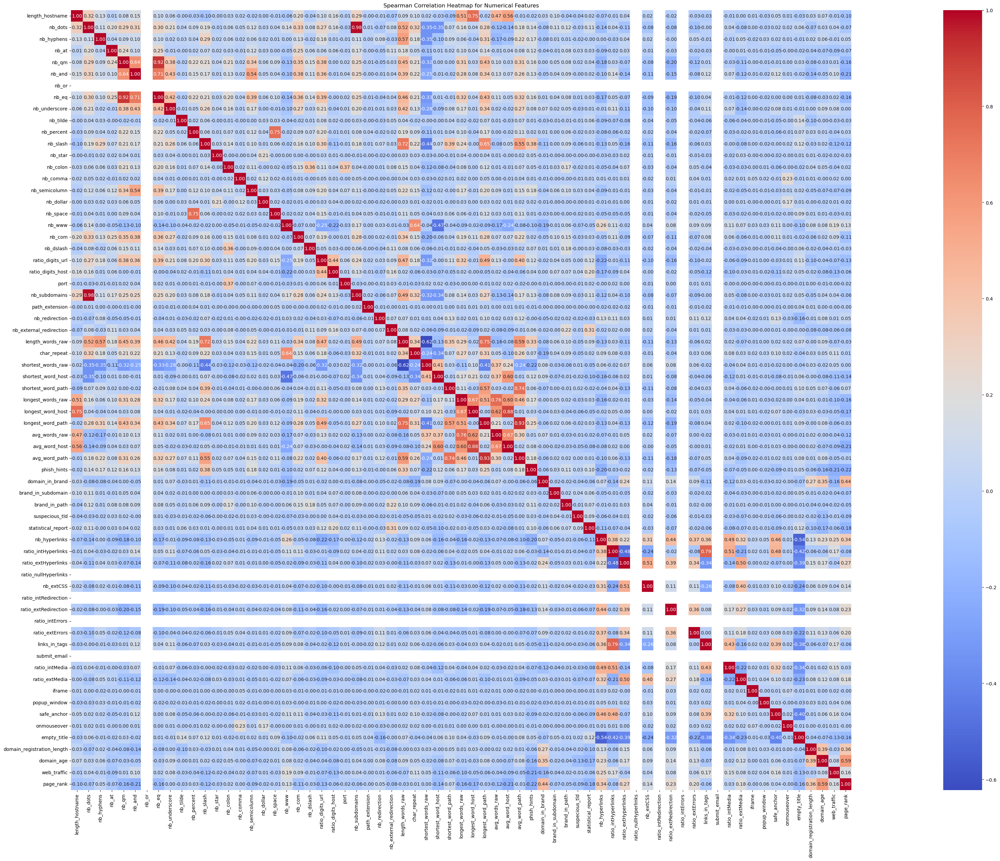


Updated DataFrame after removing highly correlated features:
      length_url  length_hostname ip  nb_dots  nb_hyphens  nb_at  nb_qm  \
0            Low               19  0        3           0      0      0   
1         Medium               23  1        1           0      0      0   
2         Medium               50  1        4           1      0      1   
3            Low               11  0        2           0      0      0   
4         Medium               15  0        2           2      0      0   
...          ...              ... ..      ...         ...    ...    ...   
11425        Low               17  0        2           0      0      0   
11426     Medium               18  0        5           0      1      1   
11427     Medium               16  1        2           6      0      1   
11428        Low               30  0        2           0      0      0   
11429       High               14  1       24           0      1      1   

       nb_and  nb_or  nb_underscore  

In [41]:
numerical_features = df.select_dtypes(include=['int64', 'float64'])
spearman_corr = numerical_features.corr(method='spearman')

# Step 2: Create a heatmap for Spearman correlation
plt.figure(figsize=(70, 30))
sns.heatmap(spearman_corr, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Spearman Correlation Heatmap for Numerical Features')
plt.show()

# Step 3: Identify highly correlated features (threshold can be adjusted)
threshold = 0.7
features_to_drop = set()

# Iterate through the correlation matrix to find pairs with high correlation
for i in range(len(spearman_corr.columns)):
    for j in range(i):
        if abs(spearman_corr.iloc[i, j]) > threshold:
            # Add one of the correlated features to the drop list
            features_to_drop.add(spearman_corr.columns[i])  # Drop the second feature in the pair

# Step 4: Drop the identified features from the DataFrame
df_reduced = df.drop(columns=features_to_drop)

# Display the updated DataFrame
print("\nUpdated DataFrame after removing highly correlated features:")
print(df_reduced)
print("Dropped features: ",features_to_drop )

In [42]:
df_reduced

,length_url,length_hostname,ip,nb_dots,nb_hyphens,nb_at,nb_qm,nb_and,nb_or,nb_underscore,...,domain_in_title,domain_with_copyright,whois_registered_domain,domain_registration_length,domain_age,web_traffic,dns_record,google_index,page_rank,status
0,Low,19,0,3,0,0,0,0,0,0,...,0,1,0,45,-1,0,1,1,4,1
1,Medium,23,1,1,0,0,0,0,0,0,...,1,0,0,77,5767,0,0,1,2,0
2,Medium,50,1,4,1,0,1,2,0,2,...,1,0,0,14,4004,5828815,0,1,0,0
3,Low,11,0,2,0,0,0,0,0,0,...,1,0,0,62,-1,107721,0,0,3,1
4,Medium,15,0,2,2,0,0,0,0,0,...,0,1,0,224,8175,8725,0,0,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11425,Low,17,0,2,0,0,0,0,0,0,...,0,0,0,448,5396,3980,0,0,6,1
11426,Medium,18,0,5,0,1,1,0,0,0,...,1,0,0,211,6728,0,0,1,0,0
11427,Medium,16,1,2,6,0,1,0,0,1,...,0,0,0,2809,8515,8,0,1,10,1
11428,Low,30,0,2,0,0,0,0,0,0,...,1,0,0,85,2836,2455493,0,0,4,1


In [43]:
df_reduced.isnull().sum().sum()

0

In [44]:
df_reduced.columns.dtype

dtype('O')

In [45]:
df_reduced.dtypes

length_url         category
length_hostname       int64
ip                   object
nb_dots               int64
nb_hyphens            int64
                     ...   
web_traffic           int64
dns_record           object
google_index         object
page_rank             int64
status             category
Length: 78, dtype: object

In [46]:
# from sklearn.preprocessing import LabelEncoder
# categorical_features = df_reduced.select_dtypes(include=['object', 'category']).columns.tolist()
# categorical_features.remove('status')  # Exclude the 'status' feature

# label_encoder = LabelEncoder()

# # Step 3: Apply Label Encoding to each categorical feature
# for feature in categorical_features:
#     df_reduced[feature] = label_encoder.fit_transform(df[feature])

# df_reduced['categorical_features']=df_reduced['categorical_features'].astype('int64')
# print("DataFrame after Label Encoding:")
# print(df_reduced)
# df_reduced.dtypes
df_reduced["status"]


0        1
1        0
2        0
3        1
4        1
        ..
11425    1
11426    0
11427    1
11428    1
11429    0
Name: status, Length: 11430, dtype: category
Categories (2, object): ['0', '1']

In [47]:
from sklearn.preprocessing import LabelEncoder
categorical_features = df_reduced.select_dtypes(include=['object', 'category']).columns.tolist()
categorical_features.remove('status')  # Exclude the 'status' feature

# Step 2: Initialize LabelEncoder
label_encoder = LabelEncoder()

# Step 3: Apply Label Encoding to each categorical feature
for feature in categorical_features:
    df_reduced[feature] = label_encoder.fit_transform(df[feature])

# Step 4: Convert only categorical features to int64, leaving 'status' unchanged
df[categorical_features] = df_reduced[categorical_features].astype('int64')

# Display the DataFrame after encoding and conversion
print("DataFrame after Label Encoding and conversion to int64 (excluding 'status'):")
print(df_reduced)

DataFrame after Label Encoding and conversion to int64 (excluding 'status'):
       length_url  length_hostname  ip  nb_dots  nb_hyphens  nb_at  nb_qm  \
0               1               19   0        3           0      0      0   
1               2               23   1        1           0      0      0   
2               2               50   1        4           1      0      1   
3               1               11   0        2           0      0      0   
4               2               15   0        2           2      0      0   
...           ...              ...  ..      ...         ...    ...    ...   
11425           1               17   0        2           0      0      0   
11426           2               18   0        5           0      1      1   
11427           2               16   1        2           6      0      1   
11428           1               30   0        2           0      0      0   
11429           0               14   1       24           0      1      1   

In [48]:
df_reduced

,length_url,length_hostname,ip,nb_dots,nb_hyphens,nb_at,nb_qm,nb_and,nb_or,nb_underscore,...,domain_in_title,domain_with_copyright,whois_registered_domain,domain_registration_length,domain_age,web_traffic,dns_record,google_index,page_rank,status
0,1,19,0,3,0,0,0,0,0,0,...,0,1,0,45,-1,0,1,1,4,1
1,2,23,1,1,0,0,0,0,0,0,...,1,0,0,77,5767,0,0,1,2,0
2,2,50,1,4,1,0,1,2,0,2,...,1,0,0,14,4004,5828815,0,1,0,0
3,1,11,0,2,0,0,0,0,0,0,...,1,0,0,62,-1,107721,0,0,3,1
4,2,15,0,2,2,0,0,0,0,0,...,0,1,0,224,8175,8725,0,0,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11425,1,17,0,2,0,0,0,0,0,0,...,0,0,0,448,5396,3980,0,0,6,1
11426,2,18,0,5,0,1,1,0,0,0,...,1,0,0,211,6728,0,0,1,0,0
11427,2,16,1,2,6,0,1,0,0,1,...,0,0,0,2809,8515,8,0,1,10,1
11428,1,30,0,2,0,0,0,0,0,0,...,1,0,0,85,2836,2455493,0,0,4,1


Number of principal components to retain for 95.0% variance: 58


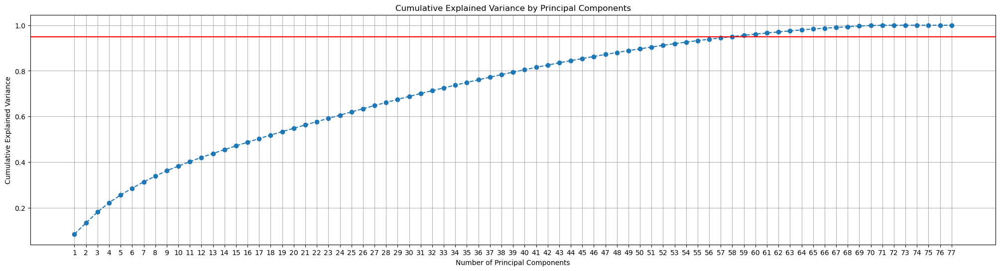


PCA DataFrame:
            PC 1       PC 2      PC 3       PC 4       PC 5      PC 6  \
0      -0.328666  -0.295577  0.121834   3.446753  -0.607521 -0.317105   
1       1.021404  -1.828486  1.468599  -1.099268   1.353590 -0.182356   
2       5.348835   0.229389  3.098833  -1.999128   3.781668 -0.273056   
3      -1.588411  -0.964629  1.617031   1.233253  -0.642652 -1.568020   
4      -1.856942   1.606555 -0.970391   0.194741  -0.178271  0.648664   
...          ...        ...       ...        ...        ...       ...   
11425  -2.118413   1.109801  0.002261   0.637577  -0.895282  0.795136   
11426   2.734559   0.418164  0.519138  -1.177519  -0.858594  0.426286   
11427   0.016988   3.758310 -1.229396  -1.331530   1.125323  3.636078   
11428  -1.393625   0.000005 -1.534660   0.055735   0.121818 -0.676424   
11429  30.632400  15.312482 -7.613067  17.328730 -13.445864 -7.829523   

           PC 7      PC 8      PC 9     PC 10  ...     PC 50     PC 51  \
0      0.633448  0.058788  0.0311

In [49]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler





# Step 1: Separate features and target
X = df_reduced.drop(columns=['status'])  # Features
y = df_reduced['status']  # Target

# Step 2: Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X)

# Step 3: Compute PCA
pca = PCA()
pca.fit(scaled_data)

# Step 4: Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Step 5: Determine the number of components based on a threshold (e.g., 95%)
threshold = 0.95
n_components = np.argmax(cumulative_variance >= threshold) + 1  # +1 because of zero indexing

print(f"Number of principal components to retain for {threshold*100}% variance: {n_components}")

# Step 6: Fit PCA again with the determined number of components
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(scaled_data)

# Step 7: Create a DataFrame with the PCA results
pca_df = pd.DataFrame(data=X_pca, columns=[f'PC {i+1}' for i in range(n_components)])

# Optionally, add the target feature back to the PCA DataFrame
pca_df['status'] = y.values

# Step 8: Visualize the explained variance
plt.figure(figsize=(25, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.axhline(y=threshold, color='r', linestyle='-')
plt.title('Cumulative Explained Variance by Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.xticks(range(1, len(cumulative_variance) + 1))
plt.grid()
plt.show()

# Display the PCA DataFrame
print("\nPCA DataFrame:")
print(pca_df)



In [50]:
# Convert all columns except 'status' to float
for col in pca_df.columns:
    if col != "status":
        pca_df[col] = pd.to_numeric(pca_df[col], errors="coerce")  # Converts non-numeric values to NaN


min_max_df = pca_df.drop(columns=["status"], errors="ignore").agg(["min", "max"]).T
print(min_max_df)

             min        max
PC 1   -4.226687  35.570699
PC 2   -6.240969  19.595125
PC 3   -9.255734   4.348557
PC 4   -6.133033  17.631820
PC 5  -19.720613   6.838719
PC 6  -11.506064   9.989060
PC 7   -7.914501   8.575106
PC 8   -8.058803   6.893014
PC 9  -11.418812  20.032998
PC 10 -17.845098   7.102690
PC 11 -11.465496   9.249313
PC 12  -9.903477  13.642979
PC 13  -9.547110  18.195919
PC 14  -9.175750  19.102498
PC 15  -8.568329  14.715398
PC 16 -19.128769  10.512718
PC 17 -22.821374  19.902218
PC 18 -22.927868  26.967211
PC 19  -8.241090  30.677738
PC 20 -10.248527  19.360769
PC 21 -27.409699  12.671892
PC 22 -11.000425  14.970098
PC 23 -10.068894  25.118128
PC 24  -7.343534  53.983427
PC 25 -15.456364  15.937668
PC 26 -23.209794  41.329869
PC 27 -21.298691  24.372498
PC 28 -13.829250  18.715145
PC 29  -9.689507  16.133795
PC 30  -7.644466  20.702900
PC 31 -13.495337  21.992436
PC 32 -19.593295  16.457143
PC 33  -7.853126  21.980270
PC 34  -9.570675  26.099441
PC 35 -10.530712  10

In [51]:
pca_df['status'] = pca_df['status'].astype(int)

from sklearn.model_selection import train_test_split,RandomizedSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix,precision_score,recall_score,f1_score
import xgboost as xgb

#Load the Phishing dataset

X = pca_df.drop(columns=['status'])   # Features
y = pca_df['status'] # Target variable (species)

#  Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

param_dist = {
    'n_estimators': [15,40,60],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [2,4,6,8],
    'subsample': [0.4, 0.6, 0.8],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'reg_alpha': [30, 50, 70, 90],  # L1 regularization
}


# Step 3: Create and train the XGBoost model
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')

#  Set up RandomizedSearchCV
random_search = RandomizedSearchCV(
    model,
    param_distributions=param_dist,
    n_iter=5,  # Number of parameter settings to sample
    scoring='accuracy',  # Metric to optimize
    cv=15,  # Number of cross-validation folds
    verbose=1,
    random_state=42,
    n_jobs=-1
)

random_search.fit(X_train, y_train)

best_params = random_search.best_params_
best_score = random_search.best_score_


best_model = random_search.best_estimator_
y_train_pred = best_model.predict(X_train)


train_accuracy = accuracy_score(y_train, y_train_pred)
train_precision = precision_score(y_train, y_train_pred, average='weighted')
train_recall = recall_score(y_train, y_train_pred, average='weighted')
train_f1 = f1_score(y_train, y_train_pred, average='weighted')
train_conf_matrix = confusion_matrix(y_train, y_train_pred)


y_test_pred = best_model.predict(X_test)


test_accuracy = accuracy_score(y_test, y_test_pred)
test_precision = precision_score(y_test, y_test_pred, average='weighted')
test_recall = recall_score(y_test, y_test_pred, average='weighted')
test_f1 = f1_score(y_test, y_test_pred, average='weighted')
test_conf_matrix = confusion_matrix(y_test, y_test_pred)


results_df = pd.DataFrame({
    'Metric': ['Best Cross-Validation Score', 'Training Accuracy', 'Testing Accuracy', 'Training Precision',
               'Testing Precision', 'Training Recall', 'Testing Recall', 'Training F1 Score', 'Testing F1 Score'],
    'Score': [best_score, train_accuracy, test_accuracy, train_precision, test_precision, train_recall, test_recall, train_f1, test_f1]
})


print("\nBest Parameters:", best_params)
print("\nResults DataFrame:")
print(results_df)


print("\nTraining Confusion Matrix:")
print(train_conf_matrix)
print("\nTesting Confusion Matrix:")
print(test_conf_matrix)

Fitting 15 folds for each of 5 candidates, totalling 75 fits


c:\Users\Dell\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [01:31:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



Best Parameters: {'subsample': 0.8, 'reg_alpha': 30, 'n_estimators': 40, 'max_depth': 8, 'learning_rate': 0.1, 'colsample_bytree': 1.0}

Results DataFrame:
                        Metric     Score
0  Best Cross-Validation Score  0.931433
1            Training Accuracy  0.947616
2             Testing Accuracy  0.940945
3           Training Precision  0.947623
4            Testing Precision  0.941172
5              Training Recall  0.947616
6               Testing Recall  0.940945
7            Training F1 Score  0.947615
8             Testing F1 Score  0.940946

Training Confusion Matrix:
[[4356  230]
 [ 249 4309]]

Testing Confusion Matrix:
[[1074   55]
 [  80 1077]]


In [52]:
import joblib

# Save the best model
joblib.dump(best_model, 'model.pkl')


['model.pkl']

In [53]:
import os
print(os.listdir())


['EDA_Url_Phishing_Detection.ipynb', 'model.pkl']


In [54]:
import pickle

model = pickle.load(open("model.pkl", "rb"))
print(model)  # Some models display expected input features


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=40, n_jobs=None,
              num_parallel_tree=None, ...)


In [55]:
print(model.feature_names_in_)  # Lists the feature names the model expects


['PC 1' 'PC 2' 'PC 3' 'PC 4' 'PC 5' 'PC 6' 'PC 7' 'PC 8' 'PC 9' 'PC 10'
 'PC 11' 'PC 12' 'PC 13' 'PC 14' 'PC 15' 'PC 16' 'PC 17' 'PC 18' 'PC 19'
 'PC 20' 'PC 21' 'PC 22' 'PC 23' 'PC 24' 'PC 25' 'PC 26' 'PC 27' 'PC 28'
 'PC 29' 'PC 30' 'PC 31' 'PC 32' 'PC 33' 'PC 34' 'PC 35' 'PC 36' 'PC 37'
 'PC 38' 'PC 39' 'PC 40' 'PC 41' 'PC 42' 'PC 43' 'PC 44' 'PC 45' 'PC 46'
 'PC 47' 'PC 48' 'PC 49' 'PC 50' 'PC 51' 'PC 52' 'PC 53' 'PC 54' 'PC 55'
 'PC 56' 'PC 57' 'PC 58']


In [56]:
import pandas as pd

df = pd.read_csv("dataset_phishing.csv")

# Print actual column names from the dataset
print("Dataset Columns:", df.columns.tolist())

import pickle

# Load model
model = pickle.load(open("model.pkl", "rb"))

# Print model's expected feature names
if hasattr(model, "feature_names_in_"):
    print("Model Feature Names:", model.feature_names_in_.tolist())
else:
    print("Model does not store feature names.")


FileNotFoundError: [Errno 2] No such file or directory: 'dataset_phishing.csv'

In [59]:
import pickle

# Load the Pickle file
with open("model.pkl", "rb") as file:
    data = pickle.load(file)

# Print the type of object stored
print("Type of object in Pickle file:", type(data))

# If it's a machine learning model, print its details
if hasattr(data, "feature_names_in_"):
    print("Expected Features:", data.feature_names_in_)

# If it's a dictionary, print its keys
if isinstance(data, dict):
    print("Keys in Pickle file:", data.keys())


Type of object in Pickle file: <class 'xgboost.sklearn.XGBClassifier'>
Expected Features: ['PC 1' 'PC 2' 'PC 3' 'PC 4' 'PC 5' 'PC 6' 'PC 7' 'PC 8' 'PC 9' 'PC 10'
 'PC 11' 'PC 12' 'PC 13' 'PC 14' 'PC 15' 'PC 16' 'PC 17' 'PC 18' 'PC 19'
 'PC 20' 'PC 21' 'PC 22' 'PC 23' 'PC 24' 'PC 25' 'PC 26' 'PC 27' 'PC 28'
 'PC 29' 'PC 30' 'PC 31' 'PC 32' 'PC 33' 'PC 34' 'PC 35' 'PC 36' 'PC 37'
 'PC 38' 'PC 39' 'PC 40' 'PC 41' 'PC 42' 'PC 43' 'PC 44' 'PC 45' 'PC 46'
 'PC 47' 'PC 48' 'PC 49' 'PC 50' 'PC 51' 'PC 52' 'PC 53' 'PC 54' 'PC 55'
 'PC 56' 'PC 57' 'PC 58']


In [69]:
import numpy as np
import json

def generate_random_pca_values():
    """
    Generates a dictionary of random PCA values within their respective min-max range.

    Returns:
        dict: A dictionary with random PCA values.
    """
    min_max_values = {
        "PC 1":  (-4.226687, 35.570699),
        "PC 2":  (-6.240969, 19.595125),
        "PC 3":  (-9.255734, 4.348557),
        "PC 4":  (-6.133033, 17.631820),
        "PC 5":  (-19.720613, 6.838719),
        "PC 6":  (-11.506064, 9.989060),
        "PC 7":  (-7.914501, 8.575106),
        "PC 8":  (-8.058803, 6.893014),
        "PC 9":  (-11.418812, 20.032998),
        "PC 10": (-17.845098, 7.102690),
        "PC 11": (-11.465496, 9.249313),
        "PC 12": (-9.903477, 13.642979),
        "PC 13": (-9.547110, 18.195919),
        "PC 14": (-9.175750, 19.102498),
        "PC 15": (-8.568329, 14.715398),
        "PC 16": (-19.128769, 10.512718),
        "PC 17": (-22.821374, 19.902218),
        "PC 18": (-22.927868, 26.967211),
        "PC 19": (-8.241090, 30.677738),
        "PC 20": (-10.248527, 19.360769),
        "PC 21": (-27.409699, 12.671892),
        "PC 22": (-11.000425, 14.970098),
        "PC 23": (-10.068894, 25.118128),
        "PC 24": (-7.343534, 53.983427),
        "PC 25": (-15.456364, 15.937668),
        "PC 26": (-23.209794, 41.329869),
        "PC 27": (-21.298691, 24.372498),
        "PC 28": (-13.829250, 18.715145),
        "PC 29": (-9.689507, 16.133795),
        "PC 30": (-7.644466, 20.702900),
        "PC 31": (-13.495337, 21.992436),
        "PC 32": (-19.593295, 16.457143),
        "PC 33": (-7.853126, 21.980270),
        "PC 34": (-9.570675, 26.099441),
        "PC 35": (-10.530712, 10.396443),
        "PC 36": (-7.781389, 6.753716),
        "PC 37": (-7.844132, 13.416504),
        "PC 38": (-13.531582, 9.515519),
        "PC 39": (-5.875029, 8.889578),
        "PC 40": (-7.596212, 6.423875),
        "PC 41": (-9.081878, 6.705752),
        "PC 42": (-10.903687, 5.318180),
        "PC 43": (-5.985685, 5.720045),
        "PC 44": (-6.404823, 11.772116),
        "PC 45": (-5.653458, 10.121095),
        "PC 46": (-6.391635, 4.561464),
        "PC 47": (-6.499770, 7.582459),
        "PC 48": (-8.332857, 11.669335),
        "PC 49": (-6.371751, 6.188516),
        "PC 50": (-5.319383, 5.607345),
        "PC 51": (-5.811632, 10.358545),
        "PC 52": (-5.954376, 6.405089),
        "PC 53": (-5.082226, 4.622200),
        "PC 54": (-3.173840, 3.508624),
        "PC 55": (-7.041776, 4.045013),
        "PC 56": (-6.269651, 6.419501),
        "PC 57": (-6.179244, 5.944391),
        "PC 58": (-5.103857, 8.538117)
    }

    # Generate random values within min-max range
    random_pca_values = {pc: float(np.random.uniform(min_val, max_val)) for pc, (min_val, max_val) in min_max_values.items()}

    return random_pca_values

# Example usage: Generate random PCA values and convert them to JSON
pca_values = generate_random_pca_values()
json_data = json.dumps(pca_values, indent=4)

# Print the JSON output for Postman
print(json_data)


{
    "PC 1": 5.96090887914035,
    "PC 2": 9.225180817466889,
    "PC 3": 3.4110127810719604,
    "PC 4": 11.000053174632608,
    "PC 5": -7.765717276520659,
    "PC 6": 7.701590628178051,
    "PC 7": -5.374704322071071,
    "PC 8": 1.2493028028342241,
    "PC 9": 14.38750858897596,
    "PC 10": -2.746142049226453,
    "PC 11": -4.911727096595291,
    "PC 12": 11.499590608325034,
    "PC 13": 15.330045283694194,
    "PC 14": 15.584951024332018,
    "PC 15": 9.648158035611603,
    "PC 16": 10.319837198599725,
    "PC 17": -7.042190520327587,
    "PC 18": -22.01008902538259,
    "PC 19": 8.22498754947583,
    "PC 20": 18.421844660961302,
    "PC 21": 7.992399069942838,
    "PC 22": -3.6136887436477156,
    "PC 23": -3.820367380229503,
    "PC 24": 14.672349607170384,
    "PC 25": -14.743997420716273,
    "PC 26": -2.1086132814212597,
    "PC 27": -8.361667703276867,
    "PC 28": -4.184841977551725,
    "PC 29": 6.7322624415363155,
    "PC 30": 15.651108710388844,
    "PC 31": 0.25659022